<a href="https://colab.research.google.com/github/prithviemmidi/LifeSatisfactionAnalysis/blob/main/Decision_Tree_VII_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install cubist

In [ ]:
pip install pystout

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

import pandas as pd
import io
import matplotlib.pyplot as plt
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.tree import DecisionTreeClassifier as dtc
from sklearn.tree import DecisionTreeRegressor as dtr
from sklearn.tree import plot_tree
from sklearn.model_selection import KFold, cross_val_score, GridSearchCV, train_test_split
from sklearn.linear_model import LinearRegression
from cubist import Cubist
from pystout import pystout
from sklearn.model_selection import ParameterGrid
import os

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
path = "/content/drive/MyDrive/lifesat_csv.csv"
df_old = pd.read_csv(path)
df_old.head()

,pidp,agenew,incomecpi,male,neduc,ueduc,oheduc,Alevel,gcse,otheduc,...,member34,othersize,pomst,agesq,openness_std,neuroticism_std,agreeableness_std,extraversion_std,conscientiousness_std,yearid
0,68035365,45,1981.589,1,0,0,0,0,0,1,...,0,0,0.00000,2025,1.134772,1.7147,1.33485,0.318156,-0.471428,1
1,68035365,46,2110.081,1,0,0,0,0,0,1,...,0,0,33.33333,2116,1.134772,1.7147,1.33485,0.318156,-0.471428,2
2,68035365,46,2351.826,1,0,0,0,0,0,1,...,0,0,66.66666,2116,1.134772,1.7147,1.33485,0.318156,-0.471428,3
3,68035365,48,2219.140,1,0,0,0,0,0,1,...,0,0,66.66666,2304,1.134772,1.7147,1.33485,0.318156,-0.471428,4
4,68035365,49,2498.854,1,0,0,0,0,0,1,...,0,0,50.00000,2401,1.134772,1.7147,1.33485,0.318156,-0.471428,5


In [ ]:
df_old["incomecpi"] = pd.to_numeric(df_old["incomecpi"], errors="coerce")

x = df_old["incomecpi"]

df_old["lincome"] = np.where(
    x == 0,
    0,
    np.where(
        (x > 0) & (x < 1),
        np.log(x + 1),
        np.where(x >= 1, np.log(x), np.nan)))

df_old["lincome_sq"] = df_old["lincome"] ** 2

/usr/local/lib/python3.12/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


aggregate rules

In [ ]:
edu_cols = ['neduc','ueduc','oheduc','Alevel','gcse','otheduc']
marital_cols = ['single','married','others']
employment_cols = ['selfemploy','employed','unemploy','retired','sick','familycare','student']
household_cols = ['onemember','twomember','member34','othersize']
trait_cols = [
    'openness_std','neuroticism_std','agreeableness_std',
    'extraversion_std','conscientiousness_std']

In [ ]:
agg_rules = {}

for col in df_old.columns:
    if col == 'pidp':
        continue
    elif col in ['male'] + trait_cols:
        agg_rules[col] = 'first'
    elif col in edu_cols:
        agg_rules[col] = 'max'
    else:
        agg_rules[col] = 'mean'

df = df_old.groupby('pidp').agg(agg_rules).reset_index()

print(f"Original rows in df_old: {len(df_old)}")
print(f"Unique individuals in df: {len(df)}")

Original rows in df_old: 25128
Unique individuals in df: 1047




```
Sorting into categorical variables
```



In [ ]:
df["genders"] = df["male"].map({0: "Female", 1: "Male"})
df['marital_status'] = df[['single','married','others']].idxmax(axis=1)
df['employment_status'] = df[['selfemploy','employed','unemploy','retired','sick','familycare','student']].idxmax(axis=1)
df['household_size'] = df[['onemember','twomember','member34','othersize']].idxmax(axis=1)

In [ ]:
df['education'] = df[['neduc','ueduc','oheduc','Alevel','gcse','otheduc']].idxmax(axis=1)
education_labels = {
    'neduc': 'None',
    'gcse': 'GCSE',
    'Alevel': 'A-level',
    'otheduc': 'Other ',
    'ueduc': 'University',
    'oheduc': 'Other Higher'}
df['education'] = df['education'].map(education_labels)

In [ ]:
traits = [
    'openness_std',
    'neuroticism_std',
    'agreeableness_std',
    'extraversion_std',
    'conscientiousness_std']

In [ ]:
df.head()

,pidp,agenew,incomecpi,male,neduc,ueduc,oheduc,Alevel,gcse,otheduc,...,extraversion_std,conscientiousness_std,yearid,lincome,lincome_sq,genders,marital_status,employment_status,household_size,education
0,68035365,57.041667,2493.496375,1,0,0,0,0,0,1,...,0.318156,-0.471428,12.5,7.793500,60.797778,Male,others,employed,onemember,Other
1,68058485,64.291667,4008.875375,1,0,0,0,0,1,0,...,-0.449034,-0.471428,12.5,8.152248,66.704068,Male,married,retired,twomember,GCSE
2,68058489,64.291667,4008.875375,0,0,0,0,0,0,1,...,-0.449034,-0.471428,12.5,8.152248,66.704068,Female,married,retired,twomember,Other
3,68064609,57.291667,4231.804125,0,0,0,0,0,1,0,...,1.085346,1.368915,12.5,8.226963,67.930656,Female,married,employed,twomember,GCSE
4,68097245,58.791667,1964.208062,0,0,0,0,0,1,0,...,1.852535,-0.471428,12.5,7.398608,55.095662,Female,others,employed,onemember,GCSE


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1047 entries, 0 to 1046
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   pidp                   1047 non-null   int64  
 1   agenew                 1047 non-null   float64
 2   incomecpi              1047 non-null   float64
 3   male                   1047 non-null   int64  
 4   neduc                  1047 non-null   int64  
 5   ueduc                  1047 non-null   int64  
 6   oheduc                 1047 non-null   int64  
 7   Alevel                 1047 non-null   int64  
 8   gcse                   1047 non-null   int64  
 9   otheduc                1047 non-null   int64  
 10  single                 1047 non-null   float64
 11  married                1047 non-null   float64
 12  others                 1047 non-null   float64
 13  selfemploy             1047 non-null   float64
 14  employed               1047 non-null   float64
 15  unem

In [ ]:
df.describe()

,pidp,agenew,incomecpi,male,neduc,ueduc,oheduc,Alevel,gcse,otheduc,...,pomst,agesq,openness_std,neuroticism_std,agreeableness_std,extraversion_std,conscientiousness_std,yearid,lincome,lincome_sq
count,1.047000e+03,1047.000000,1047.000000,1047.000000,1047.000000,1047.000000,1047.000000,1047.000000,1047.000000,1047.000000,...,1047.000000,1047.000000,1047.000000,1047.000000,1047.000000,1047.000000,1047.000000,1047.0,1047.000000,1047.000000
mean,4.254653e+08,52.281797,4085.248531,0.436485,0.115568,0.233047,0.134670,0.241643,0.313276,0.119389,...,70.675476,2915.440823,-0.007413,-0.018481,-0.050689,-0.013047,0.048860,12.5,8.096578,66.090118
std,2.434545e+08,11.194397,2062.525185,0.496186,0.319859,0.422974,0.341534,0.428283,0.464047,0.324400,...,12.384463,1189.712462,0.947431,0.970993,0.968454,0.993709,0.919850,0.0,0.511905,8.139293
min,6.803536e+07,29.833333,696.105387,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,15.277780,947.500000,-2.727849,-1.783065,-4.550178,-2.750603,-3.231943,12.5,6.293121,41.466080
25%,2.053444e+08,43.791667,2680.394821,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,63.888889,1976.208333,-0.410277,-1.083512,-0.626826,-0.449034,-0.471428,12.5,7.788931,60.939247
50%,4.097122e+08,51.791667,3806.917375,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,72.916665,2740.875000,0.362247,-0.383959,0.354012,0.318156,0.448744,12.5,8.150273,66.680306
75%,6.154190e+08,60.791667,4980.267125,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,79.166670,3754.125000,0.362247,0.315594,0.354012,0.318156,0.448744,12.5,8.443723,71.483323
max,8.200304e+08,83.875000,18702.897917,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,97.916668,7095.041667,1.907296,2.414253,1.334850,1.852535,1.368915,12.5,9.513765,90.573277


life satisfaction analysis

In [ ]:
df['pomst'].describe()

,pomst
count,1047.000000
mean,70.675476
std,12.384463
min,15.277780
25%,63.888889
50%,72.916665
75%,79.166670
max,97.916668


In [ ]:
pomst_table = df['pomst'].value_counts()
pomst_table

,count
pomst,
79.166670,11
81.250005,9
80.555560,9
78.472225,8
81.250004,8
...,...
83.333338,1
70.833336,1
73.611113,1


Coding decision tree

In [ ]:
features = traits + ['male']
target = 'pomst'

In [ ]:
df_tree = df[features + [target]].dropna()

In [ ]:
df_tree.head()

,openness_std,neuroticism_std,agreeableness_std,extraversion_std,conscientiousness_std,male,pomst
0,1.134772,1.714700,1.334850,0.318156,-0.471428,1,40.972220
1,-0.410277,1.714700,-0.626826,-0.449034,-0.471428,1,58.333329
2,-1.955325,0.315594,-0.626826,-0.449034,-0.471428,0,78.472226
3,0.362247,-0.383959,1.334850,1.085346,1.368915,0,61.111114
4,1.134772,1.015147,0.354012,1.852535,-0.471428,0,65.972222


decision tree

In [ ]:
# Prepare X and y
X = df_tree[features]
y = df_tree[target]

Step 1: Growing Tree

grid search with cross validation

In [ ]:
param_grid = {
    "max_depth": [2,3,4,5,6,7],
    "min_samples_leaf": [25,50,75,100],
    "min_samples_split": [50,100,150],
    "ccp_alpha": [0, 0.0001, 0.001, 0.01]}

In [ ]:
def tree_cv_aic_bic_search(X, y, param_grid, cv=5, random_state=17):
    """
    Evaluate DecisionTreeRegressor candidates using both:
    - cross-validated MSE
    - AIC
    - BIC

    Returns a DataFrame of all candidates and fitted best models.
    """
    results = []
    n = len(y)

    cv_strategy = KFold(n_splits=cv, shuffle=True, random_state=random_state)

    for params in ParameterGrid(param_grid):
        model = dtr(random_state=random_state, **params)

        # Cross-validated MSE
        cv_scores = cross_val_score(
            model,
            X,
            y,
            cv=cv_strategy,
            scoring="neg_mean_squared_error",
            n_jobs=-1
        )
        mean_cv_mse = -cv_scores.mean()
        std_cv_mse = (-cv_scores).std()

        # Fit on full sample for AIC/BIC
        model.fit(X, y)
        y_hat = model.predict(X)

        rss = np.sum((y.values - y_hat) ** 2)
        rss = max(rss, 1e-12)  # avoid log(0)

        k = model.get_n_leaves()

        aic = n * np.log(rss / n) + 2 * k
        bic = n * np.log(rss / n) + k * np.log(n)

        results.append({
            "max_depth": params["max_depth"],
            "min_samples_leaf": params["min_samples_leaf"],
            "min_samples_split": params["min_samples_split"],
            "ccp_alpha": params["ccp_alpha"],
            "n_leaves": k,
            "mean_cv_mse": mean_cv_mse,
            "std_cv_mse": std_cv_mse,
            "rss": rss,
            "aic": aic,
            "bic": bic
        })

    results_df = pd.DataFrame(results)

    # Best rows under each criterion
    best_cv_row = results_df.loc[results_df["mean_cv_mse"].idxmin()]
    best_aic_row = results_df.loc[results_df["aic"].idxmin()]
    best_bic_row = results_df.loc[results_df["bic"].idxmin()]

    def fit_best_model(best_row):
        best_params = {
            "max_depth": int(best_row["max_depth"]),
            "min_samples_leaf": int(best_row["min_samples_leaf"]),
            "min_samples_split": int(best_row["min_samples_split"]),
            "ccp_alpha": float(best_row["ccp_alpha"])
        }
        best_model = dtr(random_state=random_state, **best_params)
        best_model.fit(X, y)
        return best_model

    best_cv_model = fit_best_model(best_cv_row)
    best_aic_model = fit_best_model(best_aic_row)
    best_bic_model = fit_best_model(best_bic_row)

    return {
        "results_df": results_df,
        "best_cv_model": best_cv_model,
        "best_aic_model": best_aic_model,
        "best_bic_model": best_bic_model,
        "best_cv_row": best_cv_row,
        "best_aic_row": best_aic_row,
        "best_bic_row": best_bic_row
    }

In [ ]:
search_output = tree_cv_aic_bic_search(
    X=X,
    y=y,
    param_grid=param_grid,
    cv=5,
    random_state=17)

tree_search_results = search_output["results_df"]

In [ ]:
print(tree_search_results.sort_values(["mean_cv_mse", "bic"]).head(10))

     max_depth  min_samples_leaf  min_samples_split  ccp_alpha  n_leaves  \
37           5                25                100     0.0000        15   
109          5                25                100     0.0001        15   
181          5                25                100     0.0010        15   
253          5                25                100     0.0100        15   
49           6                25                100     0.0000        17   
61           7                25                100     0.0000        17   
121          6                25                100     0.0001        17   
133          7                25                100     0.0001        17   
193          6                25                100     0.0010        17   
205          7                25                100     0.0010        17   

     mean_cv_mse  std_cv_mse            rss          aic          bic  
37    131.189113   19.865073  126269.891501  5047.739836  5122.045099  
109   131.189113   

In [ ]:
print("\nBest model by CV:")
print(search_output["best_cv_row"])

print("\nBest model by AIC:")
print(search_output["best_aic_row"])

print("\nBest model by BIC:")
print(search_output["best_bic_row"])


Best model by CV:
max_depth                 5.000000
min_samples_leaf         25.000000
min_samples_split       100.000000
ccp_alpha                 0.000000
n_leaves                 15.000000
mean_cv_mse             131.189113
std_cv_mse               19.865073
rss                  126269.891501
aic                    5047.739836
bic                    5122.045099
Name: 37, dtype: float64

Best model by AIC:
max_depth                 6.000000
min_samples_leaf         25.000000
min_samples_split        50.000000
ccp_alpha                 0.000000
n_leaves                 26.000000
mean_cv_mse             133.359507
std_cv_mse               18.756526
rss                  122412.446705
aic                    5037.256077
bic                    5166.051866
Name: 48, dtype: float64

Best model by BIC:
max_depth                 3.000000
min_samples_leaf         25.000000
min_samples_split        50.000000
ccp_alpha                 0.000000
n_leaves                  8.000000
mean_cv_mse     

In [ ]:
print("\nCV tree leaves:", search_output["best_cv_model"].get_n_leaves())
print("BIC tree leaves:", search_output["best_bic_model"].get_n_leaves())


CV tree leaves: 15
BIC tree leaves: 8


In [ ]:
tree_search_results["best_cv"] = ""
tree_search_results["best_aic"] = ""
tree_search_results["best_bic"] = ""

tree_search_results.loc[tree_search_results["mean_cv_mse"].idxmin(), "best_cv"] = "Yes"
tree_search_results.loc[tree_search_results["aic"].idxmin(), "best_aic"] = "Yes"
tree_search_results.loc[tree_search_results["bic"].idxmin(), "best_bic"] = "Yes"

In [ ]:
tree_model = search_output["best_cv_model"]

[Text(0.525, 0.9166666666666666, 'neuroticism_std <= -0.034\nsquared_error = 153.228\nsamples = 1047\nvalue = 70.675'),
 Text(0.25, 0.75, 'neuroticism_std <= -0.734\nsquared_error = 99.301\nsamples = 527\nvalue = 74.689'),
 Text(0.3875, 0.8333333333333333, 'True  '),
 Text(0.1, 0.5833333333333334, 'conscientiousness_std <= -0.932\nsquared_error = 85.575\nsamples = 274\nvalue = 76.559'),
 Text(0.05, 0.4166666666666667, 'squared_error = 121.623\nsamples = 25\nvalue = 72.194'),
 Text(0.15, 0.4166666666666667, 'neuroticism_std <= -1.433\nsquared_error = 79.851\nsamples = 249\nvalue = 76.997'),
 Text(0.1, 0.25, 'squared_error = 60.909\nsamples = 52\nvalue = 79.113'),
 Text(0.2, 0.25, 'male <= 0.5\nsquared_error = 83.356\nsamples = 197\nvalue = 76.438'),
 Text(0.15, 0.08333333333333333, 'squared_error = 70.1\nsamples = 89\nvalue = 78.293'),
 Text(0.25, 0.08333333333333333, 'squared_error = 89.111\nsamples = 108\nvalue = 74.91'),
 Text(0.4, 0.5833333333333334, 'agreeableness_std <= 0.844\nsqu

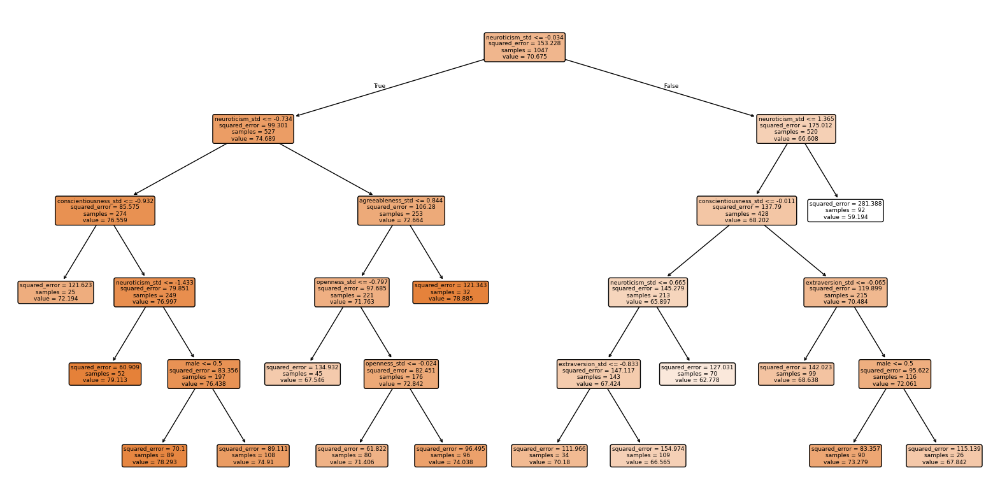

In [ ]:
plt.figure(figsize=(20,10))
plot_tree(
    tree_model,
    feature_names=features,
    filled=True,
    rounded=True)

In [ ]:
print("Feature Importance:")
for feat, imp in zip(features, tree_model.feature_importances_):
    print(f"  {feat}: {imp:.3f}")

Feature Importance:
  openness_std: 0.038
  neuroticism_std: 0.777
  agreeableness_std: 0.041
  extraversion_std: 0.028
  conscientiousness_std: 0.081
  male: 0.034


Assigning each terminal node to a dummy variable

In [ ]:
terminal_indices = tree_model.apply(X)

In [ ]:
print(f"# of observations: {len(terminal_indices)}")
print(f"Each unique terminal node: {np.unique(terminal_indices)}")
print(f"# of terminal nodes: {tree_model.get_n_leaves()}")

# of observations: 1047
Each unique terminal node: [ 3  5  7  8 11 13 14 15 20 21 22 24 26 27 28]
# of terminal nodes: 15


In [ ]:
df['terminal_node'] = terminal_indices

In [ ]:
terminal_dummies = pd.get_dummies(df['terminal_node'], prefix='leaf')
df = pd.concat([df, terminal_dummies], axis=1)

In [ ]:
df.head()

,pidp,agenew,incomecpi,male,neduc,ueduc,oheduc,Alevel,gcse,otheduc,...,leaf_13,leaf_14,leaf_15,leaf_20,leaf_21,leaf_22,leaf_24,leaf_26,leaf_27,leaf_28
0,68035365,57.041667,2493.496375,1,0,0,0,0,0,1,...,False,False,False,False,False,False,False,False,False,True
1,68058485,64.291667,4008.875375,1,0,0,0,0,1,0,...,False,False,False,False,False,False,False,False,False,True
2,68058489,64.291667,4008.875375,0,0,0,0,0,0,1,...,False,False,False,False,True,False,False,False,False,False
3,68064609,57.291667,4231.804125,0,0,0,0,0,1,0,...,False,False,True,False,False,False,False,False,False,False
4,68097245,58.791667,1964.208062,0,0,0,0,0,1,0,...,False,False,False,False,False,True,False,False,False,False


merging the terminal nodes back to the full df (df_old)

In [ ]:
df_old = df_old.merge(df[['pidp', 'terminal_node']], on='pidp', how='left')

relative income measure taking mean (median) of the node and running FE with lincome avdincome and medincome

In [ ]:
# Leave-one-out mean income within terminal node
group_sum = df_old.groupby("terminal_node")["lincome"].transform("sum")
group_count = df_old.groupby("terminal_node")["lincome"].transform("count")

df_old["avgincome"] = np.where(
    group_count > 1,
    (group_sum - df_old["lincome"]) / (group_count - 1),
    np.nan)

# Leave-one-out median income within terminal node
def loo_median(series):
    arr = series.to_numpy()
    out = np.full(len(arr), np.nan)
    for i in range(len(arr)):
        others = np.delete(arr, i)
        others = others[~np.isnan(others)]
        if len(others) > 0:
            out[i] = np.median(others)
    return pd.Series(out, index=series.index)

df_old["medincome"] = (
    df_old.groupby("terminal_node")["lincome"]
    .apply(loo_median)
    .reset_index(level=0, drop=True))

**running** fixed effect regression within the full dataset WITH LOG INCOME

In [ ]:
for i, leaf in enumerate(sorted(df_old['terminal_node'].dropna().unique()), start=1):
    subgroup = df_old[df_old['terminal_node'] == leaf].copy()

    # IMPORTANT: align rows for formula + clustering
    subgroup = subgroup[['pomst', 'lincome', 'lincome_sq', 'pidp']].dropna()

    # If a leaf has too few rows/clusters, skip (optional but avoids other errors)
    if subgroup.empty or subgroup['pidp'].nunique() < 2:
        print(f"\nLeaf {leaf} skipped (obs={len(subgroup)}, clusters={subgroup['pidp'].nunique()})")
        continue

    model = smf.ols('pomst ~ lincome + lincome_sq + C(pidp)', data=subgroup).fit(
        cov_type='cluster',
        cov_kwds={'groups': subgroup['pidp']}
    )

    print(f"\nSubtree {i} (leaf {leaf})")
    print("Number of individuals:", subgroup['pidp'].nunique())
    print("Number of observations:", len(subgroup))
    print(model.summary())


Subtree 1 (leaf 3)
Number of individuals: 25
Number of observations: 600
                            OLS Regression Results                            
Dep. Variable:                  pomst   R-squared:                       0.267
Model:                            OLS   Adj. R-squared:                  0.234
Method:                 Least Squares   F-statistic:                     1123.
Date:                Fri, 27 Mar 2026   Prob (F-statistic):           1.95e-24
Time:                        11:54:27   Log-Likelihood:                -2607.4
No. Observations:                 600   AIC:                             5269.
Df Residuals:                     573   BIC:                             5388.
Df Model:                          26                                         
Covariance Type:              cluster                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------

/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 26, but rank is 2
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 53, but rank is 2
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 90, but rank is 2
  warnings.warn('covariance of constraints does not have full '



Subtree 4 (leaf 8)
Number of individuals: 108
Number of observations: 2592
                            OLS Regression Results                            
Dep. Variable:                  pomst   R-squared:                       0.253
Model:                            OLS   Adj. R-squared:                  0.220
Method:                 Least Squares   F-statistic:                     62.63
Date:                Fri, 27 Mar 2026   Prob (F-statistic):           9.82e-19
Time:                        11:54:27   Log-Likelihood:                -10905.
No. Observations:                2592   AIC:                         2.203e+04
Df Residuals:                    2482   BIC:                         2.267e+04
Df Model:                         109                                         
Covariance Type:              cluster                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------

/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 109, but rank is 2
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 46, but rank is 2
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 81, but rank is 2
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 97, but rank is 2
  warnings.warn('covariance of constraints does not have full '
/usr/lo

                            OLS Regression Results                            
Dep. Variable:                  pomst   R-squared:                       0.302
Model:                            OLS   Adj. R-squared:                  0.272
Method:                 Least Squares   F-statistic:                     64.38
Date:                Fri, 27 Mar 2026   Prob (F-statistic):           2.13e-18
Time:                        11:54:27   Log-Likelihood:                -9498.8
No. Observations:                2304   AIC:                         1.919e+04
Df Residuals:                    2206   BIC:                         1.976e+04
Df Model:                          97                                         
Covariance Type:              cluster                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept               84.6070 

/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 71, but rank is 2
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 100, but rank is 2
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 91, but rank is 2
  warnings.warn('covariance of constraints does not have full '


                            OLS Regression Results                            
Dep. Variable:                  pomst   R-squared:                       0.238
Model:                            OLS   Adj. R-squared:                  0.205
Method:                 Least Squares   F-statistic:                     7.535
Date:                Fri, 27 Mar 2026   Prob (F-statistic):           0.000948
Time:                        11:54:28   Log-Likelihood:                -9112.9
No. Observations:                2160   AIC:                         1.841e+04
Df Residuals:                    2068   BIC:                         1.893e+04
Df Model:                          91                                         
Covariance Type:              cluster                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept               67.5298 

/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 27, but rank is 2
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 93, but rank is 2
  warnings.warn('covariance of constraints does not have full '


In [ ]:
for leaf in sorted(df_old['terminal_node'].unique()):
    subgroup = df_old[df_old['terminal_node'] == leaf]

    # IMPORTANT: align rows for formula + clustering
    subgroup = subgroup[['pomst', 'lincome', 'lincome_sq', 'pidp']].dropna()

    # If a leaf has too few rows/clusters, skip (optional but avoids other errors)
    if subgroup.empty or subgroup['pidp'].nunique() < 2:
        print(f"\nLeaf {leaf} skipped (obs={len(subgroup)}, clusters={subgroup['pidp'].nunique()})")
        continue

    model = smf.ols('pomst ~ lincome + lincome_sq + C(pidp)', data=subgroup).fit(
        cov_type='cluster',
        cov_kwds={'groups': subgroup['pidp']}
    )

    print(f"\nLeaf {leaf}")
    print("Individuals:", subgroup['pidp'].nunique())
    print("Observations:", len(subgroup))
    print("lincome coef:", model.params.get('lincome', np.nan))
    print("lincome_sq coef:", model.params.get('lincome_sq', np.nan))
    print("SE(lincome):", model.bse.get('lincome', np.nan))
    print("SE(lincome_sq):", model.bse.get('lincome_sq', np.nan))
    print("p(lincome):", model.pvalues.get('lincome', np.nan))
    print("p(lincome_sq):", model.pvalues.get('lincome_sq', np.nan))


Leaf 3
Individuals: 25
Observations: 600
lincome coef: 13.1427279828311
lincome_sq coef: -0.9279845067185126
SE(lincome): 2.753584258982493
SE(lincome_sq): 0.2908788928159322
p(lincome): 1.8154425644991657e-06
p(lincome_sq): 0.001421360390202983

Leaf 5
Individuals: 52
Observations: 1248
lincome coef: 2.0944320333667656
lincome_sq coef: -0.1530870541431399
SE(lincome): 3.5745932272700287
SE(lincome_sq): 0.2962691852259374
p(lincome): 0.5579280789944152
p(lincome_sq): 0.6053543643951451

Leaf 7
Individuals: 89
Observations: 2136
lincome coef: -1.0541519525822676
lincome_sq coef: 0.017350466789014612
SE(lincome): 2.914364008818856
SE(lincome_sq): 0.22371827267336233
p(lincome): 0.7175694337905267
p(lincome_sq): 0.9381820529911848

Leaf 8
Individuals: 108
Observations: 2592
lincome coef: -4.358456383696898
lincome_sq coef: 0.3265638759014824
SE(lincome): 3.794029518607565
SE(lincome_sq): 0.28782559351090586
p(lincome): 0.2506520184856996
p(lincome_sq): 0.2565473841984106

Leaf 11
Individ

doing FE regression again this time now with lincome and avgincome/medincome

In [ ]:
for leaf in sorted(df_old['terminal_node'].dropna().unique()):
    subgroup = df_old[df_old['terminal_node'] == leaf].copy()

    subgroup = subgroup[['pomst', 'lincome', 'lincome_sq', 'avgincome', 'pidp']].dropna()

    if subgroup.empty or subgroup['pidp'].nunique() < 2:
        print(f"\nLeaf {leaf} skipped (obs={len(subgroup)}, clusters={subgroup['pidp'].nunique()})")
        continue

    model = smf.ols('pomst ~ lincome + lincome_sq + avgincome + C(pidp)', data=subgroup).fit(
        cov_type='cluster',
        cov_kwds={'groups': subgroup['pidp']})

    print(f"\nLeaf {leaf} | FE: lincome + lincome_sq + avgincome")
    print("Individuals:", subgroup['pidp'].nunique())
    print("Observations:", len(subgroup))
    print("avgincome coef:", model.params.get('avgincome', np.nan))
    print("lincome coef:", model.params.get('lincome', np.nan))
    print("lincome_sq coef:", model.params.get('lincome_sq', np.nan))
    print("SE(lincome):", model.bse.get('lincome', np.nan))
    print("SE(lincome_sq):", model.bse.get('lincome_sq', np.nan))
    print("p(lincome):", model.pvalues.get('lincome', np.nan))
    print("p(lincome_sq):", model.pvalues.get('lincome_sq', np.nan))


Leaf 3 | FE: lincome + lincome_sq + avgincome
Individuals: 25
Observations: 600
avgincome coef: 5.309058106739025
lincome coef: 13.151591185012698
lincome_sq coef: -0.927984506718422
SE(lincome): 2.7550102814758617
SE(lincome_sq): 0.29113304654977595
p(lincome): 1.8087220848839278e-06
p(lincome_sq): 0.0014351200194921692

Leaf 5 | FE: lincome + lincome_sq + avgincome
Individuals: 52
Observations: 1248
avgincome coef: 8.553055253622679
lincome coef: 2.1012909389431
lincome_sq coef: -0.15308705414311397
SE(lincome): 3.5751388421065426
SE(lincome_sq): 0.2963933290341319
p(lincome): 0.5566995301283494
p(lincome_sq): 0.6055054752368059

Leaf 7 | FE: lincome + lincome_sq + avgincome
Individuals: 89
Observations: 2136
avgincome coef: 10.994240940469219
lincome coef: -1.0490024252098005
lincome_sq coef: 0.017350466789053914
SE(lincome): 2.914541128734521
SE(lincome_sq): 0.22377299158642236
p(lincome): 0.7189067594288265
p(lincome_sq): 0.938197138980119

Leaf 8 | FE: lincome + lincome_sq + avg

In [ ]:
for leaf in sorted(df_old['terminal_node'].dropna().unique()):
    subgroup = df_old[df_old['terminal_node'] == leaf].copy()

    subgroup = subgroup[['pomst', 'lincome', 'lincome_sq', 'medincome', 'pidp']].dropna()

    if subgroup.empty or subgroup['pidp'].nunique() < 2:
        print(f"\nLeaf {leaf} skipped (obs={len(subgroup)}, clusters={subgroup['pidp'].nunique()})")
        continue

    model = smf.ols('pomst ~ lincome + lincome_sq + medincome + C(pidp)', data=subgroup).fit(
        cov_type='cluster',
        cov_kwds={'groups': subgroup['pidp']})

    print(f"\nLeaf {leaf} | FE: lincome + lincome_sq + medincome")
    print("Individuals:", subgroup['pidp'].nunique())
    print("Observations:", len(subgroup))
    print("medincome coef:", model.params.get('medincome', np.nan))
    print("lincome coef:", model.params.get('lincome', np.nan))
    print("lincome_sq coef:", model.params.get('lincome_sq', np.nan))
    print("SE(lincome):", model.bse.get('lincome', np.nan))
    print("SE(lincome_sq):", model.bse.get('lincome_sq', np.nan))
    print("p(lincome):", model.pvalues.get('lincome', np.nan))
    print("p(lincome_sq):", model.pvalues.get('lincome_sq', np.nan))


Leaf 3 | FE: lincome + lincome_sq + medincome
Individuals: 25
Observations: 600
medincome coef: 1067.8665506970763
lincome coef: 12.383379014440433
lincome_sq coef: -0.8366261673691411
SE(lincome): 3.3876747685089605
SE(lincome_sq): 0.3842192729586148
p(lincome): 0.0002567598187528699
p(lincome_sq): 0.02944547375178409

Leaf 5 | FE: lincome + lincome_sq + medincome
Individuals: 52
Observations: 1248
medincome coef: -297.2934402066203
lincome coef: 2.3375683616067326
lincome_sq coef: -0.18225054236107863
SE(lincome): 3.5729043690916678
SE(lincome_sq): 0.30839259231361404
p(lincome): 0.5129515323979987
p(lincome_sq): 0.554541017250699

Leaf 7 | FE: lincome + lincome_sq + medincome
Individuals: 89
Observations: 2136
medincome coef: 928.6702560236803
lincome coef: -1.6169790636990884
lincome_sq coef: 0.08161719785078134
SE(lincome): 3.1644629139376996
SE(lincome_sq): 0.2638266789613455
p(lincome): 0.6093646621933463
p(lincome_sq): 0.7570483388346297

Leaf 8 | FE: lincome + lincome_sq + me

adding age, square of age and marital status then estimating a model for each tree to examine relationship between life satisfaction and income

In [ ]:
for i, leaf in enumerate(sorted(df_old['terminal_node'].dropna().unique()), start=1):
    subgroup = df_old[df_old['terminal_node'] == leaf].copy()

    # Keep only needed columns and drop rows with any missing values
    subgroup = subgroup[['pomst', 'lincome', 'lincome_sq',
                         'agenew', 'agesq', 'single', 'married', 'others', 'pidp']].dropna()

    # Skip tiny leaves (cluster SE needs >=2 clusters)
    if subgroup.empty or subgroup['pidp'].nunique() < 2:
        print(f"\nLeaf {leaf} skipped (obs={len(subgroup)}, clusters={subgroup['pidp'].nunique()})")
        continue

    regression_new = 'pomst ~ lincome + lincome_sq + agenew + agesq + single + married + others + C(pidp)'

    model = smf.ols(regression_new, data=subgroup).fit(
        cov_type='cluster',
        cov_kwds={'groups': subgroup['pidp']}
    )

    print(f"\nLeaf {leaf}")
    print("Individuals:", subgroup['pidp'].nunique())
    print("Observations:", len(subgroup))

    print("lincome coef:", model.params['lincome'])
    print("lincome_sq coef:", model.params['lincome_sq'])
    print("Age coef:", model.params['agenew'])
    print("Age^2 coef:", model.params['agesq'])
    print("Single coef:", model.params['single'])
    print("Married coef:", model.params['married'])
    print("Others coef:", model.params['others'])

    print("SE(lincome):", model.bse.get('lincome', np.nan))
    print("SE(lincome_sq):", model.bse.get('lincome_sq', np.nan))
    print("p(lincome):", model.pvalues.get('lincome', np.nan))
    print("p(lincome_sq):", model.pvalues.get('lincome_sq', np.nan))


Leaf 3
Individuals: 25
Observations: 600
lincome coef: 14.546269113876951
lincome_sq coef: -1.0719394041556642
Age coef: 0.068445567695331
Age^2 coef: -0.0027735580097115924
Single coef: 16.534898092938977
Married coef: 10.758415810214274
Others coef: 9.117742230180626
SE(lincome): 3.2083946533107257
SE(lincome_sq): 0.3309642595339664
p(lincome): 5.792765841915987e-06
p(lincome_sq): 0.0012001799609335827

Leaf 5
Individuals: 52
Observations: 1248
lincome coef: 3.4126284957209476
lincome_sq coef: -0.2858736090608776
Age coef: 0.7390517825203946
Age^2 coef: -0.006277632184305338
Single coef: 11.356567800855466
Married coef: 13.341319913683773
Others coef: 9.833643374462614
SE(lincome): 3.4328240318556063
SE(lincome_sq): 0.2844351114170681
p(lincome): 0.3201659428396889
p(lincome_sq): 0.314869218907194

Leaf 7
Individuals: 89
Observations: 2136
lincome coef: -0.6683943821364584
lincome_sq coef: -0.024369373794924848
Age coef: -0.05854166298236636
Age^2 coef: 0.0012333085413764552
Single 

now instead adding age, square of age and education then estimating a model for each tree to examine relationship between life satisfaction and income

In [ ]:
for i, leaf in enumerate(sorted(df_old['terminal_node'].dropna().unique()), start=1):
    subgroup = df_old[df_old['terminal_node'] == leaf].copy()

    # Align rows used by the regression and the clustering
    subgroup = subgroup[['pomst','lincome','lincome_sq','agenew','agesq',
                         'neduc','ueduc','oheduc','Alevel','gcse','otheduc','pidp']].dropna()

    if subgroup.empty or subgroup['pidp'].nunique() < 2:
        print(f"\nLeaf {leaf} skipped (obs={len(subgroup)}, clusters={subgroup['pidp'].nunique()})")
        continue

    regression_new = 'pomst ~ lincome + lincome_sq + agenew + agesq + neduc + ueduc + oheduc + Alevel + gcse + otheduc + C(pidp)'
    model = smf.ols(regression_new, data=subgroup).fit(
        cov_type='cluster',
        cov_kwds={'groups': subgroup['pidp']}
    )

    print(f"\nLeaf {leaf}")
    print("Individuals:", subgroup['pidp'].nunique())
    print("Observations:", len(subgroup))

    print("lincome coef:", model.params['lincome'])
    print("lincome_sq coef:", model.params['lincome_sq'])
    print("Age coef:", model.params['agenew'])
    print("Age^2 coef:", model.params['agesq'])
    print("No Education coef:", model.params['neduc'])
    print("University Education coef:", model.params['ueduc'])
    print("Other higher Education coef:", model.params['oheduc'])
    print("GCSE coef:", model.params['gcse'])
    print("A-level coef:", model.params['Alevel'])
    print("Other Education coef:", model.params['otheduc'])

    print("SE(lincome):", model.bse.get('lincome', np.nan))
    print("SE(lincome_sq):", model.bse.get('lincome_sq', np.nan))
    print("p(lincome):", model.pvalues.get('lincome', np.nan))
    print("p(lincome_sq):", model.pvalues.get('lincome_sq', np.nan))


Leaf 3
Individuals: 25
Observations: 600
lincome coef: 15.038378948862995
lincome_sq coef: -1.1208391665513728
Age coef: -0.004215567286163402
Age^2 coef: -0.0016483244245592303
No Education coef: 23.930752612303767
University Education coef: 0.3066778870451916
Other higher Education coef: -11.79303624392908
GCSE coef: 4.469550428021217
A-level coef: 6.176556810608428
Other Education coef: -0.7485724299255674
SE(lincome): 3.209974028514005
SE(lincome_sq): 0.33084870942803274
p(lincome): 2.8010874084925554e-06
p(lincome_sq): 0.0007046345434633247

Leaf 5
Individuals: 52
Observations: 1248
lincome coef: 3.0252513253796893
lincome_sq coef: -0.2406149397939851
Age coef: 0.8558015470489615
Age^2 coef: -0.007246367950155761
No Education coef: 7.8050678716165525
University Education coef: 4.885248451846598
Other higher Education coef: 3.5971498529655896
GCSE coef: 8.451099858801797
A-level coef: 8.016112062139925
Other Education coef: 6.893341967539371
SE(lincome): 3.431668770837539
SE(linco

including lincome to classify individuals

In [ ]:
features2 = features + ['lincome']

In [ ]:
df_tree2 = df[features2 + [target]].dropna()

In [ ]:
df_tree2.head()

,openness_std,neuroticism_std,agreeableness_std,extraversion_std,conscientiousness_std,male,lincome,pomst
0,1.134772,1.714700,1.334850,0.318156,-0.471428,1,7.793500,40.972220
1,-0.410277,1.714700,-0.626826,-0.449034,-0.471428,1,8.152248,58.333329
2,-1.955325,0.315594,-0.626826,-0.449034,-0.471428,0,8.152248,78.472226
3,0.362247,-0.383959,1.334850,1.085346,1.368915,0,8.226963,61.111114
4,1.134772,1.015147,0.354012,1.852535,-0.471428,0,7.398608,65.972222


In [ ]:
# Prepare X and y
X2 = df_tree2[features2]
y2 = df_tree2[target]

In [ ]:
tree_model2 = dtr(min_samples_leaf=75, criterion='squared_error', splitter='best',random_state=17)
tree_model2.fit(X2, y2)

DecisionTreeRegressor(min_samples_leaf=75, random_state=17)

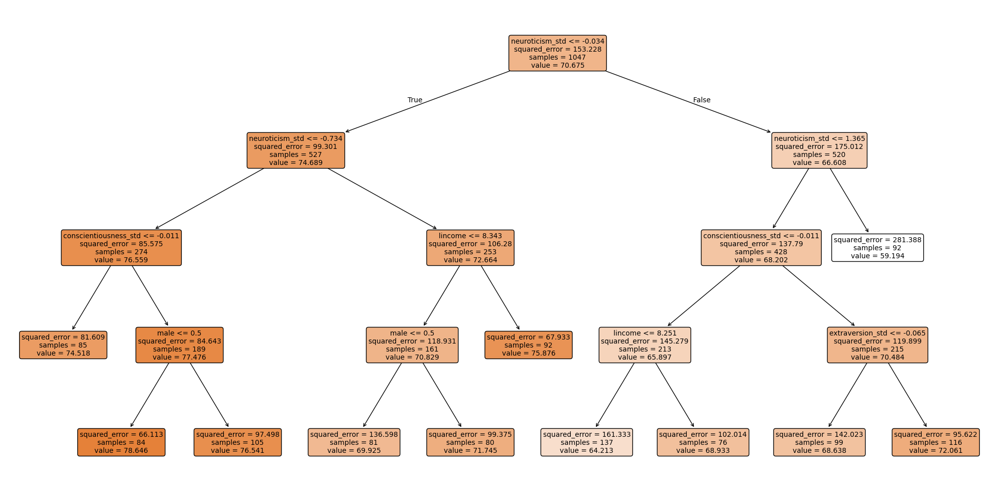

In [ ]:
plt.figure(figsize=(20, 10))
plot_tree(tree_model2,
          feature_names=features2,
          filled=True,
          rounded=True,
          fontsize=10)
plt.tight_layout()

In [ ]:
print("Feature Importance:")
for feat, imp in zip(features2, tree_model2.feature_importances_):
    print(f"  {feat}: {imp:.3f}")

Feature Importance:
  openness_std: 0.000
  neuroticism_std: 0.800
  agreeableness_std: 0.000
  extraversion_std: 0.020
  conscientiousness_std: 0.088
  male: 0.011
  lincome: 0.082


purely classifying decision trees seperately by gender

In [ ]:
features3 = traits + ['neduc','ueduc','oheduc','Alevel','gcse','otheduc']
target = 'pomst'

In [ ]:
df_m = df[df['male'] == 1].copy()
df_f = df[df['male'] == 0].copy()

df_tree3 = df_m[['pidp'] + features3 + [target]].dropna().copy()
df_tree4 = df_f[['pidp'] + features3 + [target]].dropna().copy()

print("Males:", len(df_m), "Females:", len(df_f))

Males: 457 Females: 590


In [ ]:
# Prepare X and y
X3 = df_tree3[features3]
y3 = df_tree3[target]

X4 = df_tree4[features3]
y4 = df_tree4[target]

function for fixed effect regression

male dec tree

In [ ]:
male_search = tree_cv_aic_bic_search(
    X=X3,
    y=y3,
    param_grid=param_grid,
    cv=5,
    random_state=17
)

male_search_results = male_search["results_df"]

print("\nBest male model by CV:")
print(male_search["best_cv_row"])

print("\nBest male model by AIC:")
print(male_search["best_aic_row"])

print("\nBest male model by BIC:")
print(male_search["best_bic_row"])


Best male model by CV:
max_depth                4.000000
min_samples_leaf        25.000000
min_samples_split      100.000000
ccp_alpha                0.000000
n_leaves                 5.000000
mean_cv_mse            106.636915
std_cv_mse              24.360759
rss                  47765.237096
aic                   2134.762093
bic                   2155.385510
Name: 25, dtype: float64

Best male model by AIC:
max_depth                7.000000
min_samples_leaf        25.000000
min_samples_split       50.000000
ccp_alpha                0.000000
n_leaves                13.000000
mean_cv_mse            108.886358
std_cv_mse              29.535686
rss                  44734.625493
aic                   2120.805607
bic                   2174.426491
Name: 60, dtype: float64

Best male model by BIC:
max_depth                4.000000
min_samples_leaf        25.000000
min_samples_split      100.000000
ccp_alpha                0.000000
n_leaves                 5.000000
mean_cv_mse            106

In [ ]:
tree_model3 = male_search["best_cv_model"]
# tree_model3 = male_search["best_aic_model"]
# tree_model3 = male_search["best_bic_model"]

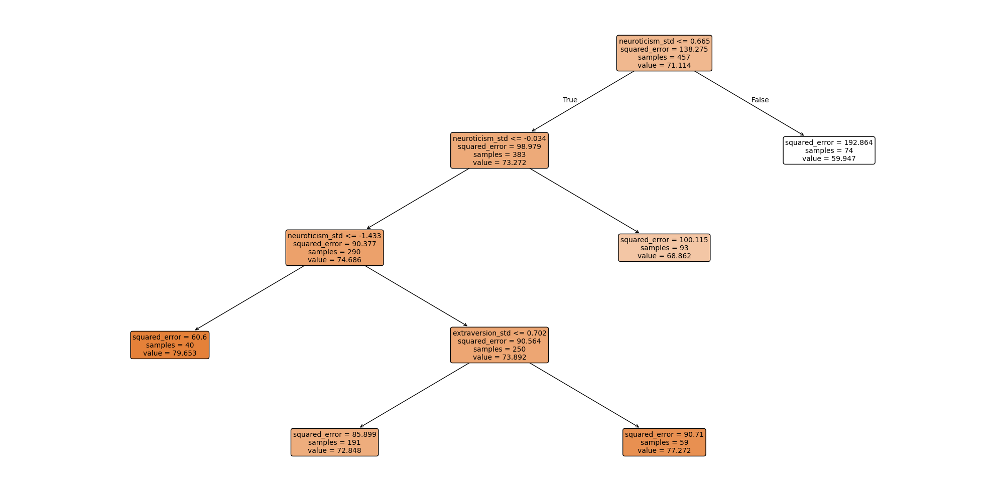

In [ ]:
plt.figure(figsize=(20,10))
plot_tree(
    tree_model3,
    feature_names=features3,
    filled=True,
    rounded=True,
    fontsize=10)
plt.tight_layout()

In [ ]:
print("Feature Importance:")
for feat, imp in zip(features3, tree_model3.feature_importances_):
    print(f"  {feat}: {imp:.3f}")

Feature Importance:
  openness_std: 0.000
  neuroticism_std: 0.943
  agreeableness_std: 0.000
  extraversion_std: 0.057
  conscientiousness_std: 0.000
  neduc: 0.000
  ueduc: 0.000
  oheduc: 0.000
  Alevel: 0.000
  gcse: 0.000
  otheduc: 0.000


female dec tree

In [ ]:
female_search = tree_cv_aic_bic_search(
    X=X4,
    y=y4,
    param_grid=param_grid,
    cv=5,
    random_state=17
)

female_search_results = female_search["results_df"]

print("\nBest female model by CV:")
print(female_search["best_cv_row"])

print("\nBest female model by AIC:")
print(female_search["best_aic_row"])

print("\nBest female model by BIC:")
print(female_search["best_bic_row"])


Best female model by CV:
max_depth                5.000000
min_samples_leaf        50.000000
min_samples_split       50.000000
ccp_alpha                0.000000
n_leaves                 8.000000
mean_cv_mse            146.051525
std_cv_mse              21.824889
rss                  81695.493131
aic                   2925.072631
bic                   2960.113612
Name: 39, dtype: float64

Best female model by AIC:
max_depth                5.000000
min_samples_leaf        25.000000
min_samples_split       50.000000
ccp_alpha                0.000000
n_leaves                14.000000
mean_cv_mse            149.524370
std_cv_mse              22.017659
rss                  78436.460483
aic                   2913.053755
bic                   2974.375470
Name: 36, dtype: float64

Best female model by BIC:
max_depth                3.000000
min_samples_leaf        50.000000
min_samples_split       50.000000
ccp_alpha                0.001000
n_leaves                 4.000000
mean_cv_mse         

In [ ]:
tree_model4 = female_search["best_cv_model"]   # recommended main choice
# tree_model4 = female_search["best_aic_model"]
# tree_model4 = female_search["best_bic_model"]

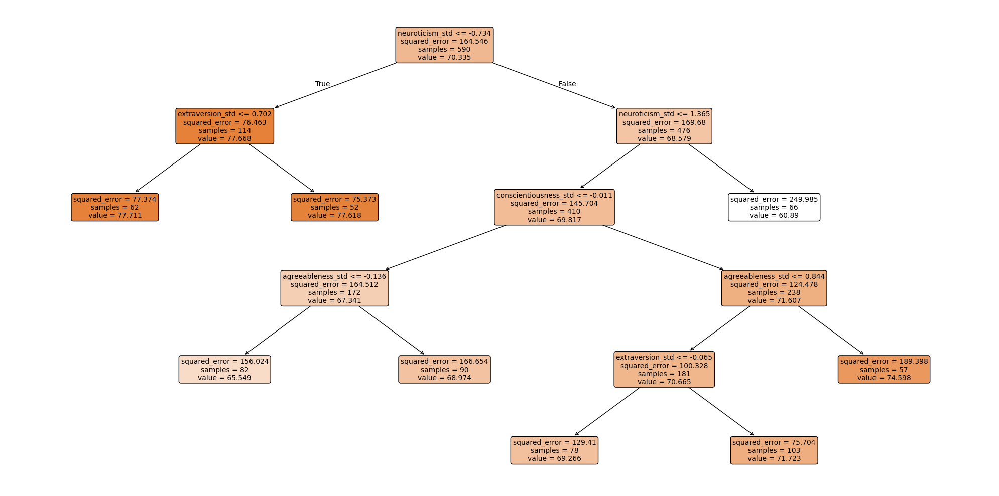

In [ ]:
plt.figure(figsize=(20,10))
plot_tree(
    tree_model4,
    feature_names=features3,
    filled=True,
    rounded=True,
    fontsize=10)

plt.tight_layout()

In [ ]:
print("Feature Importance:")
for feat, imp in zip(features3, tree_model4.feature_importances_):
    print(f"  {feat}: {imp:.3f}")

Feature Importance:
  openness_std: 0.000
  neuroticism_std: 0.788
  agreeableness_std: 0.076
  extraversion_std: 0.017
  conscientiousness_std: 0.118
  neduc: 0.000
  ueduc: 0.000
  oheduc: 0.000
  Alevel: 0.000
  gcse: 0.000
  otheduc: 0.000


assigning each node to a dummy variable (male)

In [ ]:
terminal_indices1 = tree_model3.apply(X3)

print(f"# of observations: {len(terminal_indices1)}")
print(f"Each unique terminal node: {np.unique(terminal_indices1)}")
print(f"# of terminal nodes: {tree_model3.get_n_leaves()}")

# of observations: 457
Each unique terminal node: [3 5 6 7 8]
# of terminal nodes: 5


In [ ]:
df_tree3['terminal_node_m'] = terminal_indices1

terminal_dummies1 = pd.get_dummies(df_tree3['terminal_node_m'], prefix='leaf')
df_tree3 = pd.concat([df_tree3, terminal_dummies1], axis=1)

In [ ]:
df_tree3.head()

,pidp,openness_std,neuroticism_std,agreeableness_std,extraversion_std,conscientiousness_std,neduc,ueduc,oheduc,Alevel,gcse,otheduc,pomst,terminal_node_m,leaf_3,leaf_5,leaf_6,leaf_7,leaf_8
0,68035365,1.134772,1.714700,1.334850,0.318156,-0.471428,0,0,0,0,0,1,40.972220,8,False,False,False,False,True
1,68058485,-0.410277,1.714700,-0.626826,-0.449034,-0.471428,0,0,0,0,1,0,58.333329,8,False,False,False,False,True
7,68138045,1.134772,-0.383959,0.354012,1.852535,0.448744,0,0,1,0,0,0,81.250004,6,False,False,True,False,False
10,68297845,1.134772,-1.083512,0.354012,1.085346,0.448744,0,0,0,0,1,0,84.027781,6,False,False,True,False,False
13,68320965,-0.410277,-1.083512,-0.626826,-0.449034,-0.471428,1,0,0,0,0,0,72.222223,5,False,True,False,False,False


merging the terminal nodes back to the full df (df_old)

In [ ]:
df_old_m = df_old[df_old['male'] == 1].copy()
df_old_f = df_old[df_old['male'] == 0].copy()

In [ ]:
df_old_m = df_old_m.merge(df_tree3[['pidp', 'terminal_node_m']], on='pidp', how='left')

running fixed effect regression within the full dataset (male)

In [ ]:
for leaf in sorted(df_old_m['terminal_node_m'].dropna().unique()):
    subgroup_m = df_old_m[df_old_m['terminal_node_m'] == leaf]


    subgroup_m = subgroup_m[['pomst','lincome','lincome_sq','pidp']].dropna()
    if subgroup_m.empty or subgroup_m['pidp'].nunique() < 2:
        print(f"\nLeaf {leaf} skipped (obs={len(subgroup_m)}, clusters={subgroup_m['pidp'].nunique()})")
        continue

    model = smf.ols('pomst ~ lincome + lincome_sq + C(pidp)', data=subgroup_m).fit(
        cov_type='cluster',
        cov_kwds={'groups': subgroup_m['pidp']}
    )

    print(f"\nLeaf {leaf}")
    print("Individuals:", subgroup_m['pidp'].nunique())
    print("Observations:", len(subgroup_m))
    print("lincome coef:", model.params['lincome'])
    print("lincome_sq coef:", model.params['lincome_sq'])
    print("SE(lincome):", model.bse['lincome'])
    print("SE(lincome_sq):", model.bse.get('lincome_sq', np.nan))
    print("p(lincome):", model.pvalues.get('lincome', np.nan))
    print("p(lincome_sq):", model.pvalues.get('lincome_sq', np.nan))


Leaf 3
Individuals: 40
Observations: 960
lincome coef: -0.5513527232676454
lincome_sq coef: 0.029779872619364156
SE(lincome): 2.603480475870139
SE(lincome_sq): 0.2681755062348236
p(lincome): 0.8322823798254303
p(lincome_sq): 0.9115797058692514

Leaf 5
Individuals: 191
Observations: 4584
lincome coef: 0.5790191494790777
lincome_sq coef: -0.035435924726062384
SE(lincome): 4.436585039574915
SE(lincome_sq): 0.28705127694078747
p(lincome): 0.8961628652149528
p(lincome_sq): 0.9017522976594738

Leaf 6
Individuals: 59
Observations: 1416
lincome coef: 13.752143575957227
lincome_sq coef: -0.748477270160337
SE(lincome): 10.740167030464645
SE(lincome_sq): 0.6797393564201478
p(lincome): 0.20039029944794973
p(lincome_sq): 0.2708427242593622

Leaf 7
Individuals: 93
Observations: 2220
lincome coef: -0.5013677982693403
lincome_sq coef: 0.03577702464065538
SE(lincome): 7.074255284503091
SE(lincome_sq): 0.4612175727520416
p(lincome): 0.9434994955847519
p(lincome_sq): 0.9381694558519938

Leaf 8
Individua

assigning each node to a dummy variable (female)

In [ ]:
terminal_indices2 = tree_model4.apply(X4)

print(f"# of observations: {len(terminal_indices2)}")
print(f"Each unique terminal node: {np.unique(terminal_indices2)}")
print(f"# of terminal nodes: {tree_model4.get_n_leaves()}")

df_tree4['terminal_node_f'] = terminal_indices2

terminal_dummies2 = pd.get_dummies(df_tree4['terminal_node_f'], prefix='leaf')
df_tree4 = pd.concat([df_tree4, terminal_dummies2], axis=1)

df_tree4.head()

# of observations: 590
Each unique terminal node: [ 2  3  7  8 11 12 13 14]
# of terminal nodes: 8


,pidp,openness_std,neuroticism_std,agreeableness_std,extraversion_std,conscientiousness_std,neduc,ueduc,oheduc,Alevel,...,pomst,terminal_node_f,leaf_2,leaf_3,leaf_7,leaf_8,leaf_11,leaf_12,leaf_13,leaf_14
2,68058489,-1.955325,0.315594,-0.626826,-0.449034,-0.471428,0,0,0,0,...,78.472226,7,False,False,True,False,False,False,False,False
3,68064609,0.362247,-0.383959,1.334850,1.085346,1.368915,0,0,0,0,...,61.111114,13,False,False,False,False,False,False,True,False
4,68097245,1.134772,1.015147,0.354012,1.852535,-0.471428,0,0,0,0,...,65.972222,8,False,False,False,True,False,False,False,False
5,68133285,0.362247,1.015147,0.354012,0.318156,-0.471428,0,0,0,1,...,68.055555,8,False,False,False,True,False,False,False,False
6,68137365,-1.955325,-0.383959,1.334850,1.085346,1.368915,1,0,0,0,...,70.138888,13,False,False,False,False,False,False,True,False


merging the terminal nodes back to the full df (df_old)

In [ ]:
df_old_f = df_old_f.merge(df_tree4[['pidp', 'terminal_node_f']], on='pidp', how='left')

running fixed effect regression within the full dataset (female)

In [ ]:
for leaf in sorted(df_old_f['terminal_node_f'].dropna().unique()):
    subgroup_f = df_old_f[df_old_f['terminal_node_f'] == leaf]

    # Align rows for regression + clustering
    subgroup_f = subgroup_f[['pomst','lincome','lincome_sq','pidp']].dropna()

    # Skip if too few individuals
    if subgroup_f.empty or subgroup_f['pidp'].nunique() < 2:
        print(f"\nLeaf {leaf} skipped (obs={len(subgroup_f)}, clusters={subgroup_f['pidp'].nunique()})")
        continue

    model = smf.ols('pomst ~ lincome + lincome_sq + C(pidp)', data=subgroup_f).fit(
        cov_type='cluster',
        cov_kwds={'groups': subgroup_f['pidp']}
    )

    print(f"\nLeaf {leaf}")
    print("Individuals:", subgroup_f['pidp'].nunique())
    print("Observations:", len(subgroup_f))
    print("lincome coef:", model.params['lincome'])
    print("lincome_sq coef:", model.params['lincome_sq'])
    print("SE(lincome):", model.bse['lincome'])
    print("SE(lincome_sq):", model.bse.get('lincome_sq', np.nan))
    print("p(lincome):", model.pvalues.get('lincome', np.nan))
    print("p(lincome_sq):", model.pvalues.get('lincome_sq', np.nan))


Leaf 2.0
Individuals: 62
Observations: 1488
lincome coef: 1.2472517441584832
lincome_sq coef: -0.16817338617392863
SE(lincome): 2.9038657686796774
SE(lincome_sq): 0.1871161822350898
p(lincome): 0.6675490217297053
p(lincome_sq): 0.36877810089182717

Leaf 3.0
Individuals: 52
Observations: 1248
lincome coef: 0.6879626603947995
lincome_sq coef: -0.1055061126897408
SE(lincome): 6.458098870789146
SE(lincome_sq): 0.485010267578751
p(lincome): 0.9151641407748099
p(lincome_sq): 0.8277923912609501

Leaf 7.0
Individuals: 82
Observations: 1968
lincome coef: 3.1002246873159915
lincome_sq coef: -0.3669914138683441
SE(lincome): 3.1312392556199438
SE(lincome_sq): 0.23523932542197828
p(lincome): 0.3221276313912146
p(lincome_sq): 0.11874173348712626

Leaf 8.0
Individuals: 90
Observations: 2160
lincome coef: 4.474327315429231
lincome_sq coef: -0.39568319065518864
SE(lincome): 3.4213460002594025
SE(lincome_sq): 0.24778147712476345
p(lincome): 0.19095196154328098
p(lincome_sq): 0.11028714519072662

Leaf 1

Runninga  more advanced decision tree that doesn't only use life satisfaction but also linear regression in each terminal node

In [ ]:
features_adv = traits + ['incomecpi']
X_adv = df[features_adv]
y_adv = df.loc[X_adv.index, 'pomst']

In [ ]:
model_adv = Cubist(
    n_rules=50,
    n_committees=10)

model_adv.fit(X_adv, y_adv)

Cubist(n_committees=10, n_rules=50)

In [ ]:
print("Features used:", features_adv)
print("Number of features:", len(features_adv))
print("Coefficient columns:", np.asarray(model_adv.coeffs_).shape)

Features used: ['openness_std', 'neuroticism_std', 'agreeableness_std', 'extraversion_std', 'conscientiousness_std', 'incomecpi']
Number of features: 6
Coefficient columns: (10, 9)


In [ ]:
print(model_adv.feature_importances_)
print(features_adv)

   Conditions  Model               Variable
0         0.0  100.0        neuroticism_std
1         0.0   60.0      agreeableness_std
2         0.0   50.0       extraversion_std
3         0.0   50.0  conscientiousness_std
4         0.0   50.0              incomecpi
0         0.0    0.0           openness_std
['openness_std', 'neuroticism_std', 'agreeableness_std', 'extraversion_std', 'conscientiousness_std', 'incomecpi']


In [ ]:
print("coeffs shape:", np.asarray(model_adv.coeffs_).shape)
print(np.asarray(model_adv.coeffs_))

coeffs shape: (10, 9)
[[ 6.886173e+01           nan -4.600000e+00  1.100000e+00  9.000000e-01
   1.100000e+00  7.000000e-04  1.000000e+00  1.000000e+00]
 [ 7.179108e+01           nan -5.200000e+00  1.600000e+00           nan
            nan           nan  2.000000e+00  1.000000e+00]
 [ 6.602466e+01           nan -4.000000e+00           nan  1.900000e+00
   2.300000e+00  1.380000e-03  3.000000e+00  1.000000e+00]
 [ 7.175059e+01           nan -5.000000e+00  2.200000e+00           nan
            nan           nan  4.000000e+00  1.000000e+00]
 [ 6.601774e+01           nan -4.200000e+00           nan  1.800000e+00
   2.100000e+00  1.400000e-03  5.000000e+00  1.000000e+00]
 [ 7.175059e+01           nan -5.000000e+00  2.200000e+00           nan
            nan           nan  6.000000e+00  1.000000e+00]
 [ 6.601774e+01           nan -4.200000e+00           nan  1.800000e+00
   2.100000e+00  1.400000e-03  7.000000e+00  1.000000e+00]
 [ 7.175059e+01           nan -5.000000e+00  2.200000e+00    

In [ ]:
coeffs = np.asarray(model_adv.coeffs_)

cols = [
"Intercept",
"Openness",
"Neuroticism",
"Agreeableness",
"Extraversion",
"Conscientiousness",
"Income",
"Rule",
"Committee"
]

coef_table = pd.DataFrame(coeffs, columns=cols)

print(coef_table)

   Intercept  Openness  Neuroticism  Agreeableness  Extraversion  \
0   68.86173       NaN         -4.6            1.1           0.9   
1   71.79108       NaN         -5.2            1.6           NaN   
2   66.02466       NaN         -4.0            NaN           1.9   
3   71.75059       NaN         -5.0            2.2           NaN   
4   66.01774       NaN         -4.2            NaN           1.8   
5   71.75059       NaN         -5.0            2.2           NaN   
6   66.01774       NaN         -4.2            NaN           1.8   
7   71.75059       NaN         -5.0            2.2           NaN   
8   66.01774       NaN         -4.2            NaN           1.8   
9   71.75059       NaN         -5.0            2.2           NaN   

   Conscientiousness   Income  Rule  Committee  
0                1.1  0.00070   1.0        1.0  
1                NaN      NaN   2.0        1.0  
2                2.3  0.00138   3.0        1.0  
3                NaN      NaN   4.0        1.0  
4     

In [ ]:
from sklearn.metrics import mean_squared_error

pred = model_adv.predict(X_adv)
rmse = np.sqrt(mean_squared_error(y_adv, pred))
print("RMSE:", rmse)

RMSE: 11.054750730290161


In [ ]:
df['pomst'].describe()

,pomst
count,1047.000000
mean,70.675476
std,12.384463
min,15.277780
25%,63.888889
50%,72.916665
75%,79.166670
max,97.916668


First setting up variables/configuration for function

In [ ]:
Model_FE = {
    "No FE":        "",
    "pidp FE":      "+ C(pidp)",
    "pidp+year FE": "+ C(pidp) + C(yearid)",}

Controls = {
    "None":     [],
    "Age_c":     ["agenew", "agesq"],
    "Household_c": ["agenew", "agesq", "onemember", "twomember", "member34"],
    "Education_c":    ["agenew", "agesq", "neduc", "ueduc", "oheduc", "Alevel", "gcse"],
    "All_c":     ["agenew", "agesq", "onemember", "twomember", "member34",
                 "neduc", "ueduc", "oheduc", "Alevel", "gcse"],}

In [ ]:
Income_c = {
    "lincome_only": {
        "required": ["pomst", "lincome", "pidp", "yearid"],
        "mod": "pomst ~ lincome",
        "relative_income_var": None,
        "has_quadratic": False,
        "has_relative_income": False,
        "plot_var": "lincome"
    },

    "lincome_avgincome": {
        "required": ["pomst", "lincome", "avgincome", "pidp", "yearid"],
        "mod": "pomst ~ lincome + avgincome",
        "relative_income_var": "avgincome",
        "has_quadratic": False,
        "has_relative_income": True,
        "plot_var": "avgincome"
    },

    "lincome_medincome": {
        "required": ["pomst", "lincome", "medincome", "pidp", "yearid"],
        "mod": "pomst ~ lincome + medincome",
        "relative_income_var": "medincome",
        "has_quadratic": False,
        "has_relative_income": True,
        "plot_var": "medincome"
    },

    "lincome_quad": {
        "required": ["pomst", "lincome", "lincome_sq", "pidp", "yearid"],
        "mod": "pomst ~ lincome + lincome_sq",
        "relative_income_var": None,
        "has_quadratic": True,
        "has_relative_income": False,
        "plot_var": "lincome"
    },

    "lincome_quad_avgincome": {
        "required": ["pomst", "lincome", "lincome_sq", "avgincome", "pidp", "yearid"],
        "mod": "pomst ~ lincome + lincome_sq + avgincome",
        "relative_income_var": "avgincome",
        "has_quadratic": True,
        "has_relative_income": True,
        "plot_var": "avgincome"
    },

    "lincome_quad_medincome": {
        "required": ["pomst", "lincome", "lincome_sq", "medincome", "pidp", "yearid"],
        "mod": "pomst ~ lincome + lincome_sq + medincome",
        "relative_income_var": "medincome",
        "has_quadratic": True,
        "has_relative_income": True,
        "plot_var": "medincome"
    }
}

In [ ]:
def IncLifeSat_model(df_sample, node_id, label=""):

    results = []
    models  = {}

    for leaf in sorted(df_sample[node_id].dropna().unique()):
        sub = df_sample[df_sample[node_id] == leaf].copy()

        for ctrl_name, ctrl_vars in Controls.items():
            for spec_name, fe_term in Model_FE.items():
                for income_type, spec in Income_c.items():

                    needed = list(dict.fromkeys(spec["required"] + ctrl_vars))
                    sub_clean = sub[needed].dropna()

                    if sub_clean.empty or sub_clean["pidp"].nunique() < 2:
                        continue

                    formula = spec["mod"]
                    if ctrl_vars:
                        formula += " + " + " + ".join(ctrl_vars)
                    if fe_term:
                        formula += " " + fe_term

                    try:
                        model = smf.ols(formula, data=sub_clean).fit(
                            cov_type="cluster",
                            cov_kwds={"groups": sub_clean["pidp"]}
                        )
                    except Exception as e:
                        print(f"  [{income_type}] leaf={leaf} | {ctrl_name} | {spec_name}: {e}")
                        continue

                    models[(label, leaf, income_type, ctrl_name, spec_name)] = model

                    rel_var = spec["relative_income_var"]

                    results.append({
                        "sample": label,
                        "leaf": leaf,
                        "income_type": income_type,
                        "controls": ctrl_name,
                        "fe_spec": spec_name,

                        "coef_lincome": model.params.get("lincome", np.nan),
                        "pval_lincome": model.pvalues.get("lincome", np.nan),
                        "coef_lincome_sq": model.params.get("lincome_sq", np.nan),

                        "pval_lincome_sq": model.pvalues.get("lincome_sq", np.nan),
                        "coef_rel_income": model.params.get(rel_var, np.nan) if rel_var else np.nan,
                        "pval_rel_income": model.pvalues.get(rel_var, np.nan) if rel_var else np.nan,

                        "se_lincome": model.bse.get("lincome", np.nan),
                        "se_lincome_sq": model.bse.get("lincome_sq", np.nan),
                        "se_rel_income": model.bse.get(rel_var, np.nan) if rel_var else np.nan,

                        "observations_no": int(model.nobs),
                    })

    return pd.DataFrame(results), models

In [ ]:
results_all,    models_all    = IncLifeSat_model(df_old,   "terminal_node",   label="All")
results_male,   models_male   = IncLifeSat_model(df_old_m, "terminal_node_m", label="Male")
results_female, models_female = IncLifeSat_model(df_old_f, "terminal_node_f", label="Female")

results_df = pd.concat([results_all, results_male, results_female], ignore_index=True)
all_models = {**models_all, **models_male, **models_female}

print(results_df.to_string())

      sample  leaf             income_type     controls       fe_spec  coef_lincome  pval_lincome  coef_lincome_sq  pval_lincome_sq  coef_rel_income  pval_rel_income  se_lincome  se_lincome_sq  se_rel_income  observations_no
0        All   3.0            lincome_only         None         No FE     -1.689581  4.624681e-01              NaN              NaN              NaN              NaN    2.299410            NaN            NaN              600
1        All   3.0       lincome_avgincome         None         No FE     -1.671974  4.667722e-01              NaN              NaN        10.546355     5.542957e-06    2.297485            NaN       2.321394              600
2        All   3.0       lincome_medincome         None         No FE      1.098713  6.876484e-01              NaN              NaN      6089.277826     1.387033e-01    2.732788            NaN    4112.606400              600
3        All   3.0            lincome_quad         None         No FE     20.804207  1.065608e-36   

checking numbers

In [ ]:
print("All leaves:",    df_old['terminal_node'].dropna().nunique())
print("Male leaves:",   df_old_m['terminal_node_m'].dropna().nunique())
print("Female leaves:", df_old_f['terminal_node_f'].dropna().nunique())

All leaves: 15
Male leaves: 5
Female leaves: 8


In [ ]:
leaf_counts = {
    "All": df_old['terminal_node'].dropna().nunique(),
    "Male": df_old_m['terminal_node_m'].dropna().nunique(),
    "Female": df_old_f['terminal_node_f'].dropna().nunique(),
}

for name, n_leaves in leaf_counts.items():
    combos = n_leaves * 6 * 5 * 3
    print(f"{name}: {n_leaves} leaves × 6 × 5 × 3 = {combos} rows")

print("Total:", sum(n * 6 * 5 * 3 for n in leaf_counts.values()))

All: 15 leaves × 6 × 5 × 3 = 1350 rows
Male: 5 leaves × 6 × 5 × 3 = 450 rows
Female: 8 leaves × 6 × 5 × 3 = 720 rows
Total: 2520


In [ ]:
print(f"Total models stored: {len(all_models)}")

Total models stored: 2520


Making pystout tables

In [ ]:
def make_pystout_table(all_models, sample, income_type, controls, fe_spec, filename):

    spec = Income_c[income_type]

    # Filter matching models
    matched = {
        key: model
        for key, model in all_models.items()
        if key[0] == sample
        and key[2] == income_type
        and key[3] == controls
        and key[4] == fe_spec
    }

    if not matched:
        print(f"No models found for: {sample} | {income_type} | {controls} | {fe_spec}")
        return

    # Sort by leaf number
    matched    = dict(sorted(matched.items(), key=lambda x: x[0][1]))
    model_list = list(matched.values())
    col_labels = [f"Leaf {key[1]}" for key in matched.keys()]

    # Which variables to show
    if spec["has_quadratic"] and spec["has_relative_income"]:
        show_vars = ["lincome", "lincome_sq", spec["relative_income_var"]]
    elif spec["has_quadratic"]:
        show_vars = ["lincome", "lincome_sq"]
    elif spec["has_relative_income"]:
        show_vars = ["lincome", spec["relative_income_var"]]
    else:
        show_vars = ["lincome"]

    pystout(
        models       = model_list,
        file         = filename,
        digits       = 4,
        exogvars     = show_vars,
        endog_names  = col_labels,
        stars        = {0.01: "***", 0.05: "**", 0.1: "*"},
        addrows      = {"Observations": [str(int(m.nobs)) for m in model_list]},
        addnotes     = ["Clustered SEs at individual (pidp) level.",
                        f"Sample: {sample} | Controls: {controls} | FE: {fe_spec}"],
        title        = f"Life Satisfaction and Relative Income ({income_type}) — {sample}, {controls}, {fe_spec}",
        label        = f"tab:rel_{income_type}_{sample.lower()}",
        footnotesize = "footnotesize",
    )
    print(f"Saved: {filename}")

Plots

In [ ]:
def save_all_main_coefficient_plots(results_df, out_dir="."):
    plot_specs = [
        ("coef_lincome", "se_lincome", "lincome_only"),
        ("coef_lincome", "se_lincome", "lincome_quad"),
        ("coef_lincome_sq", "se_lincome_sq", "lincome_quad"),
        ("coef_rel_income", "se_rel_income", "lincome_avgincome"),
        ("coef_rel_income", "se_rel_income", "lincome_medincome"),
        ("coef_rel_income", "se_rel_income", "lincome_quad_avgincome"),
        ("coef_rel_income", "se_rel_income", "lincome_quad_medincome"),
    ]

    for sample in ["All", "Male", "Female"]:
        for coef_col, se_col, income_type in plot_specs:
            df_plot = results_df[
                (results_df["sample"] == sample) &
                (results_df["income_type"] == income_type) &
                (results_df["controls"] == "All_c") &
                (results_df["fe_spec"] == "pidp+year FE")
            ].copy()

            df_plot = df_plot.sort_values("leaf").dropna(subset=[coef_col, se_col])

            if df_plot.empty:
                continue

            plt.figure(figsize=(10, 6))
            plt.errorbar(
                df_plot["leaf"],
                df_plot[coef_col],
                yerr=1.96 * df_plot[se_col],
                fmt='o',
                capsize=4
            )
            plt.axhline(0, linestyle='--')
            plt.xlabel("Leaf")
            plt.ylabel(coef_col)
            plt.title(f"{sample}: {coef_col} | {income_type}")
            plt.tight_layout()

            fname = f"{out_dir}/{sample.lower()}_{income_type}_{coef_col}.png"
            plt.savefig(fname, dpi=300, bbox_inches="tight")
            plt.close()

            print(f"Saved {fname}")

In [ ]:
def find_best_quadratic_leaf(results_df, sample="All"):
    df_pick = results_df[
        (results_df["sample"] == sample) &
        (results_df["income_type"] == "lincome_quad") &
        (results_df["controls"] == "All_c") &
        (results_df["fe_spec"] == "pidp+year FE")
    ].copy()

    # Keep only leaves where both lincome and lincome_sq are significant
    df_pick = df_pick[
        (df_pick["pval_lincome"] < 0.05) &
        (df_pick["pval_lincome_sq"] < 0.05)
    ]

    if df_pick.empty:
        print(f"No significant quadratic leaf found for {sample}")
        return None

    # pick the strongest one
    df_pick["strength"] = df_pick["coef_lincome"].abs() + df_pick["coef_lincome_sq"].abs()
    best_row = df_pick.sort_values("strength", ascending=False).iloc[0]

    return int(best_row["leaf"])

In [ ]:
def plot_income_relationship(
    model,
    df,
    title="",
    relative_var=None,
    plot_relative=False
):
    import numpy as np
    import matplotlib.pyplot as plt

    b1 = model.params.get("lincome", 0)
    b2 = model.params.get("lincome_sq", 0)
    b_rel = model.params.get(relative_var, 0) if relative_var else 0

    plt.figure(figsize=(8, 5))

    if plot_relative and relative_var:
        x = np.linspace(
            df[relative_var].min(skipna=True),
            df[relative_var].max(skipna=True),
            200
        )

        # Hold own income fixed at its mean
        lincome_mean = df["lincome"].mean(skipna=True)

        y = b_rel * (x - x.mean())

        plt.plot(x, y)
        plt.axhline(0, linestyle="--")
        plt.xlabel(relative_var)
        plt.ylabel("Predicted life satisfaction")
        plt.title(title)
        plt.tight_layout()
        plt.show()

    else:
        x = np.linspace(
            df["lincome"].min(skipna=True),
            df["lincome"].max(skipna=True),
            200
        )

        y = b1 * x + b2 * (x ** 2)

        plt.plot(x, y)
        plt.axhline(0, linestyle="--")
        plt.xlabel("Log income")
        plt.ylabel("Predicted life satisfaction (income component)")
        plt.title(title)

        if b2 != 0:
            turning_point = -b1 / (2 * b2)
            print(f"Turning point (log income): {turning_point:.3f}")

        plt.tight_layout()
        plt.show()


In [ ]:
def compare_models(models, df, labels, title="Income relationship comparison"):
    import numpy as np
    import matplotlib.pyplot as plt

    x = np.linspace(
        df["lincome"].min(skipna=True),
        df["lincome"].max(skipna=True),
        200
    )

    plt.figure(figsize=(8, 5))

    for model, label in zip(models, labels):
        b1 = model.params.get("lincome", 0)
        b2 = model.params.get("lincome_sq", 0)

        y = b1 * x + b2 * (x ** 2)
        plt.plot(x, y, label=label)

        if b2 != 0:
            turning_point = -b1 / (2 * b2)
            print(f"{label} turning point (log income): {turning_point:.3f}")

    plt.axhline(0, linestyle="--")
    plt.xlabel("Log income")
    plt.ylabel("Predicted life satisfaction (income component)")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()

Selected All-sample leaf: 22
Turning point (log income): 8.148


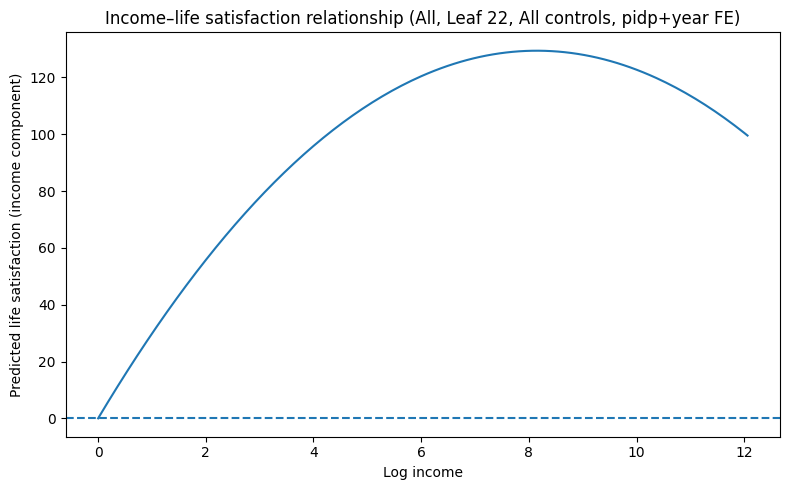

No controls turning point (log income): 7.652
All controls turning point (log income): 8.148


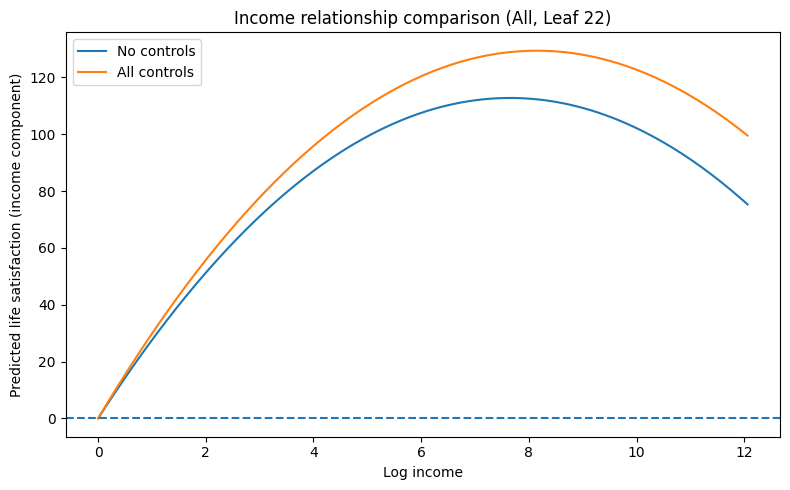

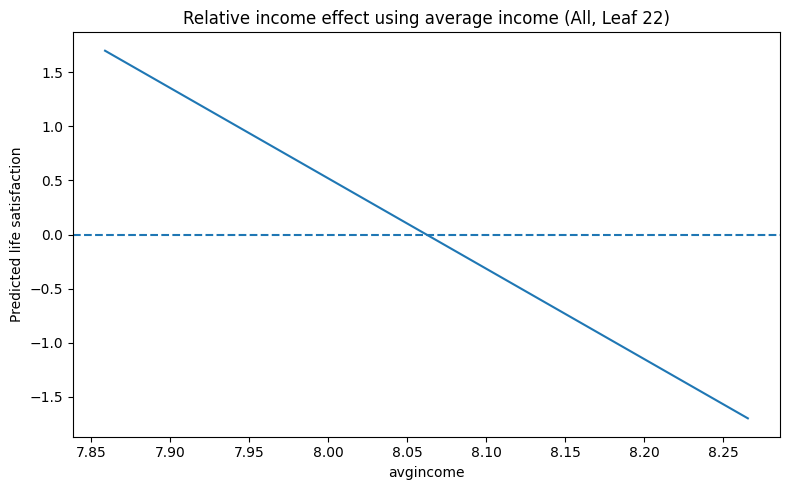

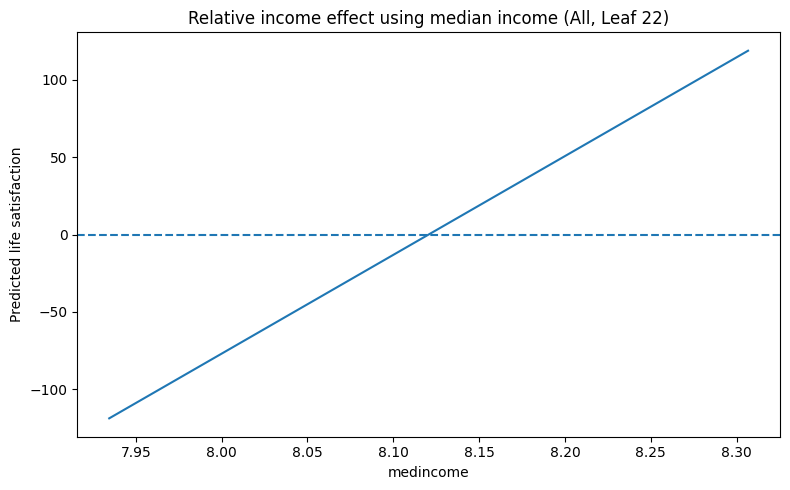

In [ ]:
# 1. Pick best leaf automatically for All sample
# ------------------------------------------------------------

leaf_all = find_best_quadratic_leaf(results_df, sample="All")
print("Selected All-sample leaf:", leaf_all)

if leaf_all is not None:
    # Main quadratic model
    model_all_main = all_models[("All", leaf_all, "lincome_quad", "All_c", "pidp+year FE")]

    plot_income_relationship(
        model_all_main,
        df_old,
        title=f"Income–life satisfaction relationship (All, Leaf {leaf_all}, All controls, pidp+year FE)"
    )

    # No controls vs all controls
    model_all_no_controls = all_models[("All", leaf_all, "lincome_quad", "None", "pidp FE")]
    model_all_with_controls = all_models[("All", leaf_all, "lincome_quad", "All_c", "pidp+year FE")]

    compare_models(
        [model_all_no_controls, model_all_with_controls],
        df_old,
        ["No controls", "All controls"],
        title=f"Income relationship comparison (All, Leaf {leaf_all})"
    )

    # Relative income based on average
    model_all_avg_rel = all_models[("All", leaf_all, "lincome_quad_avgincome", "All_c", "pidp+year FE")]

    plot_income_relationship(
        model_all_avg_rel,
        df_old,
        title=f"Relative income effect using average income (All, Leaf {leaf_all})",
        relative_var="avgincome",
        plot_relative=True
    )

    # Relative income based on median
    model_all_med_rel = all_models[("All", leaf_all, "lincome_quad_medincome", "All_c", "pidp+year FE")]

    plot_income_relationship(
        model_all_med_rel,
        df_old,
        title=f"Relative income effect using median income (All, Leaf {leaf_all})",
        relative_var="medincome",
        plot_relative=True
    )

In [ ]:
# 2. Male and Female best leaves
# ------------------------------------------------------------

leaf_male = find_best_quadratic_leaf(results_df, sample="Male")
leaf_female = find_best_quadratic_leaf(results_df, sample="Female")

print("Selected Male leaf:", leaf_male)
print("Selected Female leaf:", leaf_female)

if leaf_male is not None:
    model_male_main = all_models[("Male", leaf_male, "lincome_quad", "All_c", "pidp+year FE")]

    plot_income_relationship(
        model_male_main,
        df_old_m,
        title=f"Income–life satisfaction relationship (Male, Leaf {leaf_male})"
    )

if leaf_female is not None:
    model_female_main = all_models[("Female", leaf_female, "lincome_quad", "All_c", "pidp+year FE")]

    plot_income_relationship(
        model_female_main,
        df_old_f,
        title=f"Income–life satisfaction relationship (Female, Leaf {leaf_female})"
    )

if leaf_male is not None and leaf_female is not None:
    compare_models(
        [
            all_models[("Male", leaf_male, "lincome_quad", "All_c", "pidp+year FE")],
            all_models[("Female", leaf_female, "lincome_quad", "All_c", "pidp+year FE")]
        ],
        df_old,
        ["Male", "Female"],
        title="Male vs Female income relationship"
    )

No significant quadratic leaf found for Male
No significant quadratic leaf found for Female
Selected Male leaf: None
Selected Female leaf: None


Selected Male leaf: 6
Selected Female leaf: 14


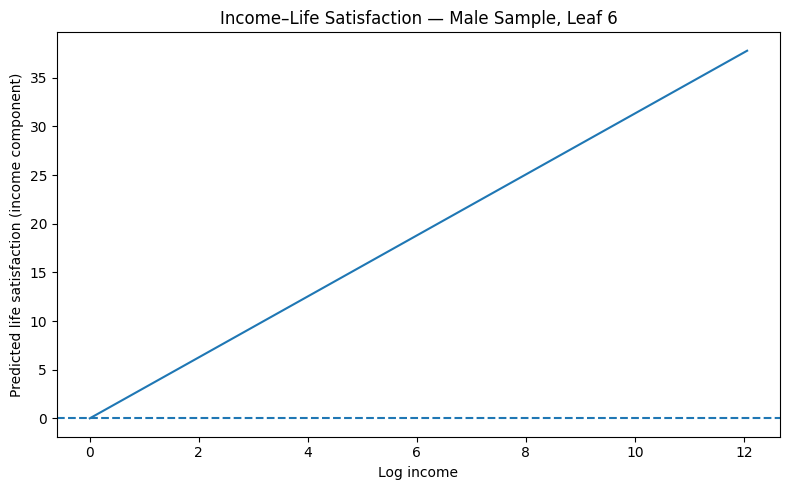

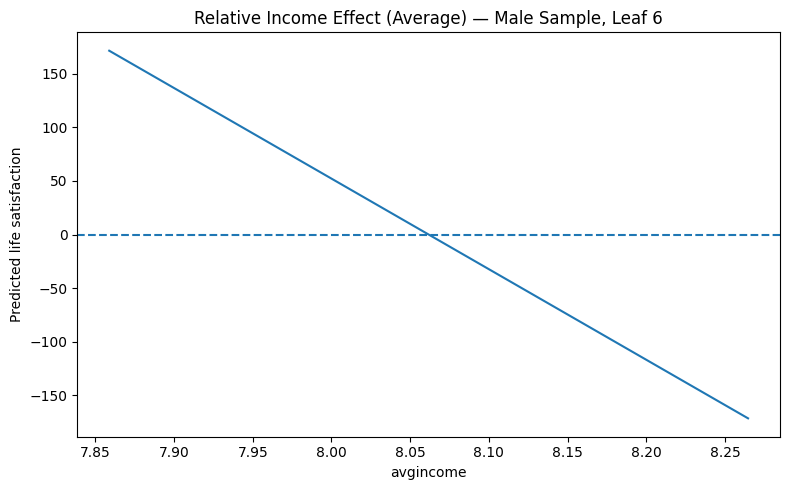

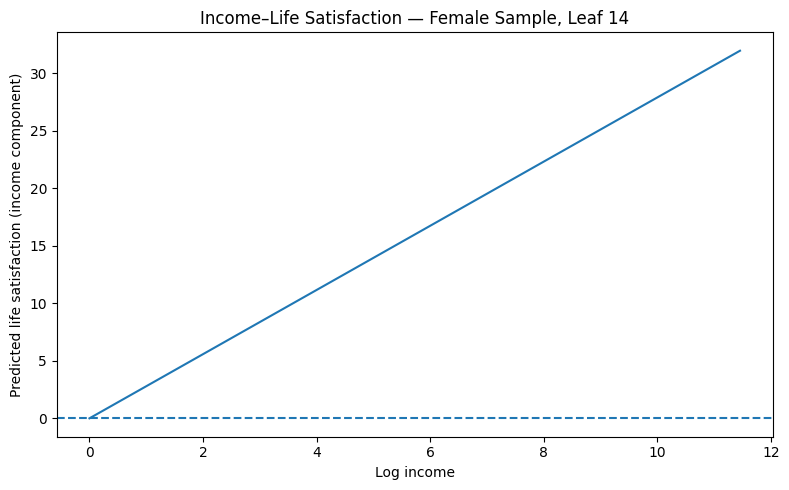

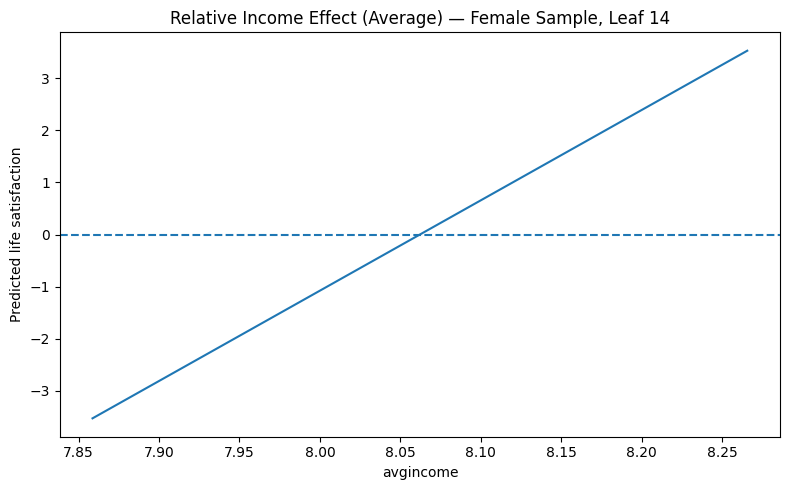

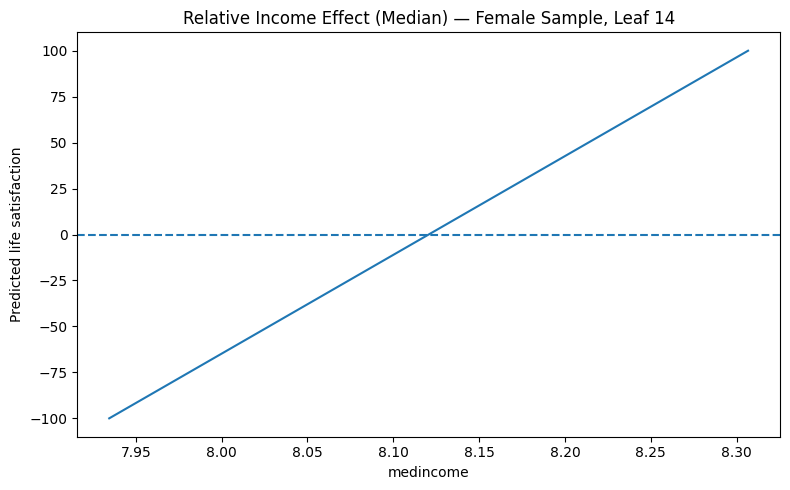

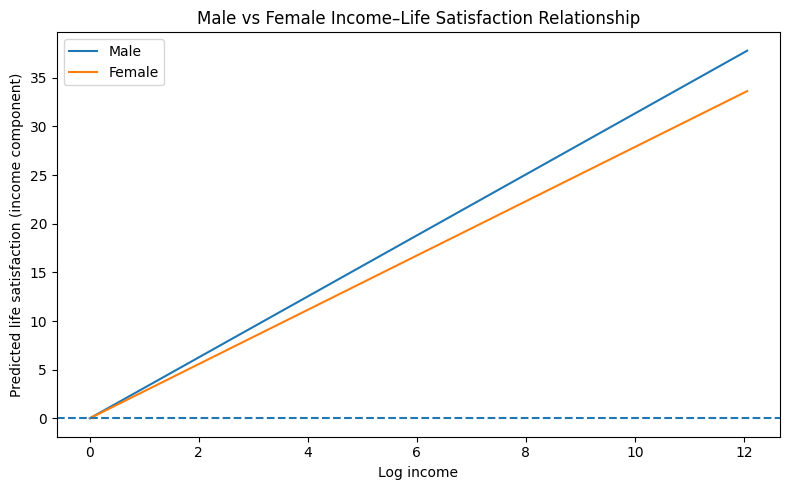

In [ ]:
# 2. Male and Female best leaves
# ------------------------------------------------------------

# For male/female use lincome_only since quadratic is not significant
def find_best_linear_leaf(results_df, sample):
    df_pick = results_df[
        (results_df["sample"] == sample) &
        (results_df["income_type"] == "lincome_only") &
        (results_df["controls"] == "All_c") &
        (results_df["fe_spec"] == "pidp+year FE")
    ].copy()

    df_pick = df_pick[df_pick["pval_lincome"] < 0.05]

    if df_pick.empty:
        print(f"No significant linear leaf found for {sample}")
        return None

    df_pick["strength"] = df_pick["coef_lincome"].abs()
    best_row = df_pick.sort_values("strength", ascending=False).iloc[0]
    return int(best_row["leaf"])

leaf_male   = find_best_linear_leaf(results_df, sample="Male")
leaf_female = find_best_linear_leaf(results_df, sample="Female")

print("Selected Male leaf:", leaf_male)
print("Selected Female leaf:", leaf_female)

# Male own income plot
if leaf_male is not None:
    model_male_main = all_models[("Male", leaf_male, "lincome_only", "All_c", "pidp+year FE")]
    plot_income_relationship(
        model_male_main,
        df_old_m,
        title=f"Income–Life Satisfaction — Male Sample, Leaf {leaf_male}"
    )

    # Male relative income plots
    model_male_avg = all_models[("Male", leaf_male, "lincome_avgincome", "All_c", "pidp+year FE")]
    plot_income_relationship(
        model_male_avg,
        df_old_m,
        title=f"Relative Income Effect (Average) — Male Sample, Leaf {leaf_male}",
        relative_var="avgincome",
        plot_relative=True
    )

# Female own income plot
if leaf_female is not None:
    model_female_main = all_models[("Female", leaf_female, "lincome_only", "All_c", "pidp+year FE")]
    plot_income_relationship(
        model_female_main,
        df_old_f,
        title=f"Income–Life Satisfaction — Female Sample, Leaf {leaf_female}"
    )

    # Female relative income plots
    model_female_avg = all_models[("Female", leaf_female, "lincome_avgincome", "All_c", "pidp+year FE")]
    plot_income_relationship(
        model_female_avg,
        df_old_f,
        title=f"Relative Income Effect (Average) — Female Sample, Leaf {leaf_female}",
        relative_var="avgincome",
        plot_relative=True
    )

    model_female_med = all_models[("Female", leaf_female, "lincome_medincome", "All_c", "pidp+year FE")]
    plot_income_relationship(
        model_female_med,
        df_old_f,
        title=f"Relative Income Effect (Median) — Female Sample, Leaf {leaf_female}",
        relative_var="medincome",
        plot_relative=True
    )

# Male vs Female comparison
if leaf_male is not None and leaf_female is not None:
    compare_models(
        [
            all_models[("Male",   leaf_male,   "lincome_only", "All_c", "pidp+year FE")],
            all_models[("Female", leaf_female, "lincome_only", "All_c", "pidp+year FE")]
        ],
        df_old,
        ["Male", "Female"],
        title="Male vs Female Income–Life Satisfaction Relationship"
    )

test statistics for results_df

In [ ]:
# Basic summary statistics for all numeric columns
print(results_df.describe())

            leaf  coef_lincome  pval_lincome  coef_lincome_sq  \
count  2520.0000   2520.000000  2.520000e+03      1260.000000   
mean     12.2500      0.994411  4.343027e-01        -0.026708   
std       7.7596      7.160452  3.066679e-01         0.673340   
min       2.0000    -38.270820  1.065608e-36        -2.365370   
25%       6.7500     -1.355577  1.619468e-01        -0.255793   
50%      11.0000      0.278740  4.117145e-01         0.017740   
75%      16.2500      2.421988  6.952632e-01         0.288222   
max      28.0000     41.361366  9.998654e-01         2.631111   

       pval_lincome_sq  coef_rel_income  pval_rel_income   se_lincome  \
count     1.260000e+03      1680.000000     1.680000e+03  2520.000000   
mean      4.338739e-01      -300.945622     3.798839e-01     3.342772   
std       3.163379e-01      2340.812573     3.353248e-01     3.373178   
min       1.050750e-16    -14195.011406     1.274435e-58     0.598231   
25%       1.512112e-01      -346.509105     3.570

In [ ]:
# Value counts for categorical columns
print("\nSamples:")
print(results_df["sample"].value_counts())

print("\nIncome types:")
print(results_df["income_type"].value_counts())

print("\nControls:")
print(results_df["controls"].value_counts())

print("\nFE specs:")
print(results_df["fe_spec"].value_counts())


Samples:
sample
All       1350
Female     720
Male       450
Name: count, dtype: int64

Income types:
income_type
lincome_only              420
lincome_avgincome         420
lincome_medincome         420
lincome_quad              420
lincome_quad_avgincome    420
lincome_quad_medincome    420
Name: count, dtype: int64

Controls:
controls
None           504
Age_c          504
Household_c    504
Education_c    504
All_c          504
Name: count, dtype: int64

FE specs:
fe_spec
No FE           840
pidp FE         840
pidp+year FE    840
Name: count, dtype: int64


In [ ]:
# Significant results summary (p < 0.05)
print("\nSignificant lincome results (p < 0.05):")
print(results_df[results_df["pval_lincome"] < 0.05][["sample", "leaf", "income_type", "controls", "fe_spec", "coef_lincome", "pval_lincome"]])

print("\nSignificant relative income results (p < 0.05):")
print(results_df[results_df["pval_rel_income"] < 0.05][["sample", "leaf", "income_type", "controls", "fe_spec", "coef_rel_income", "pval_rel_income"]])


Significant lincome results (p < 0.05):
      sample  leaf             income_type controls       fe_spec  \
3        All   3.0            lincome_quad     None         No FE   
4        All   3.0  lincome_quad_avgincome     None         No FE   
5        All   3.0  lincome_quad_medincome     None         No FE   
9        All   3.0            lincome_quad     None       pidp FE   
10       All   3.0  lincome_quad_avgincome     None       pidp FE   
...      ...   ...                     ...      ...           ...   
2509  Female  14.0       lincome_avgincome    All_c       pidp FE   
2510  Female  14.0       lincome_medincome    All_c       pidp FE   
2514  Female  14.0            lincome_only    All_c  pidp+year FE   
2515  Female  14.0       lincome_avgincome    All_c  pidp+year FE   
2516  Female  14.0       lincome_medincome    All_c  pidp+year FE   

      coef_lincome  pval_lincome  
3        20.804207  1.065608e-36  
4        20.806392  1.188596e-36  
5        20.602744  1.824

test

Turning point (log income): 7.316


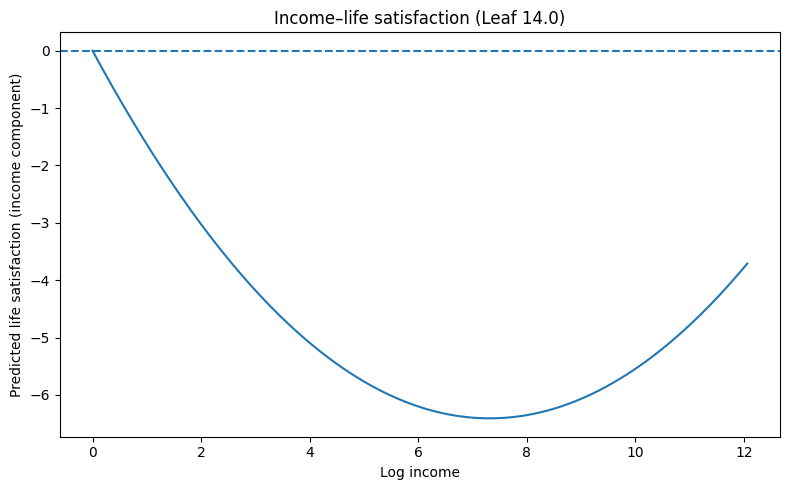

In [ ]:
model_all_c = all_models[("All", leaf, "lincome_quad", "All_c", "pidp+year FE")]

plot_income_relationship(
    model_all_c,
    df_old,
    title=f"Income–life satisfaction (Leaf {leaf})")

In [ ]:
print(df_old["incomecpi"].describe())

count     25128.000000
mean       4085.248531
std        2994.112986
min           0.000000
25%        2209.953000
50%        3486.187500
75%        5209.436000
max      173162.300000
Name: incomecpi, dtype: float64


fixed leaf test cell

Turning point (log income): 7.081


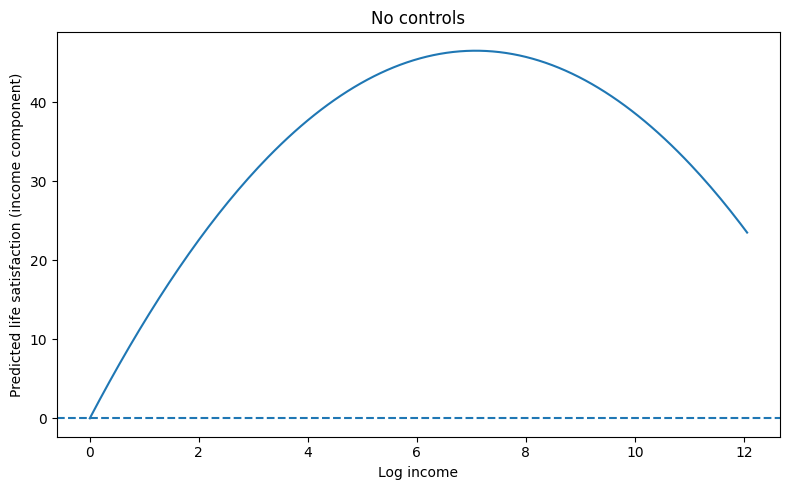

Turning point (log income): 6.741


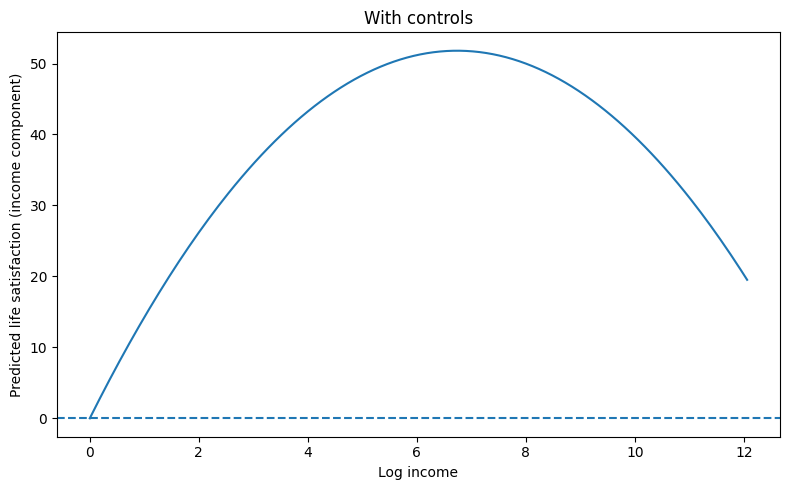

In [ ]:
# No controls
model_no_c = all_models[("All", 3, "lincome_quad", "None", "pidp FE")]

# With controls
model_all_c = all_models[("All", 3, "lincome_quad", "All_c", "pidp+year FE")]

plot_income_relationship(model_no_c, df_old, "No controls")
plot_income_relationship(model_all_c, df_old, "With controls")

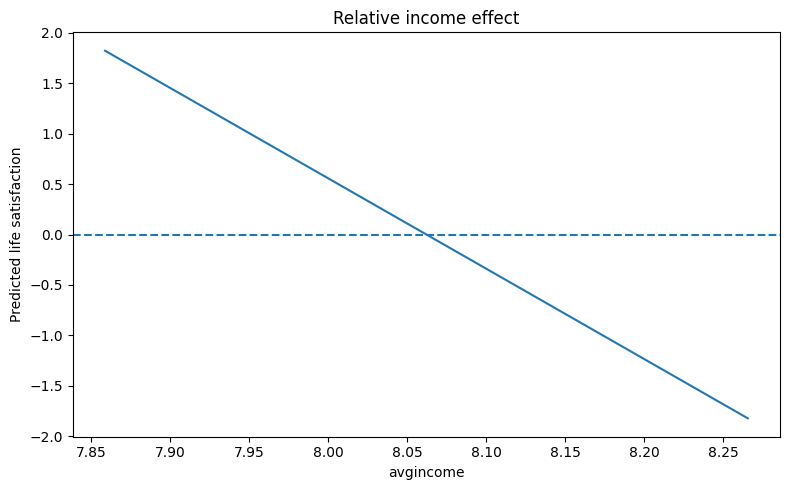

In [ ]:
model_rel = all_models[("All", 3, "lincome_quad_avgincome", "All_c", "pidp+year FE")]

plot_income_relationship(
    model_rel,
    df_old,
    title="Relative income effect",
    relative_var="avgincome",
    plot_relative=True
)

latex

In [ ]:
if not hasattr(pd.DataFrame, 'append'):
    pd.DataFrame.append = lambda self, other, **kwargs: pd.concat(
        [self, pd.DataFrame([other]) if isinstance(other, dict) else other],
        ignore_index=kwargs.get('ignore_index', False)
    )

In [ ]:
ctrl_label_map = {
    "None": "No",
    "Age_c": "Age",
    "Household_c": "Household",
    "Education_c": "Education",
    "All_c": "All"
}

income_label_map = {
    "lincome_only": "own income",
    "lincome_avgincome": "own income and average relative income",
    "lincome_medincome": "own income and median relative income",
    "lincome_quad": "own income (quadratic)",
    "lincome_quad_avgincome": "own income (quadratic) and average relative income",
    "lincome_quad_medincome": "own income (quadratic) and median relative income",
}

fe_label_map = {
    "No FE": "No FE",
    "pidp FE": "PIDP FE",
    "pidp+year FE": "PIDP + year FE",
}

In [ ]:
def make_panel_tabular(results_df, income_type, sample, controls, fe_specs_list, filename):
    """
    Builds a LaTeX TABULAR ONLY.
    No \begin{table}...\end{table}, so it can be wrapped in resizebox/adjustbox in LaTeX.
    """

    lines = []

    spec     = Income_c[income_type]
    has_quad = spec["has_quadratic"]
    has_rel  = spec["has_relative_income"]
    rel_var  = spec["relative_income_var"]

    n_fe = len(fe_specs_list)

    if has_quad and has_rel:
        vars_per_fe = 3
        var_labels  = [r"lincome", r"lincome$^2$", rel_var]
    elif has_quad:
        vars_per_fe = 2
        var_labels  = [r"lincome", r"lincome$^2$"]
    elif has_rel:
        vars_per_fe = 2
        var_labels  = [r"lincome", rel_var]
    else:
        vars_per_fe = 1
        var_labels  = [r"lincome"]

    total_cols = 1 + vars_per_fe * n_fe
    col_format = "c" * total_cols

    lines.append(rf"\begin{{tabular}}{{{col_format}}}")
    lines.append(r"\hline\hline")

    fe_header = r"Leaf"
    for fe_name in fe_specs_list:
        fe_header += rf" & \multicolumn{{{vars_per_fe}}}{{c}}{{{fe_label_map.get(fe_name, fe_name)}}}"
    lines.append(fe_header + r" \\")

    var_header = ""
    for _ in fe_specs_list:
        for v in var_labels:
            var_header += f" & {v}"
    lines.append(var_header + r" \\")
    lines.append(r"\hline")

    def fmt_coef(coef, se, pval):
        if pd.isna(coef):
            return "—", ""
        stars = ""
        if pval < 0.01:
            stars = "^{***}"
        elif pval < 0.05:
            stars = "^{**}"
        elif pval < 0.10:
            stars = "^{*}"
        coef_str = f"${coef:.3f}{stars}$"
        se_str   = f"$({se:.3f})$" if not pd.isna(se) else ""
        return coef_str, se_str

    leaves = sorted(results_df[
        (results_df["sample"] == sample) &
        (results_df["income_type"] == income_type) &
        (results_df["controls"] == controls) &
        (results_df["fe_spec"] == fe_specs_list[0])
    ]["leaf"].dropna().unique())

    for leaf in leaves:
        coef_row = f"{int(leaf)}"
        se_row   = ""

        for fe_name in fe_specs_list:
            row = results_df[
                (results_df["sample"] == sample) &
                (results_df["income_type"] == income_type) &
                (results_df["controls"] == controls) &
                (results_df["fe_spec"] == fe_name) &
                (results_df["leaf"] == leaf)
            ]

            if row.empty:
                coef_row += " & —" * vars_per_fe
                se_row   += " & " * vars_per_fe
                continue

            r = row.iloc[0]

            if has_quad and has_rel:
                c1, s1 = fmt_coef(r["coef_lincome"],    r["se_lincome"],    r["pval_lincome"])
                c2, s2 = fmt_coef(r["coef_lincome_sq"], r["se_lincome_sq"], r["pval_lincome_sq"])
                c3, s3 = fmt_coef(r["coef_rel_income"], r["se_rel_income"], r["pval_rel_income"])
                coef_row += f" & {c1} & {c2} & {c3}"
                se_row   += f" & {s1} & {s2} & {s3}"
            elif has_quad:
                c1, s1 = fmt_coef(r["coef_lincome"],    r["se_lincome"],    r["pval_lincome"])
                c2, s2 = fmt_coef(r["coef_lincome_sq"], r["se_lincome_sq"], r["pval_lincome_sq"])
                coef_row += f" & {c1} & {c2}"
                se_row   += f" & {s1} & {s2}"
            elif has_rel:
                c1, s1 = fmt_coef(r["coef_lincome"],    r["se_lincome"],    r["pval_lincome"])
                c3, s3 = fmt_coef(r["coef_rel_income"], r["se_rel_income"], r["pval_rel_income"])
                coef_row += f" & {c1} & {c3}"
                se_row   += f" & {s1} & {s3}"
            else:
                c1, s1 = fmt_coef(r["coef_lincome"], r["se_lincome"], r["pval_lincome"])
                coef_row += f" & {c1}"
                se_row   += f" & {s1}"

        lines.append(coef_row + r" \\")
        lines.append(se_row + r" \\")

    lines.append(r"\hline\hline")
    lines.append(
        rf"\multicolumn{{{total_cols}}}{{c}}{{\footnotesize "
        rf"$^{{***}}p<0.01$, $^{{**}}p<0.05$, $^*p<0.10$. "
        rf"Controls: {ctrl_label_map.get(controls, controls)}.}} \\"
    )
    lines.append(r"\end{tabular}")

    latex = "\n".join(lines)
    with open(filename, "w") as f:
        f.write(latex)

    print(f"Saved: {filename}")
    return latex

<>:4: SyntaxWarning: invalid escape sequence '\e'
<>:4: SyntaxWarning: invalid escape sequence '\e'
/tmp/ipykernel_43511/1545177772.py:4: SyntaxWarning: invalid escape sequence '\e'
  No \begin{table}...\end{table}, so it can be wrapped in resizebox/adjustbox in LaTeX.


In [ ]:
# ── Generate one TABULAR-ONLY file per control set ───────────────────────────

fe_specs  = ["No FE", "pidp FE", "pidp+year FE"]
ctrl_sets = ["None", "Age_c", "Household_c", "Education_c", "All_c"]

for income_type, prefix in [
    ("lincome_only", "Lin"),
    ("lincome_avgincome", "LinAvg"),
    ("lincome_medincome", "LinMed"),
    ("lincome_quad", "A"),
    ("lincome_quad_avgincome", "B"),
    ("lincome_quad_medincome", "C"),
]:
    for sample in ["All", "Male", "Female"]:
        for ctrl in ctrl_sets:
            fname = f"tabular_{prefix}_{sample.lower()}_{ctrl}.tex"

            make_panel_tabular(
                results_df,
                income_type=income_type,
                sample=sample,
                controls=ctrl,
                fe_specs_list=fe_specs,
                filename=fname,
            )

Saved: tabular_Lin_all_None.tex
Saved: tabular_Lin_all_Age_c.tex
Saved: tabular_Lin_all_Household_c.tex
Saved: tabular_Lin_all_Education_c.tex
Saved: tabular_Lin_all_All_c.tex
Saved: tabular_Lin_male_None.tex
Saved: tabular_Lin_male_Age_c.tex
Saved: tabular_Lin_male_Household_c.tex
Saved: tabular_Lin_male_Education_c.tex
Saved: tabular_Lin_male_All_c.tex
Saved: tabular_Lin_female_None.tex
Saved: tabular_Lin_female_Age_c.tex
Saved: tabular_Lin_female_Household_c.tex
Saved: tabular_Lin_female_Education_c.tex
Saved: tabular_Lin_female_All_c.tex
Saved: tabular_LinAvg_all_None.tex
Saved: tabular_LinAvg_all_Age_c.tex
Saved: tabular_LinAvg_all_Household_c.tex
Saved: tabular_LinAvg_all_Education_c.tex
Saved: tabular_LinAvg_all_All_c.tex
Saved: tabular_LinAvg_male_None.tex
Saved: tabular_LinAvg_male_Age_c.tex
Saved: tabular_LinAvg_male_Household_c.tex
Saved: tabular_LinAvg_male_Education_c.tex
Saved: tabular_LinAvg_male_All_c.tex
Saved: tabular_LinAvg_female_None.tex
Saved: tabular_LinAvg_femal

In [ ]:
from google.colab import files
import glob
import zipfile

In [ ]:
print(glob.glob("tabular_*.tex"))

['tabular_LinMed_female_Education_c.tex', 'tabular_A_female_None.tex', 'tabular_Lin_male_Education_c.tex', 'tabular_LinAvg_all_Education_c.tex', 'tabular_LinAvg_male_Education_c.tex', 'tabular_B_female_Education_c.tex', 'tabular_A_male_All_c.tex', 'tabular_C_male_Age_c.tex', 'tabular_LinMed_all_None.tex', 'tabular_LinMed_all_Age_c.tex', 'tabular_A_all_Education_c.tex', 'tabular_A_female_Household_c.tex', 'tabular_C_all_Age_c.tex', 'tabular_C_male_Household_c.tex', 'tabular_LinAvg_all_None.tex', 'tabular_A_female_All_c.tex', 'tabular_Lin_all_Household_c.tex', 'tabular_LinAvg_all_All_c.tex', 'tabular_A_male_None.tex', 'tabular_Lin_all_None.tex', 'tabular_LinMed_male_Age_c.tex', 'tabular_LinMed_female_None.tex', 'tabular_B_all_Household_c.tex', 'tabular_C_female_None.tex', 'tabular_Lin_male_Household_c.tex', 'tabular_C_male_Education_c.tex', 'tabular_A_all_Age_c.tex', 'tabular_LinAvg_female_None.tex', 'tabular_LinMed_female_All_c.tex', 'tabular_Lin_male_None.tex', 'tabular_B_male_Househol

In [ ]:
matches = sorted(glob.glob("tabular_*.tex"))
print("Matched files:", matches)
print("Current working directory:", os.getcwd())

if not matches:
    print("No tabular_*.tex files found.")
else:
    with zipfile.ZipFile("tables.zip", "w") as zf:
        for f in matches:
                zf.write(f)
                print(f"Added: {f}")

    print("Created zip:", os.path.exists("tables.zip"), os.path.getsize("tables.zip"))
    files.download("tables.zip")

Matched files: ['tabular_A_all_Age_c.tex', 'tabular_A_all_All_c.tex', 'tabular_A_all_Education_c.tex', 'tabular_A_all_Household_c.tex', 'tabular_A_all_None.tex', 'tabular_A_female_Age_c.tex', 'tabular_A_female_All_c.tex', 'tabular_A_female_Education_c.tex', 'tabular_A_female_Household_c.tex', 'tabular_A_female_None.tex', 'tabular_A_male_Age_c.tex', 'tabular_A_male_All_c.tex', 'tabular_A_male_Education_c.tex', 'tabular_A_male_Household_c.tex', 'tabular_A_male_None.tex', 'tabular_B_all_Age_c.tex', 'tabular_B_all_All_c.tex', 'tabular_B_all_Education_c.tex', 'tabular_B_all_Household_c.tex', 'tabular_B_all_None.tex', 'tabular_B_female_Age_c.tex', 'tabular_B_female_All_c.tex', 'tabular_B_female_Education_c.tex', 'tabular_B_female_Household_c.tex', 'tabular_B_female_None.tex', 'tabular_B_male_Age_c.tex', 'tabular_B_male_All_c.tex', 'tabular_B_male_Education_c.tex', 'tabular_B_male_Household_c.tex', 'tabular_B_male_None.tex', 'tabular_C_all_Age_c.tex', 'tabular_C_all_All_c.tex', 'tabular_C_all

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

graphs

In [ ]:
income_plot_label = {
    "lincome_only": "Own income",
    "lincome_avgincome": "Own income + average relative income",
    "lincome_medincome": "Own income + median relative income",
    "lincome_quad": "Own income (quadratic)",
    "lincome_quad_avgincome": "Own income (quadratic) + average relative income",
    "lincome_quad_medincome": "Own income (quadratic) + median relative income",
}

controls_plot_label = {
    "None": "No controls",
    "Age_c": "Age controls",
    "Household_c": "Household controls",
    "Education_c": "Education controls",
    "All_c": "All controls",
}

fe_plot_label = {
    "No FE": "No FE",
    "pidp FE": "pidp FE",
    "pidp+year FE": "pidp + year FE",}

In [ ]:
def plot_income_lifsat(results_df, all_models, df, label, leaf,
                       node_col='terminal_node',
                       fe_spec='pidp+year FE', controls='All_c', n_points=100):

    leaf = np.int64(leaf)

    subgroup = df[df[node_col] == leaf].copy()

    if subgroup.empty:
        print(f"No data found for leaf {leaf} in {node_col}")
        return

    lincome_mean    = subgroup['lincome'].mean()
    avgincome_mean  = subgroup['avgincome'].mean() if 'avgincome' in subgroup.columns else 0
    medincome_mean  = subgroup['medincome'].mean() if 'medincome' in subgroup.columns else 0

    lincome_range   = np.linspace(subgroup['lincome'].min(),   subgroup['lincome'].max(),   n_points)
    avgincome_range = np.linspace(subgroup['avgincome'].min(), subgroup['avgincome'].max(), n_points) if 'avgincome' in subgroup.columns else lincome_range
    medincome_range = np.linspace(subgroup['medincome'].min(), subgroup['medincome'].max(), n_points) if 'medincome' in subgroup.columns else lincome_range

    # linear specs on top row, quadratic on bottom row
    specs = [
        ('lincome_only',           None,        lincome_range,   'Log Income (lincome)',    False),
        ('lincome_avgincome',      'avgincome', avgincome_range, 'Average Relative Income', True),
        ('lincome_medincome',      'medincome', medincome_range, 'Median Relative Income',  True),
        ('lincome_quad',           None,        lincome_range,   'Log Income (lincome)',    False),
        ('lincome_quad_avgincome', 'avgincome', avgincome_range, 'Average Relative Income', True),
        ('lincome_quad_medincome', 'medincome', medincome_range, 'Median Relative Income',  True),
    ]

    fig, axes = plt.subplots(2, 3, figsize=(15, 9))
    axes = axes.flatten()

    for ax, (income_type, rel_var, x_range, x_label, hold_lincome) in zip(axes, specs):

        model_key = (label, leaf, income_type, controls, fe_spec)
        if model_key not in all_models:
            ax.set_title(f'{income_plot_label.get(income_type, income_type)}\n(model not found)', fontsize=9)
            ax.axis('off')
            continue

        model  = all_models[model_key]
        params = model.params

        pred = np.zeros(n_points)

        if 'Intercept' in params:
            pred += params['Intercept']

        if hold_lincome:
            # vary relative income on x-axis, hold lincome at leaf mean
            if 'lincome' in params:
                pred += params['lincome'] * lincome_mean
            if 'lincome_sq' in params:
                pred += params['lincome_sq'] * (lincome_mean ** 2)
            if rel_var in params:
                pred += params[rel_var] * x_range
        else:
            # vary lincome on x-axis
            if 'lincome' in params:
                pred += params['lincome'] * x_range
            if 'lincome_sq' in params:
                pred += params['lincome_sq'] * (x_range ** 2)
            # hold relative income at leaf mean
            if rel_var and rel_var in params:
                pred += params[rel_var] * (avgincome_mean if rel_var == 'avgincome' else medincome_mean)

        for var in ['agenew', 'agesq', 'single', 'married', 'others']:
            if var in params and var in subgroup.columns:
                pred += params[var] * subgroup[var].mean()

        title_str = income_plot_label.get(income_type, income_type)
        ax.plot(x_range, pred, linewidth=2)
        ax.set_xlabel(x_label, fontsize=9)
        ax.set_ylabel('Predicted pomst', fontsize=9)
        ax.set_title(title_str, fontsize=10)
        ax.grid(True, alpha=0.3)

        row = results_df[
            (results_df['sample'] == label) &
            (results_df['leaf'] == leaf) &
            (results_df['income_type'] == income_type) &
            (results_df['controls'] == controls) &
            (results_df['fe_spec'] == fe_spec)
        ]
        if not row.empty:
            p_lin = row['pval_lincome'].values[0]
            p_sq  = row['pval_lincome_sq'].values[0]
            p_rel = row['pval_rel_income'].values[0]

            sig_lines = [f'p(lincome)={p_lin:.3f}']
            if not np.isnan(p_sq):
                sig_lines.append(f'p(lincome_sq)={p_sq:.3f}')
            if not np.isnan(p_rel):
                sig_lines.append(f'p({rel_var})={p_rel:.3f}')

            ax.text(0.05, 0.95, '\n'.join(sig_lines),
                    transform=ax.transAxes, fontsize=7,
                    verticalalignment='top',
                    bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.4))

    fig.suptitle(
        f'Predicted Life Satisfaction vs Income\n'
        f'Sample: {label} | Leaf: {int(leaf)} | '
        f'FE: {fe_plot_label.get(fe_spec, fe_spec)} | '
        f'Controls: {controls_plot_label.get(controls, controls)}',
        fontsize=11, y=1.01
    )
    plt.tight_layout()

    fname = f'plot_{label}_leaf{int(leaf)}_{controls}_{fe_spec.replace("+","_").replace(" ","_")}.png'
    plt.savefig(fname, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'Saved: {fname}')

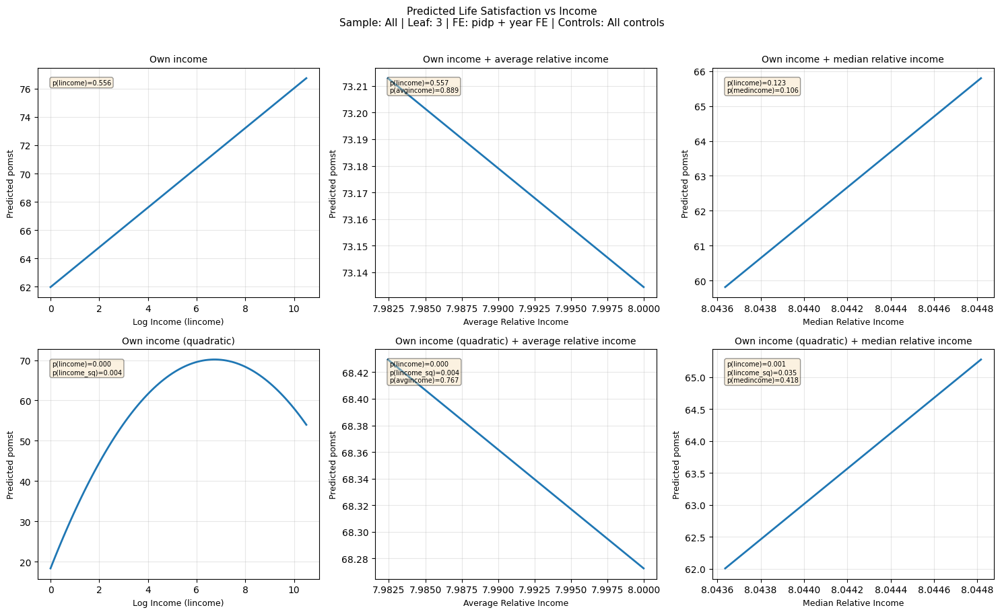

Saved: plot_All_leaf3_All_c_pidp_year_FE.png


In [ ]:
# Section 4.1 - All sample
plot_income_lifsat(results_df, all_models, df_old,   label='All',    leaf=3.0)

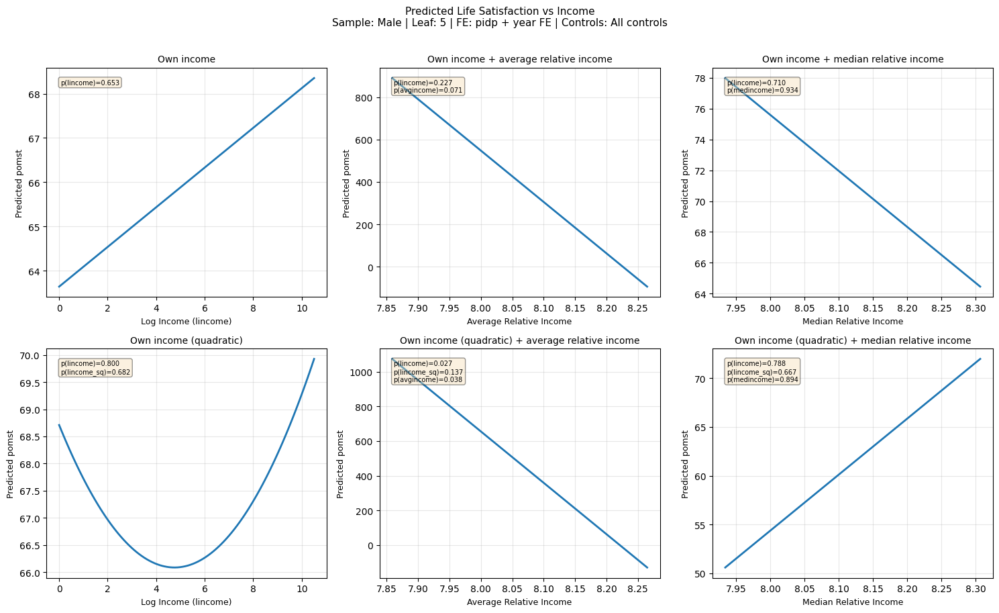

Saved: plot_Male_leaf5_All_c_pidp_year_FE.png


In [ ]:
# Section 4.2 - Male sample
plot_income_lifsat(results_df, all_models, df_old_m, label='Male',   leaf=5.0,  node_col='terminal_node_m')

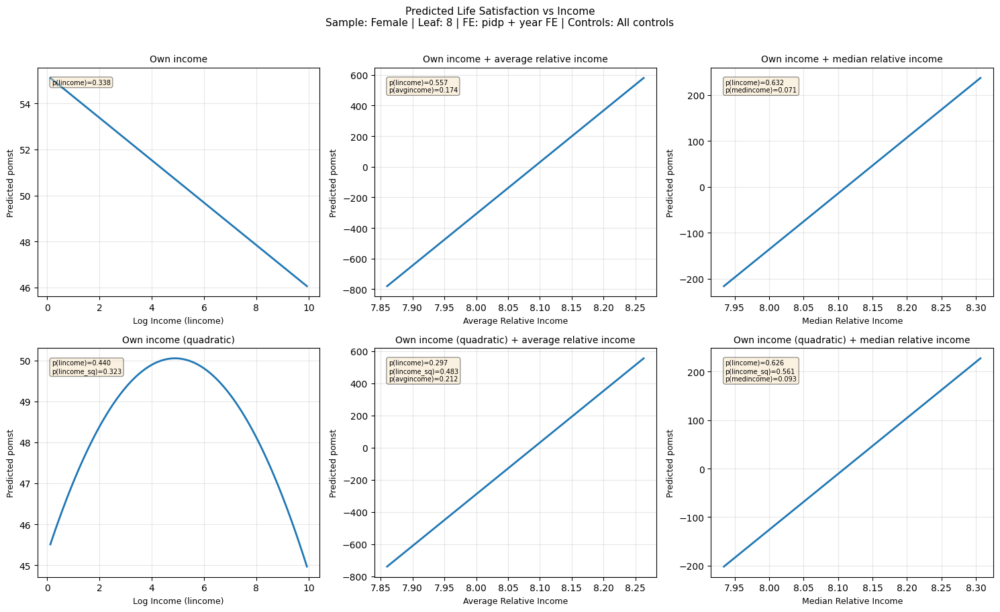

Saved: plot_Female_leaf8_All_c_pidp_year_FE.png


In [ ]:
# Section 4.3 - Female sample
plot_income_lifsat(results_df, all_models, df_old_f, label='Female', leaf=8.0,  node_col='terminal_node_f')

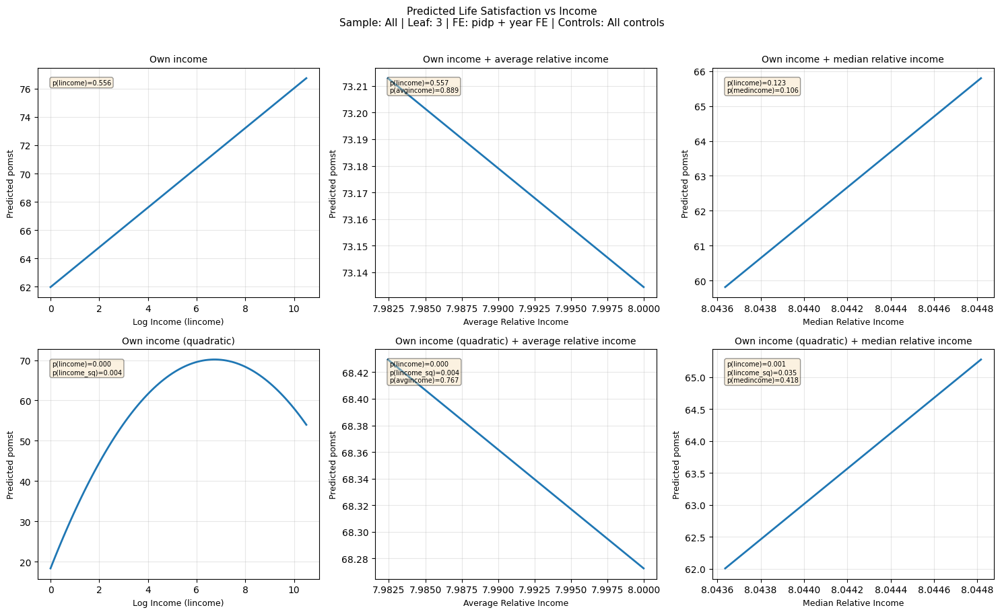

Saved: plot_All_leaf3_All_c_pidp_year_FE.png


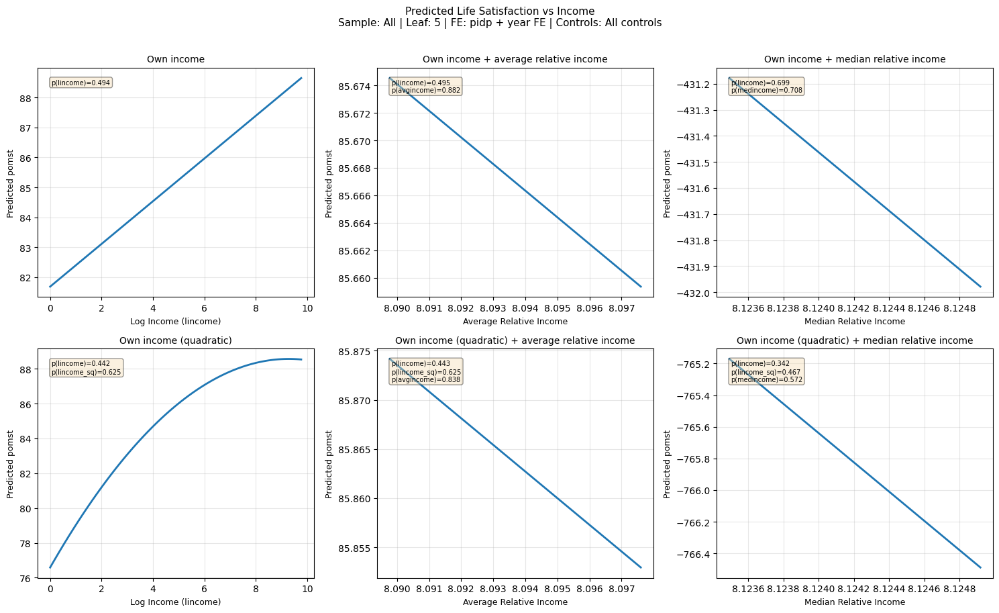

Saved: plot_All_leaf5_All_c_pidp_year_FE.png


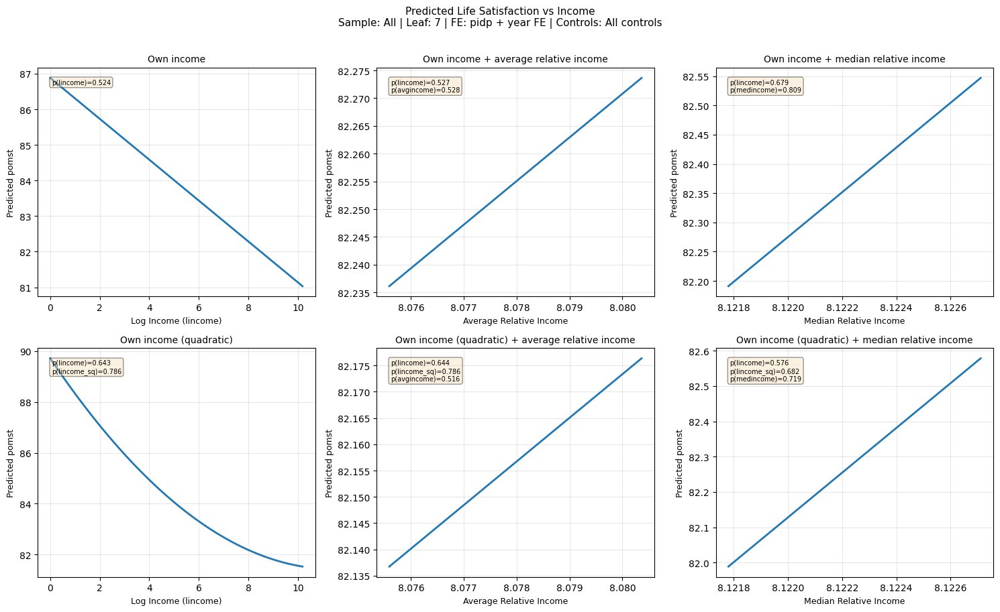

Saved: plot_All_leaf7_All_c_pidp_year_FE.png


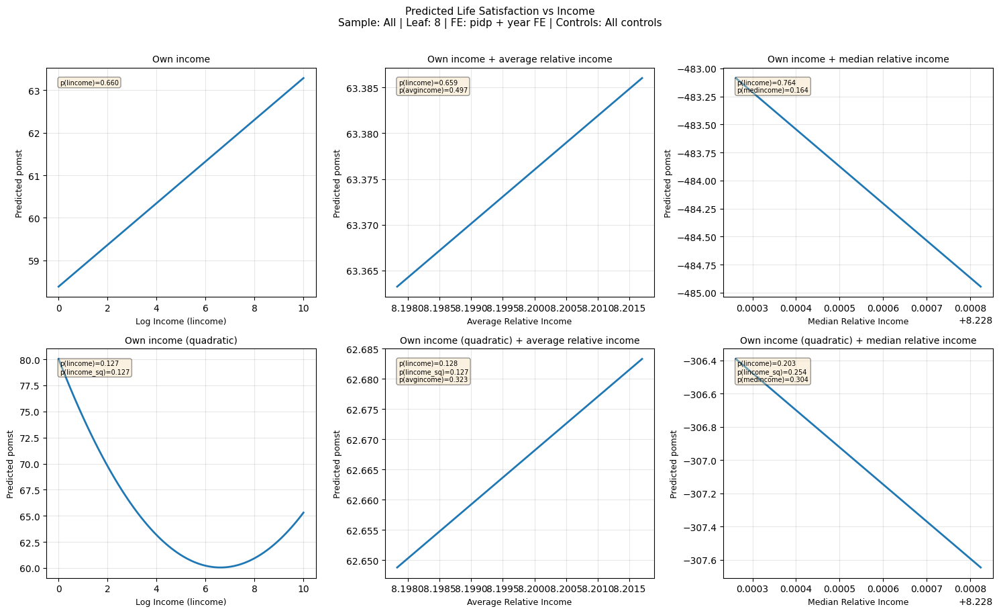

Saved: plot_All_leaf8_All_c_pidp_year_FE.png


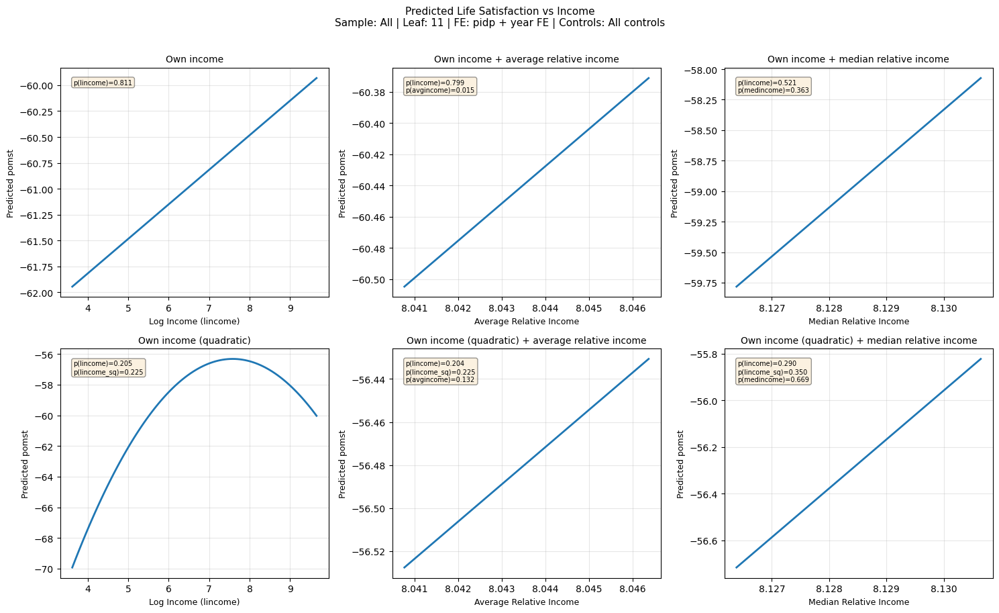

Saved: plot_All_leaf11_All_c_pidp_year_FE.png


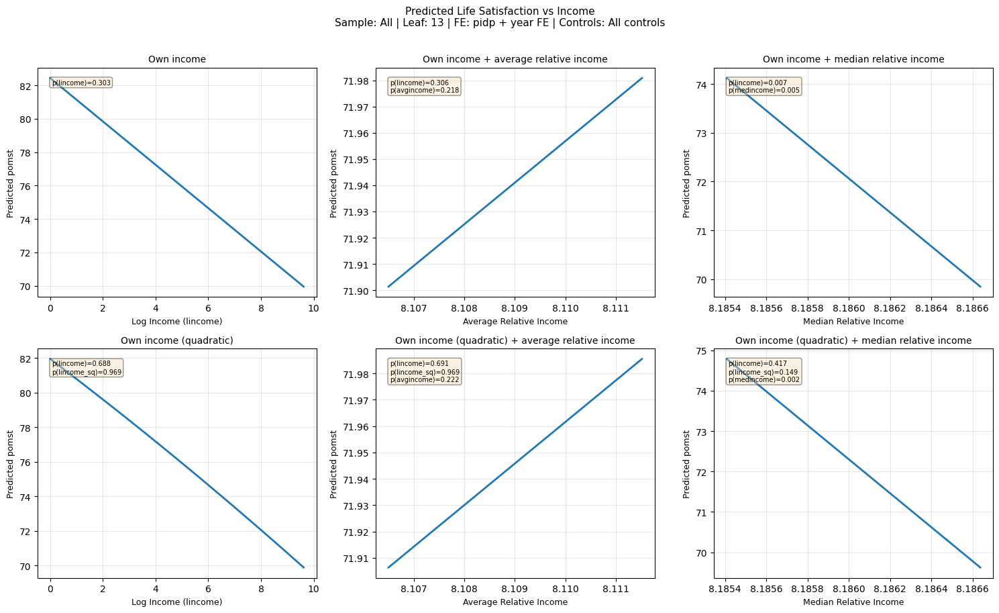

Saved: plot_All_leaf13_All_c_pidp_year_FE.png


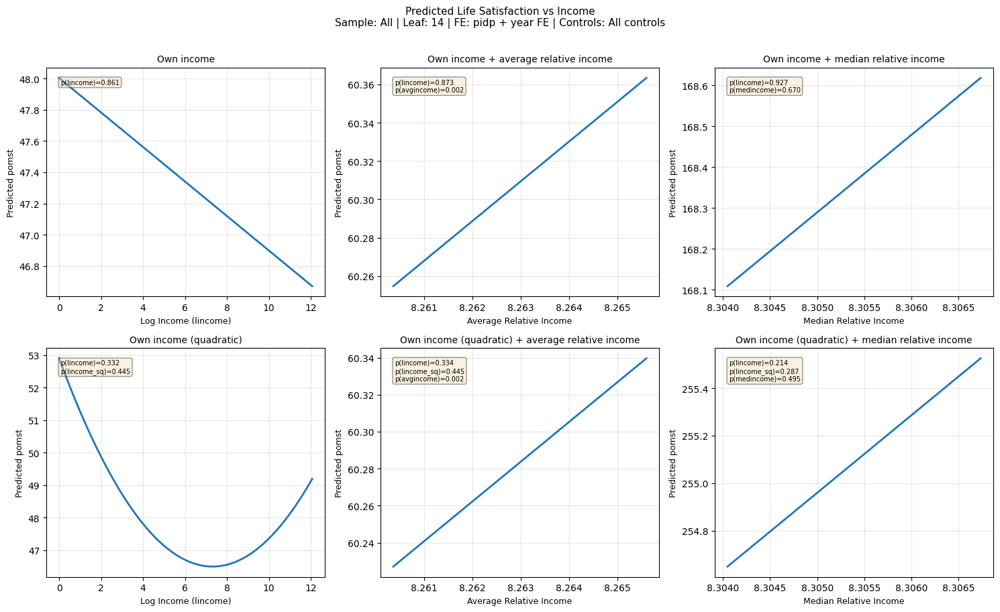

Saved: plot_All_leaf14_All_c_pidp_year_FE.png


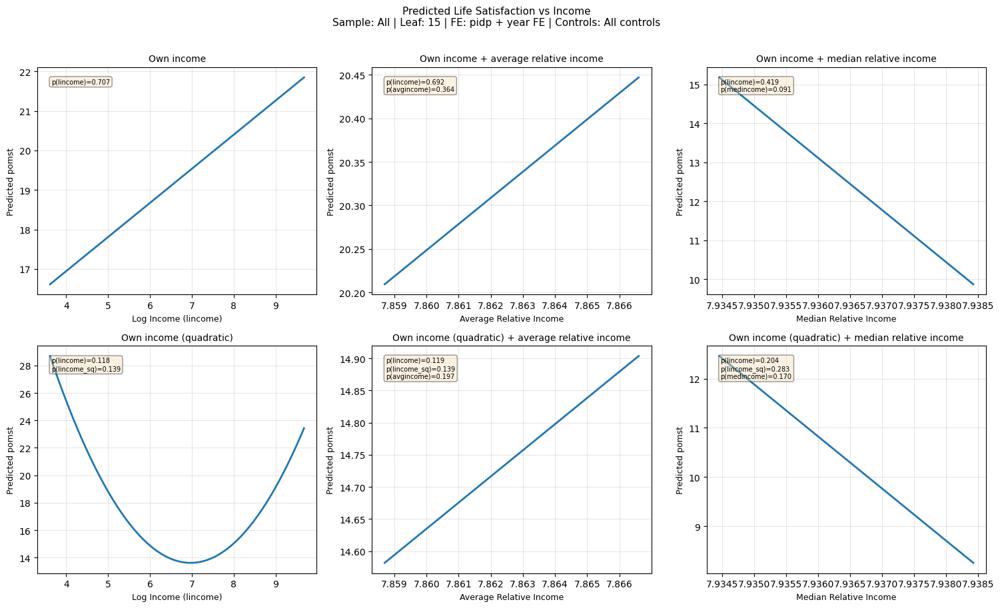

Saved: plot_All_leaf15_All_c_pidp_year_FE.png


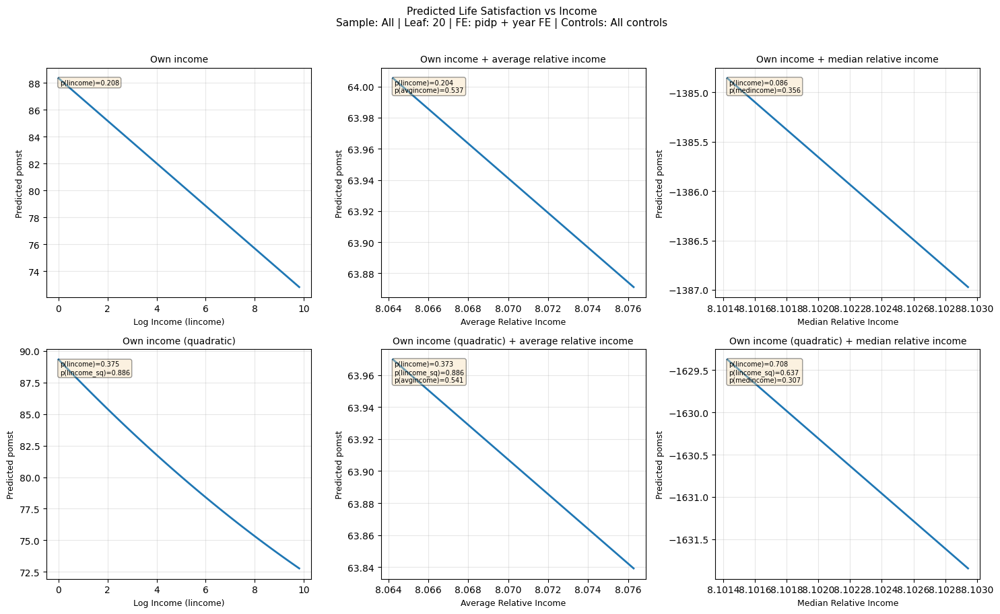

Saved: plot_All_leaf20_All_c_pidp_year_FE.png


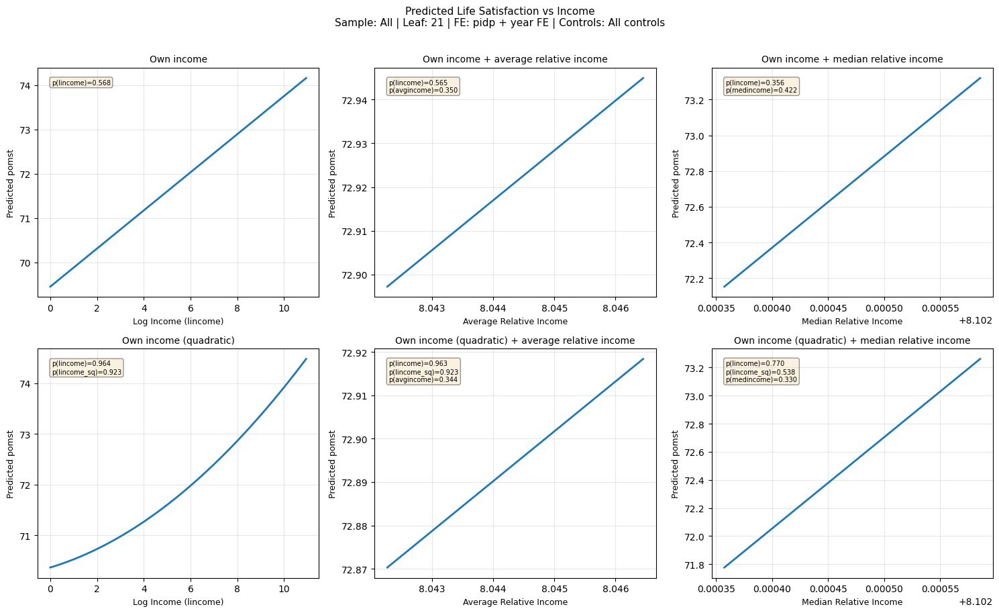

Saved: plot_All_leaf21_All_c_pidp_year_FE.png


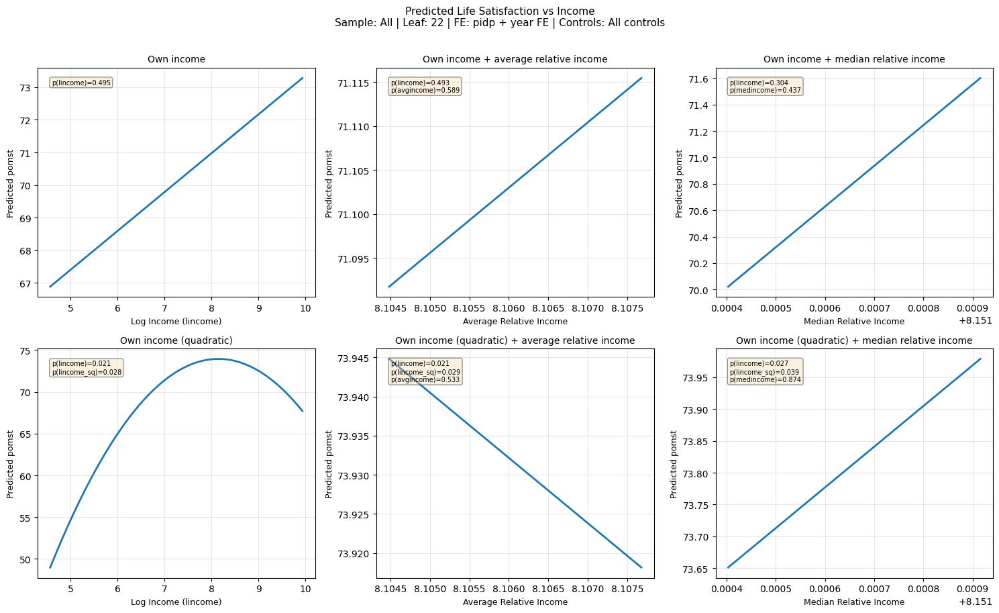

Saved: plot_All_leaf22_All_c_pidp_year_FE.png


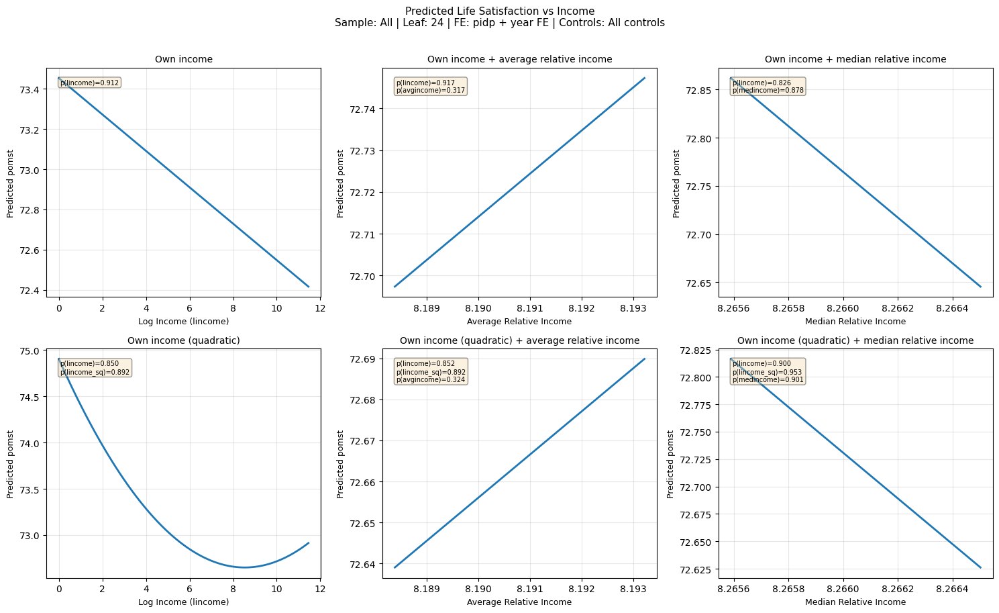

Saved: plot_All_leaf24_All_c_pidp_year_FE.png


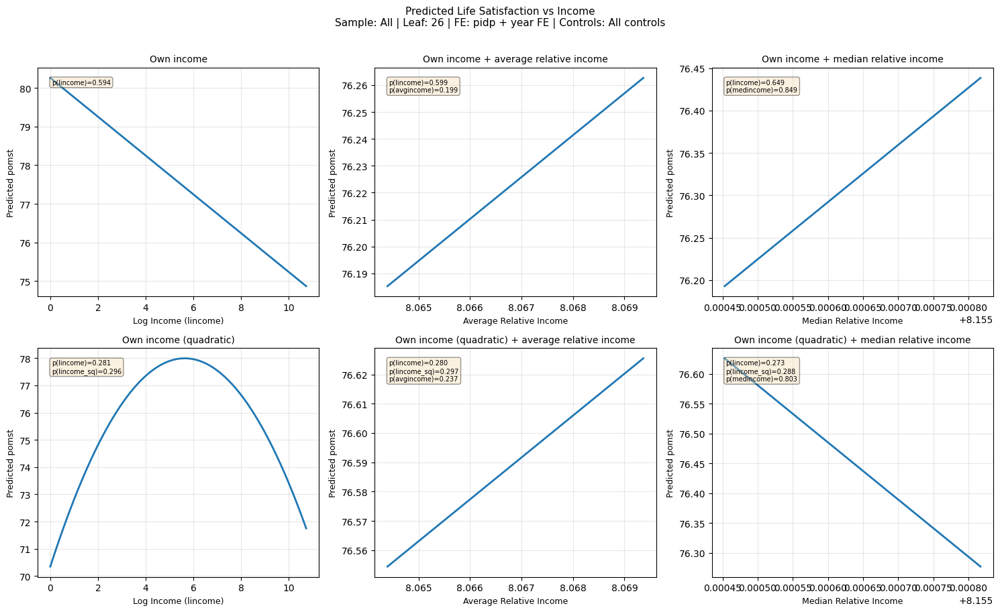

Saved: plot_All_leaf26_All_c_pidp_year_FE.png


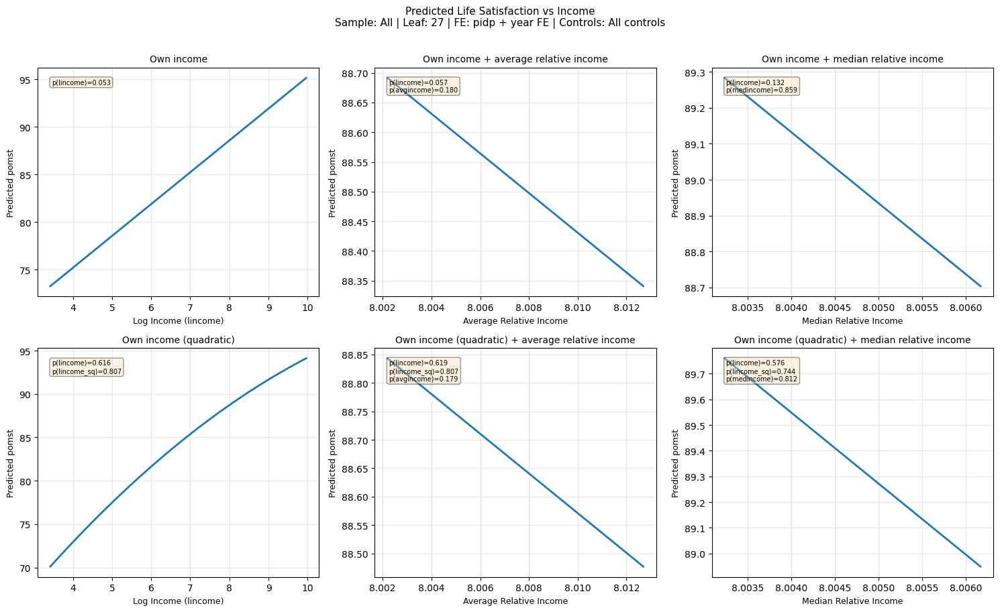

Saved: plot_All_leaf27_All_c_pidp_year_FE.png


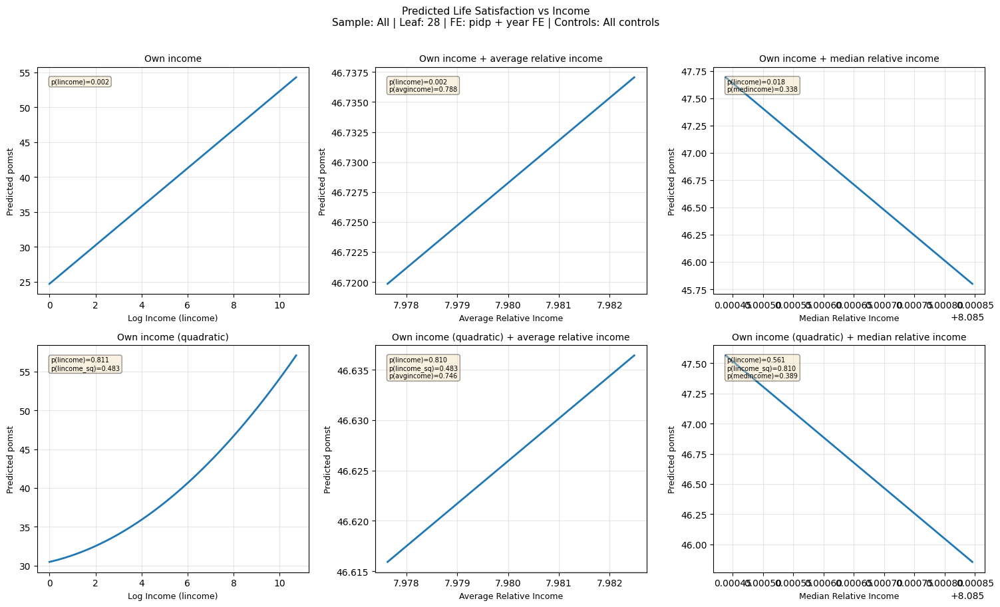

Saved: plot_All_leaf28_All_c_pidp_year_FE.png


In [ ]:
# All sample - one plot per leaf
for leaf in sorted(df_old['terminal_node'].dropna().unique()):
    plot_income_lifsat(results_df, all_models, df_old, label='All', leaf=leaf, node_col='terminal_node')

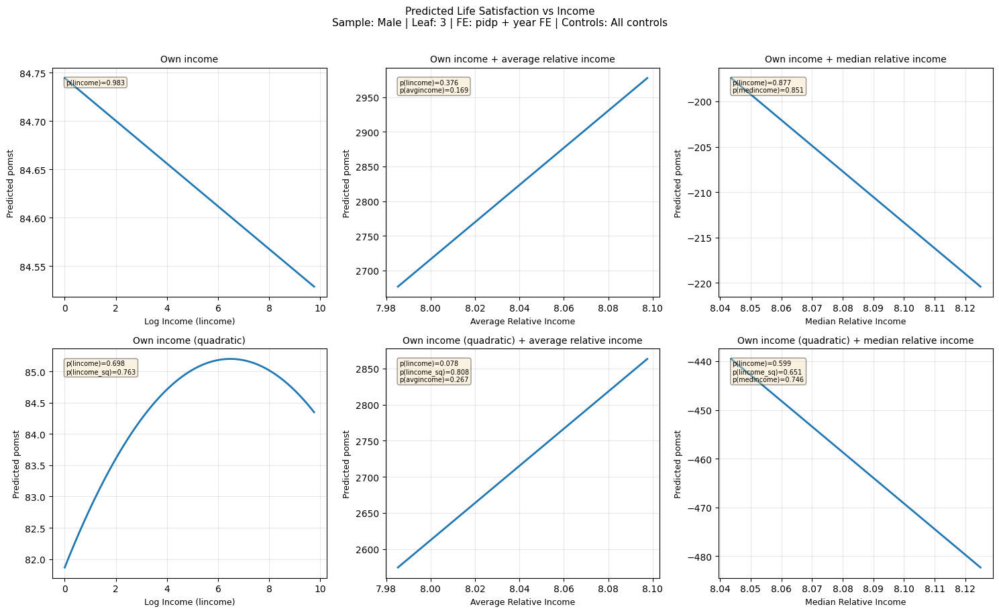

Saved: plot_Male_leaf3_All_c_pidp_year_FE.png


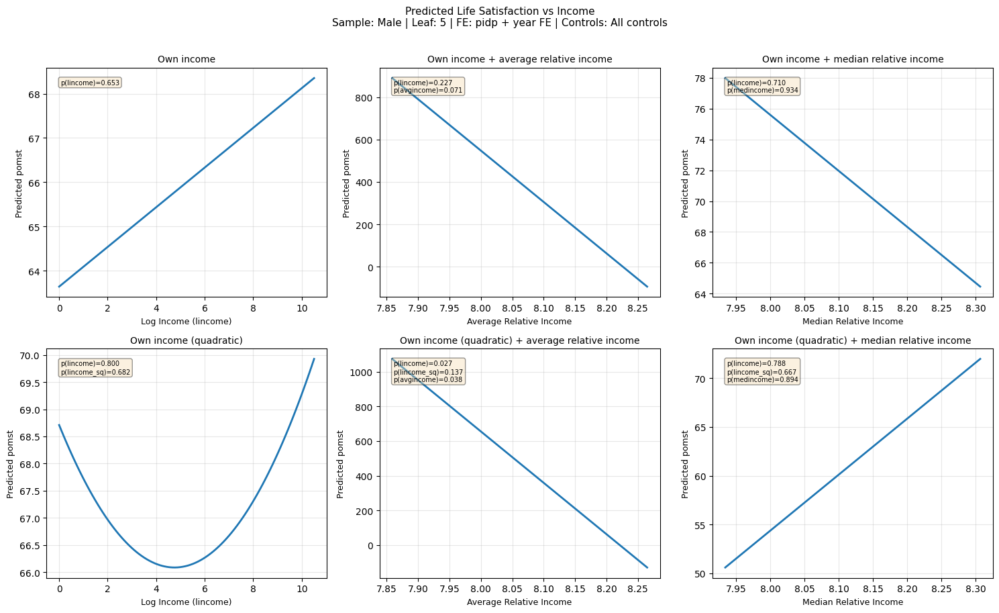

Saved: plot_Male_leaf5_All_c_pidp_year_FE.png


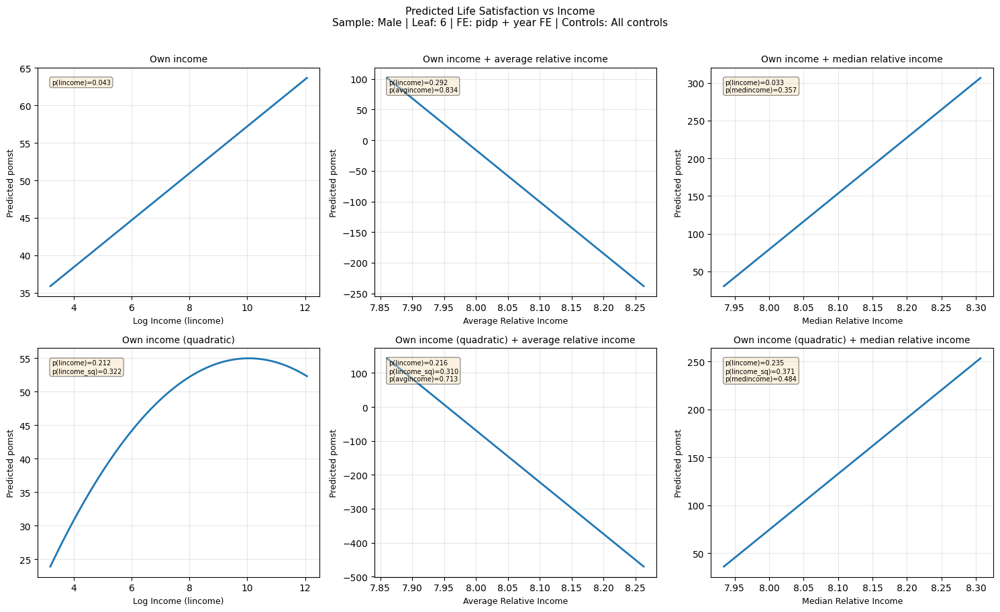

Saved: plot_Male_leaf6_All_c_pidp_year_FE.png


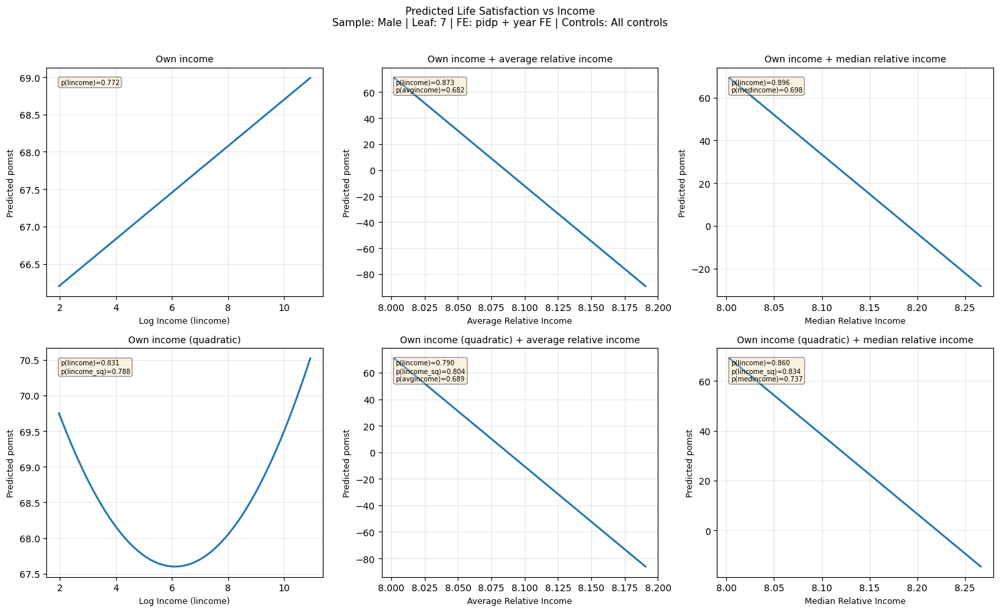

Saved: plot_Male_leaf7_All_c_pidp_year_FE.png


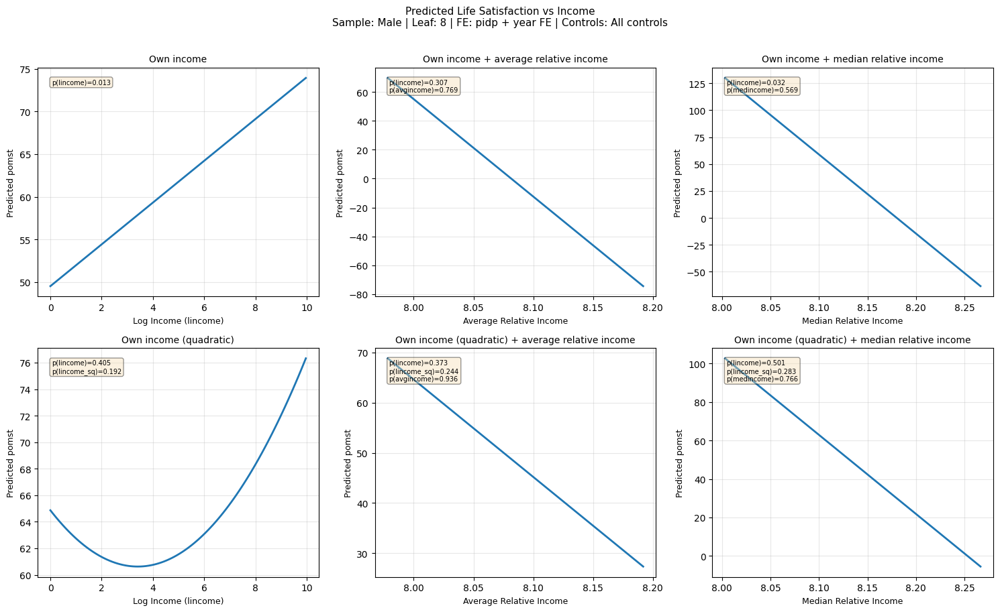

Saved: plot_Male_leaf8_All_c_pidp_year_FE.png


In [ ]:
# Male sample
for leaf in sorted(df_old_m['terminal_node_m'].dropna().unique()):
    plot_income_lifsat(results_df, all_models, df_old_m, label='Male', leaf=leaf, node_col='terminal_node_m')

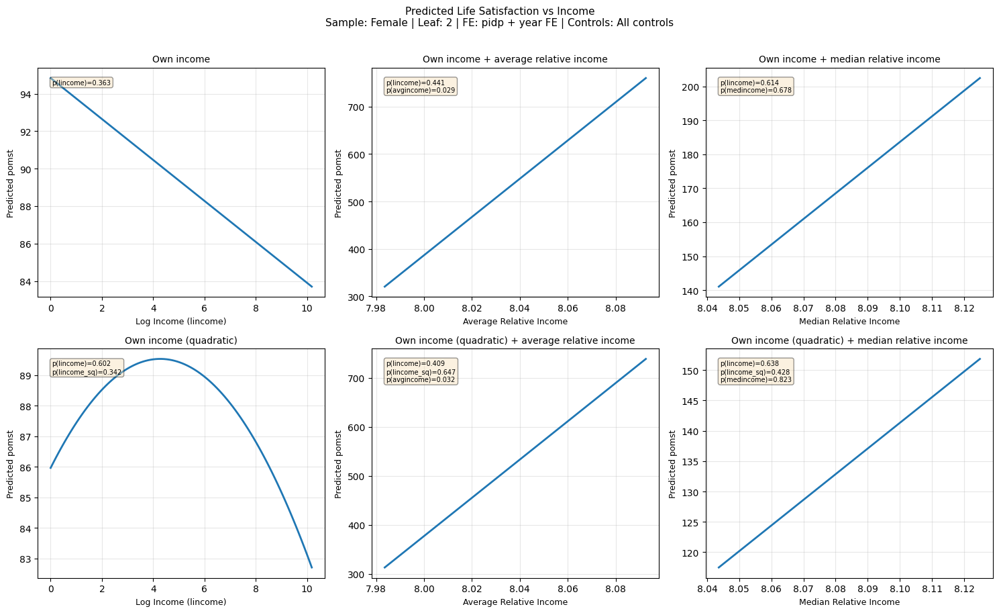

Saved: plot_Female_leaf2_All_c_pidp_year_FE.png


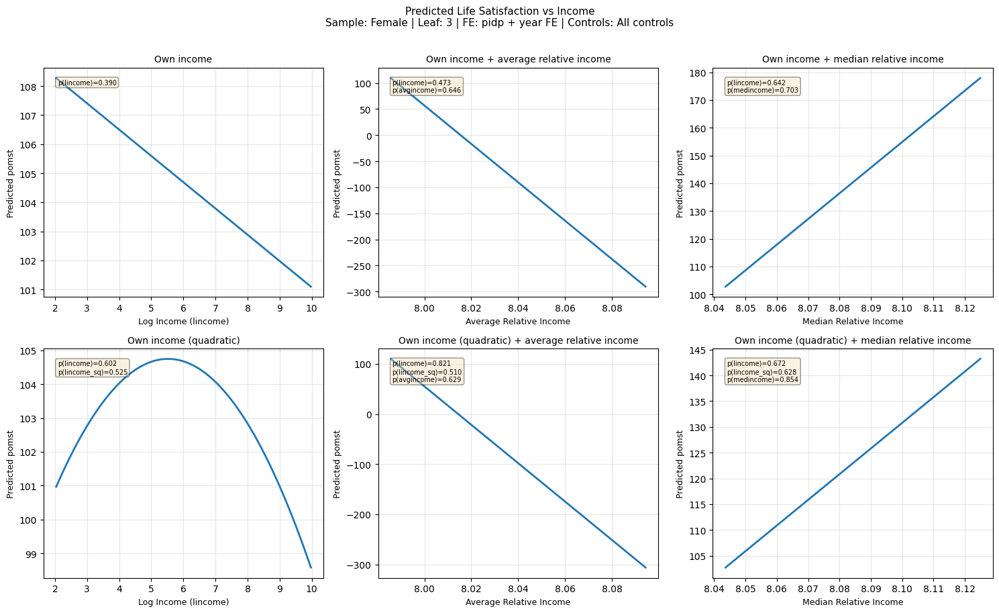

Saved: plot_Female_leaf3_All_c_pidp_year_FE.png


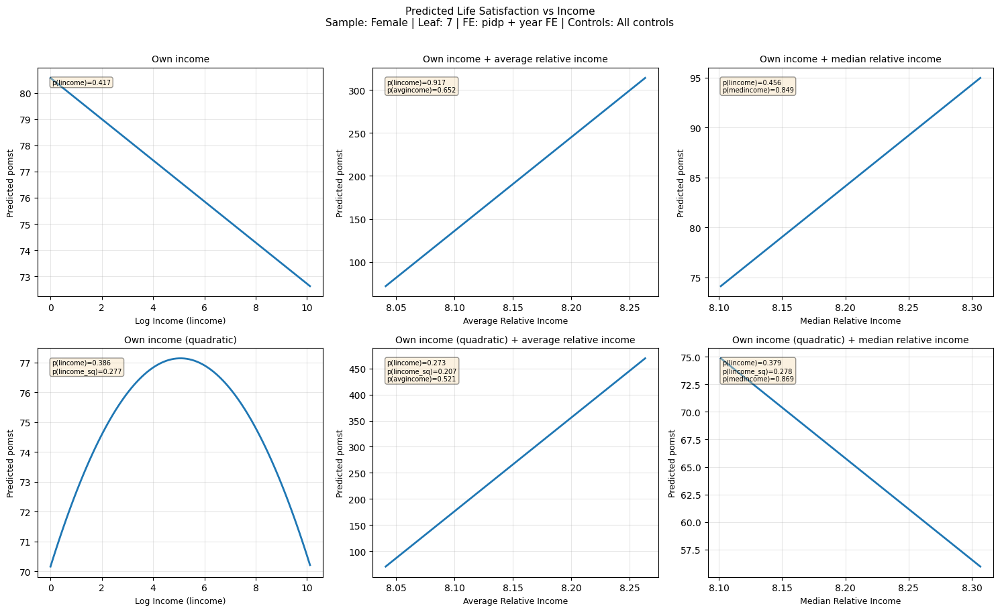

Saved: plot_Female_leaf7_All_c_pidp_year_FE.png


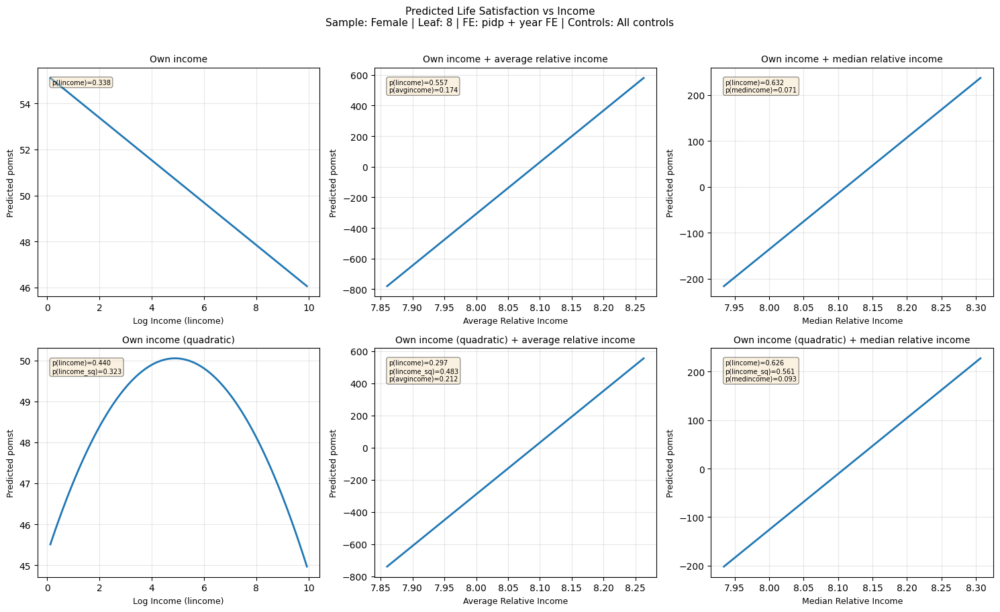

Saved: plot_Female_leaf8_All_c_pidp_year_FE.png


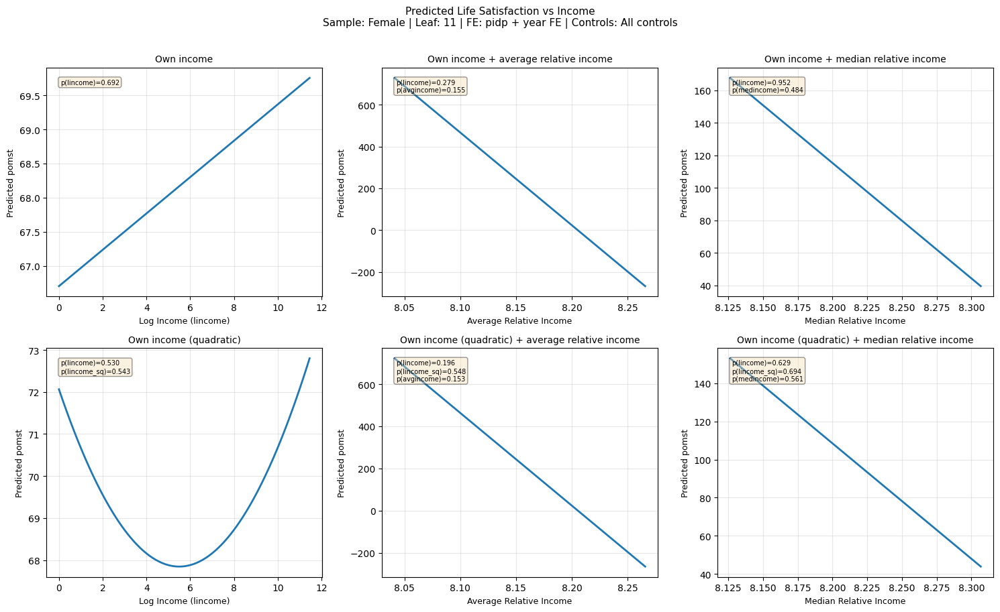

Saved: plot_Female_leaf11_All_c_pidp_year_FE.png


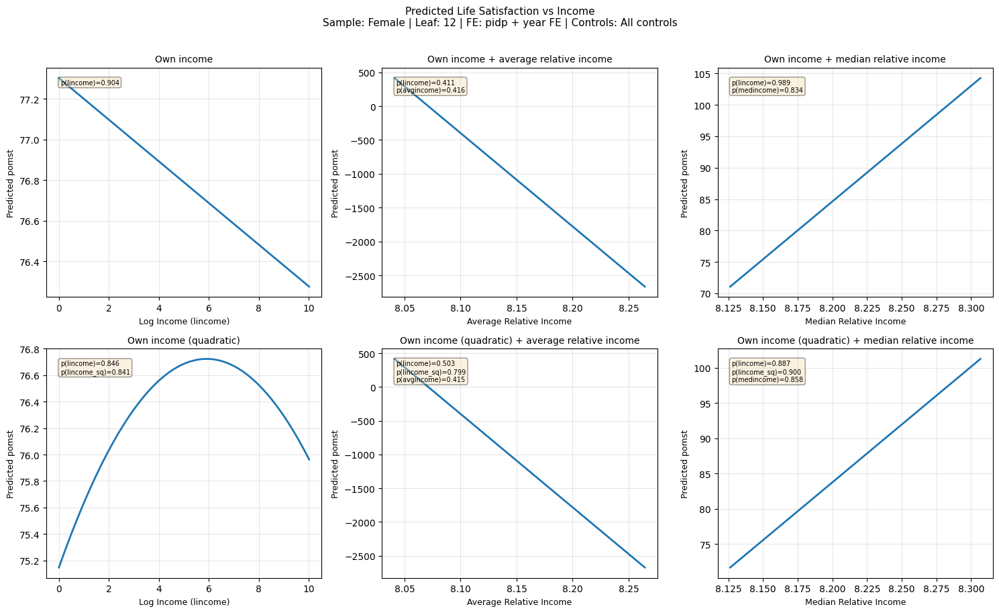

Saved: plot_Female_leaf12_All_c_pidp_year_FE.png


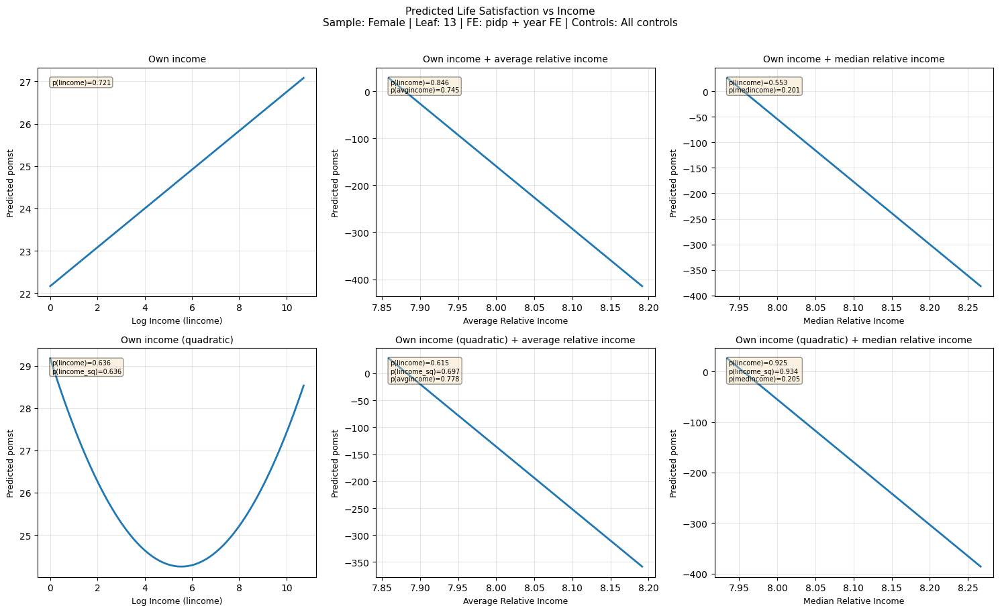

Saved: plot_Female_leaf13_All_c_pidp_year_FE.png


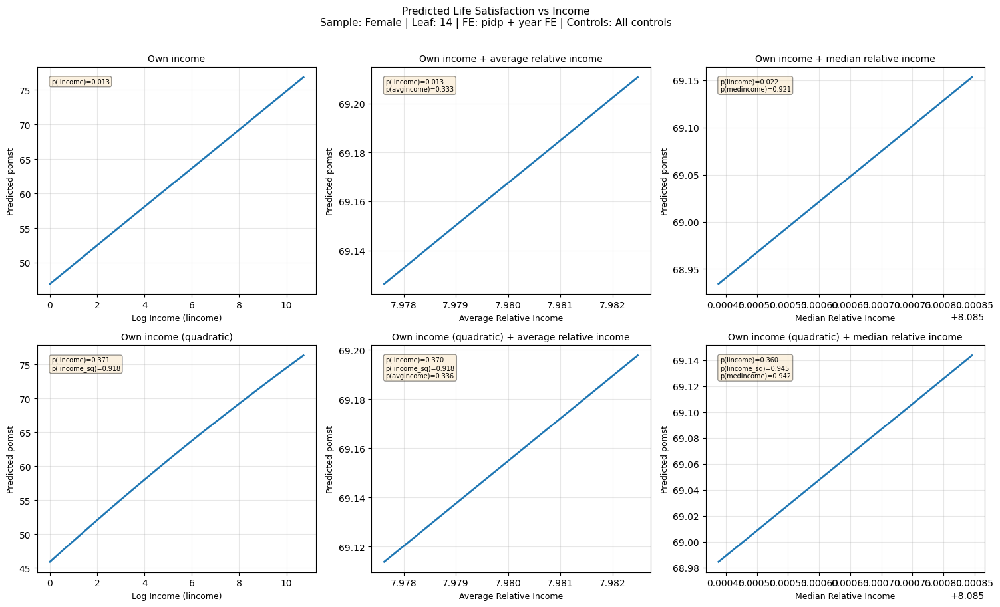

Saved: plot_Female_leaf14_All_c_pidp_year_FE.png


In [ ]:
# Female sample
for leaf in sorted(df_old_f['terminal_node_f'].dropna().unique()):
    plot_income_lifsat(results_df, all_models, df_old_f, label='Female', leaf=leaf, node_col='terminal_node_f')

significant results

In [ ]:
# For own income specs (Lin, A) - significant if p(lincome) < 0.05
sig_own = results_df[
    (results_df['fe_spec'] == 'pidp+year FE') &
    (results_df['controls'] == 'All_c') &
    (results_df['pval_lincome'] < 0.05)
][['sample', 'leaf', 'income_type', 'coef_lincome', 'pval_lincome', 'coef_lincome_sq', 'pval_lincome_sq']].sort_values(['sample', 'leaf'])

# For relative income specs (LinAvg, LinMed, B, C) - significant if p(rel_income) < 0.05
sig_rel = results_df[
    (results_df['fe_spec'] == 'pidp+year FE') &
    (results_df['controls'] == 'All_c') &
    (results_df['pval_rel_income'] < 0.05)
][['sample', 'leaf', 'income_type', 'coef_rel_income', 'pval_rel_income']].sort_values(['sample', 'leaf'])

print("=== Significant own income ===")
print(sig_own.to_string())
print("\n=== Significant relative income ===")
print(sig_rel.to_string())

=== Significant own income ===
      sample  leaf             income_type  coef_lincome  pval_lincome  coef_lincome_sq  pval_lincome_sq
87       All   3.0            lincome_quad     15.370912      0.000045        -1.140154         0.003778
88       All   3.0  lincome_quad_avgincome     15.355966      0.000044        -1.140154         0.003810
89       All   3.0  lincome_quad_medincome     13.605424      0.000786        -0.922224         0.034813
536      All  13.0       lincome_medincome     -3.189650      0.007127              NaN              NaN
987      All  22.0            lincome_quad     31.757303      0.021430        -1.948796         0.028468
988      All  22.0  lincome_quad_avgincome     31.752334      0.021473        -1.948796         0.028518
989      All  22.0  lincome_quad_medincome     31.269408      0.026806        -1.906956         0.038695
1344     All  28.0            lincome_only      2.762565      0.002397              NaN              NaN
1345     All  28.0      

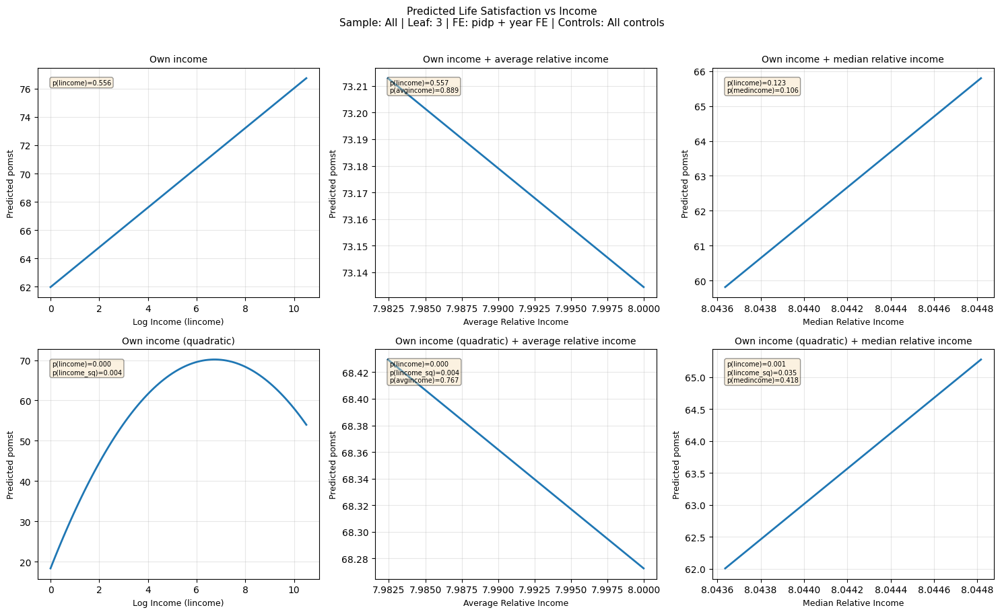

Saved: plot_All_leaf3_All_c_pidp_year_FE.png


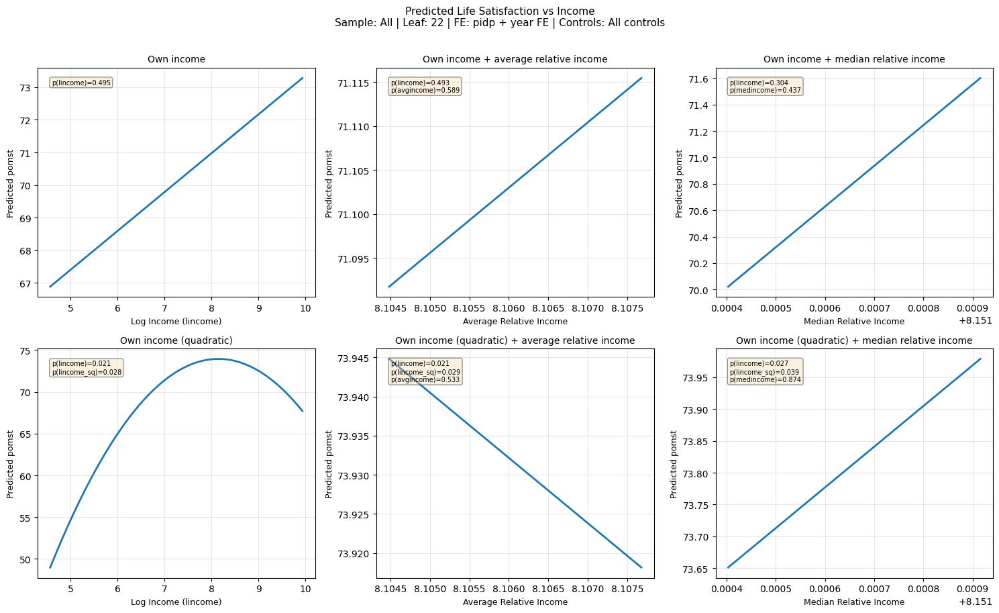

Saved: plot_All_leaf22_All_c_pidp_year_FE.png


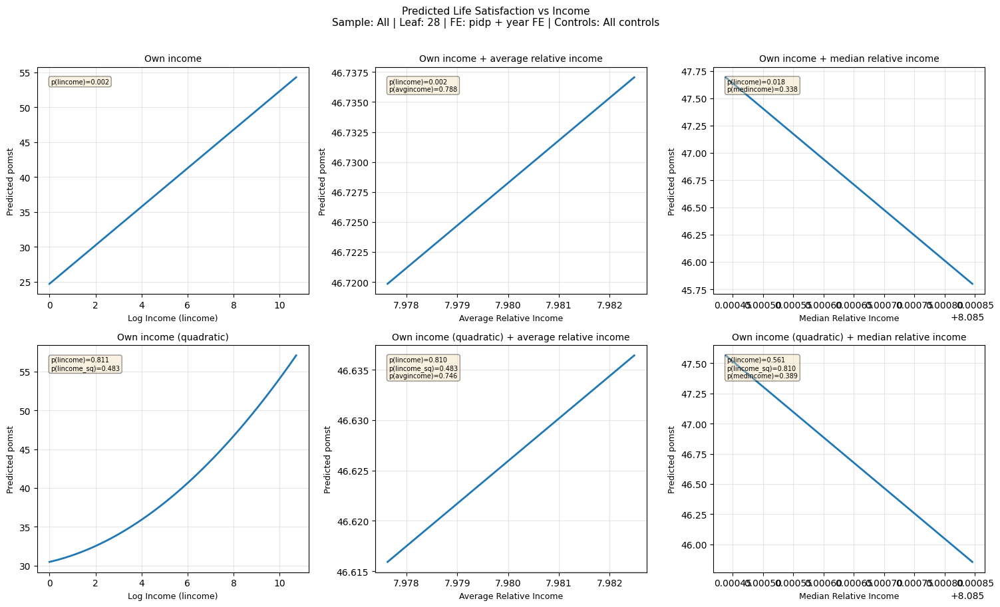

Saved: plot_All_leaf28_All_c_pidp_year_FE.png


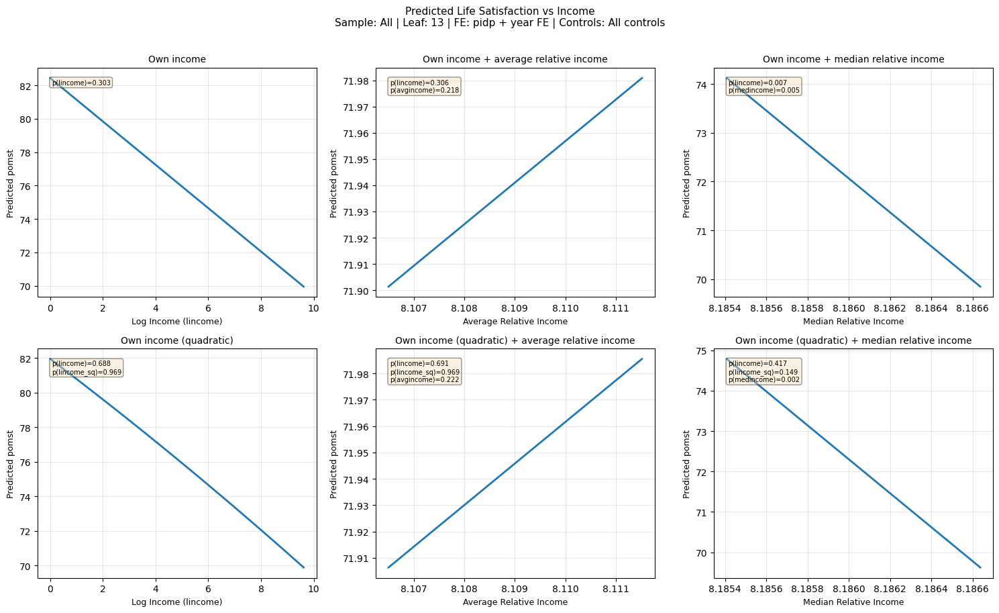

Saved: plot_All_leaf13_All_c_pidp_year_FE.png


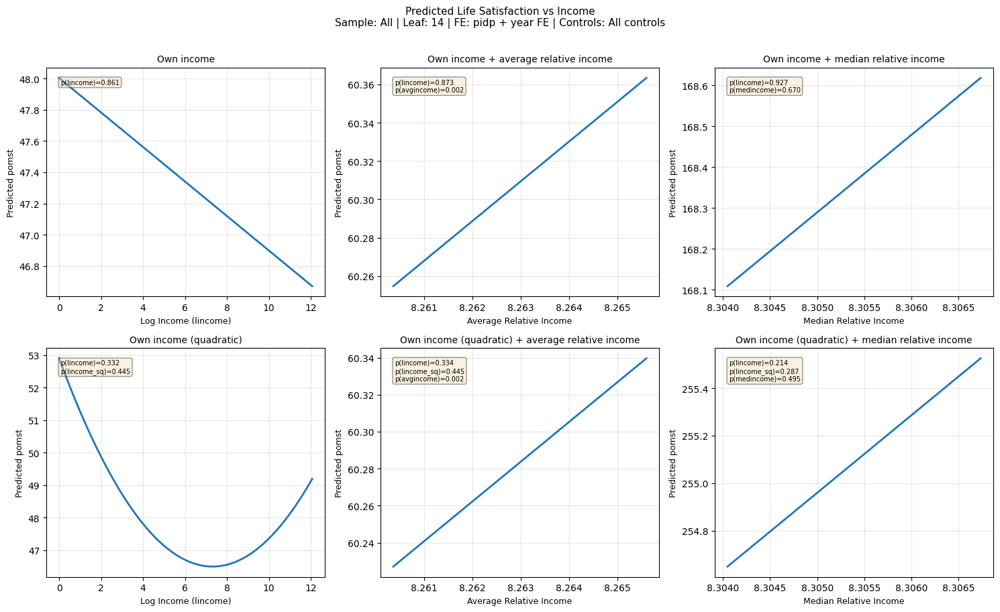

Saved: plot_All_leaf14_All_c_pidp_year_FE.png


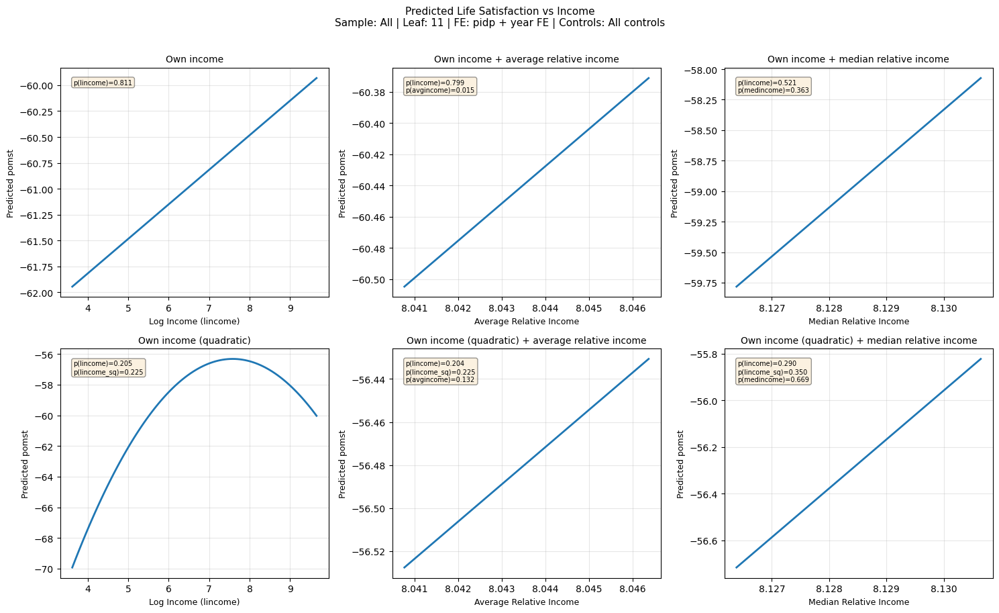

Saved: plot_All_leaf11_All_c_pidp_year_FE.png


In [ ]:
# All sample
for leaf in [3.0, 22.0, 28.0, 13.0, 14.0, 11.0]:
    plot_income_lifsat(results_df, all_models, df_old, label='All', leaf=leaf, node_col='terminal_node')

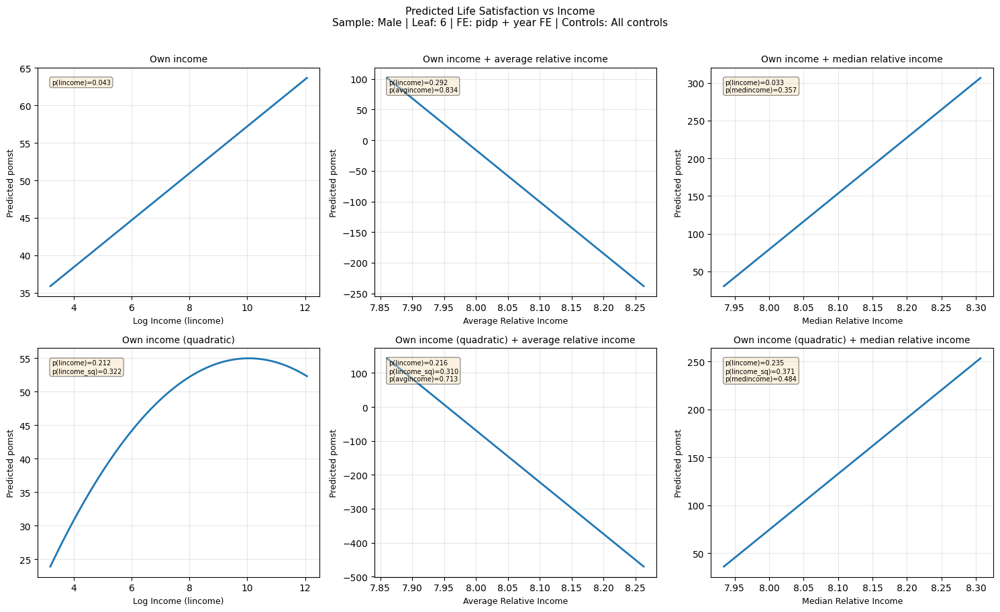

Saved: plot_Male_leaf6_All_c_pidp_year_FE.png


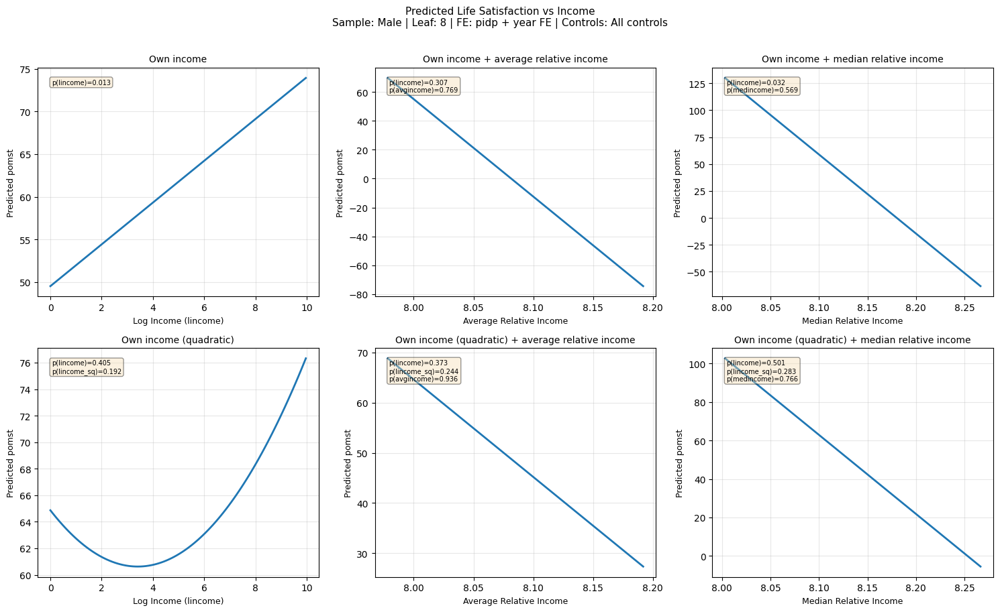

Saved: plot_Male_leaf8_All_c_pidp_year_FE.png


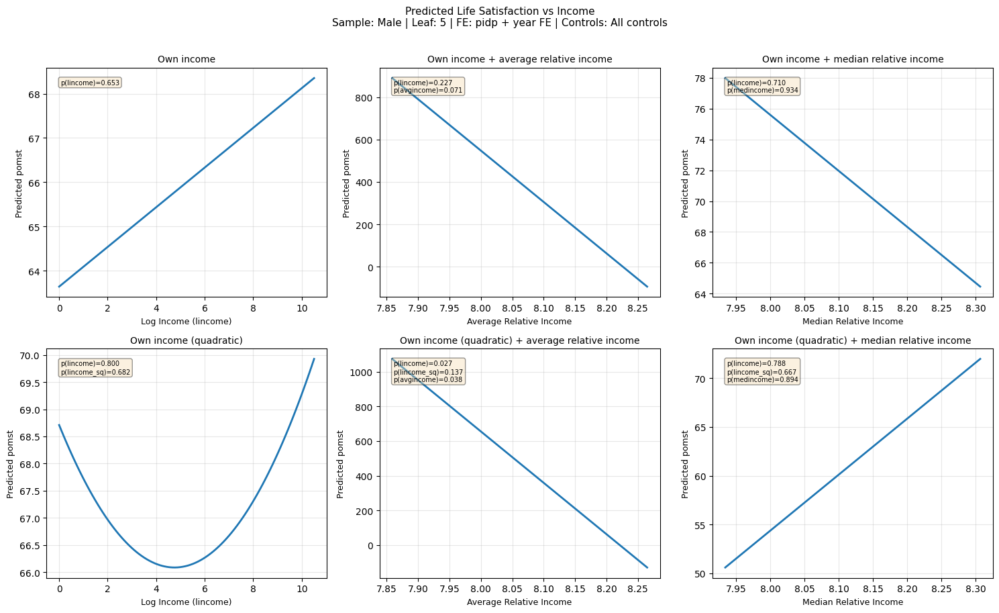

Saved: plot_Male_leaf5_All_c_pidp_year_FE.png


In [ ]:
# Male sample
for leaf in [6.0, 8.0, 5.0]:
    plot_income_lifsat(results_df, all_models, df_old_m, label='Male', leaf=leaf, node_col='terminal_node_m')

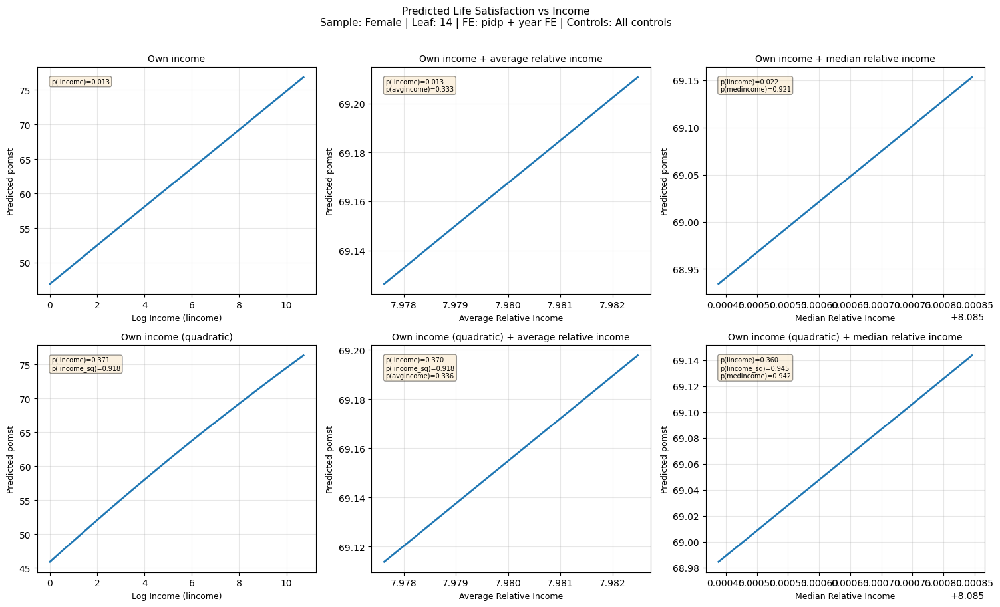

Saved: plot_Female_leaf14_All_c_pidp_year_FE.png


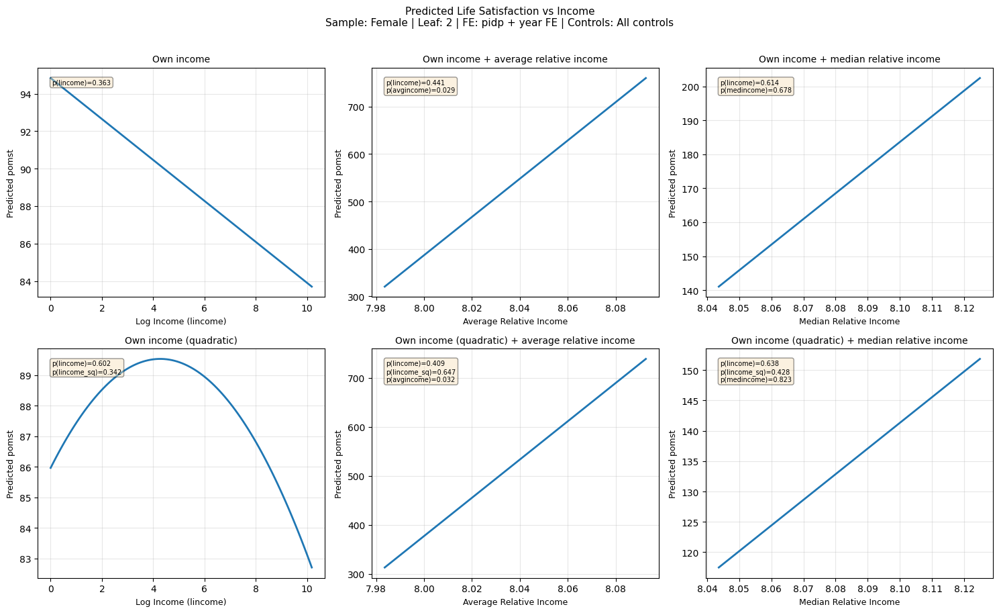

Saved: plot_Female_leaf2_All_c_pidp_year_FE.png


In [ ]:
# Female sample
for leaf in [14.0, 2.0]:
    plot_income_lifsat(results_df, all_models, df_old_f, label='Female', leaf=leaf, node_col='terminal_node_f')

function with multiple graphs on the same plot

In [ ]:
def plot_income_lifsat2(results_df, all_models, df, label, leaf,
                       node_col='terminal_node',
                       fe_spec='pidp+year FE', controls='All_c', n_points=100):

    import numpy as np

    # Fix key type mismatch
    leaf = np.int64(leaf)

    subgroup = df[df[node_col] == leaf].copy()

    if subgroup.empty:
        print(f"No data found for leaf {leaf} in {node_col}")
        return

    x_min = subgroup['lincome'].min()
    x_max = subgroup['lincome'].max()
    x_range = np.linspace(x_min, x_max, n_points)

    linear_specs = [
        ('lincome_only',      None,        'Lin (own income only)',      'steelblue',  '-'),
        ('lincome_avgincome', 'avgincome', 'LinAvg (+ avg relative)',    'darkorange', '--'),
        ('lincome_medincome', 'medincome', 'LinMed (+ med relative)',    'green',      '-.'),
    ]
    quad_specs = [
        ('lincome_quad',           None,        'A (quadratic own)',            'navy',        '-'),
        ('lincome_quad_avgincome', 'avgincome', 'B (quadratic + avg relative)', 'saddlebrown', '--'),
        ('lincome_quad_medincome', 'medincome', 'C (quadratic + med relative)', 'darkgreen',   '-.'),
    ]

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    for ax, spec_group, panel_title in zip(axes,
                                            [linear_specs, quad_specs],
                                            ['Linear Specifications', 'Quadratic Specifications']):

        for income_type, rel_var, line_label, color, linestyle in spec_group:

            model_key = (label, leaf, income_type, controls, fe_spec)
            if model_key not in all_models:
                print(f"Key not found: {model_key}")
                continue

            model = all_models[model_key]
            params = model.params

            pred = np.zeros(n_points)

            if 'Intercept' in params:
                pred += params['Intercept']

            if 'lincome' in params:
                pred += params['lincome'] * x_range
            if 'lincome_sq' in params:
                pred += params['lincome_sq'] * (x_range ** 2)

            if rel_var == 'avgincome' and 'avgincome' in params and 'avgincome' in subgroup.columns:
                pred += params['avgincome'] * subgroup['avgincome'].mean()
            if rel_var == 'medincome' and 'medincome' in params and 'medincome' in subgroup.columns:
                pred += params['medincome'] * subgroup['medincome'].mean()

            for var in ['agenew', 'agesq', 'single', 'married', 'others']:
                if var in params and var in subgroup.columns:
                    pred += params[var] * subgroup[var].mean()

            row = results_df[
                (results_df['sample'] == label) &
                (results_df['leaf'] == leaf) &
                (results_df['income_type'] == income_type) &
                (results_df['controls'] == controls) &
                (results_df['fe_spec'] == fe_spec)
            ]

            if not row.empty:
                p_lin = row['pval_lincome'].values[0]
                p_sq  = row['pval_lincome_sq'].values[0]
                p_rel = row['pval_rel_income'].values[0]

                pval_str = f'p(lin)={p_lin:.3f}'
                if not np.isnan(p_sq):
                    pval_str += f', p(sq)={p_sq:.3f}'
                if not np.isnan(p_rel):
                    pval_str += f', p({rel_var})={p_rel:.3f}'
                full_label = f'{line_label}\n{pval_str}'
            else:
                full_label = line_label

            ax.plot(x_range, pred, color=color, linewidth=2,
                    linestyle=linestyle, label=full_label)

        ax.set_xlabel('Log Income (lincome)', fontsize=10)
        ax.set_ylabel('Predicted pomst', fontsize=10)
        ax.set_title(panel_title, fontsize=11)
        ax.legend(fontsize=7, loc='best')
        ax.grid(True, alpha=0.3)

    fig.suptitle(
        f'Predicted Life Satisfaction vs Log Income\n'
        f'Sample: {label} | Leaf: {int(leaf)} | FE: {fe_spec} | Controls: {controls}',
        fontsize=12, y=1.02
    )
    plt.tight_layout()

    fname = f'plot_{label}_leaf{int(leaf)}_{controls}_{fe_spec.replace("+","_").replace(" ","_")}.png'
    plt.savefig(fname, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'Saved: {fname}')

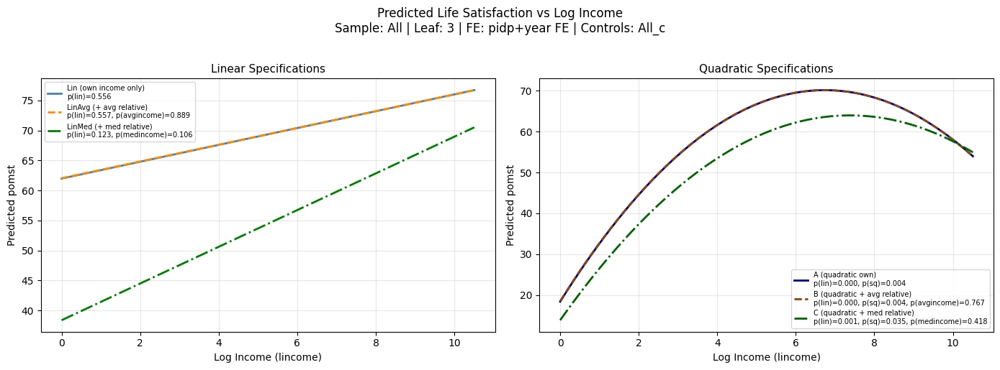

Saved: plot_All_leaf3_All_c_pidp_year_FE.png


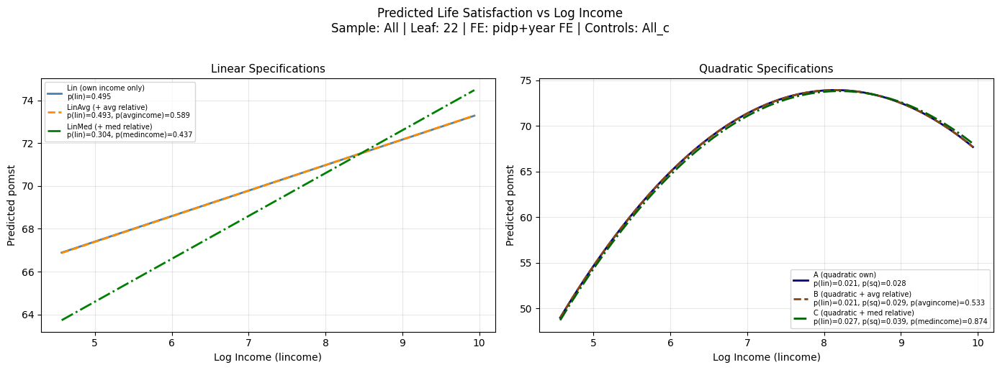

Saved: plot_All_leaf22_All_c_pidp_year_FE.png


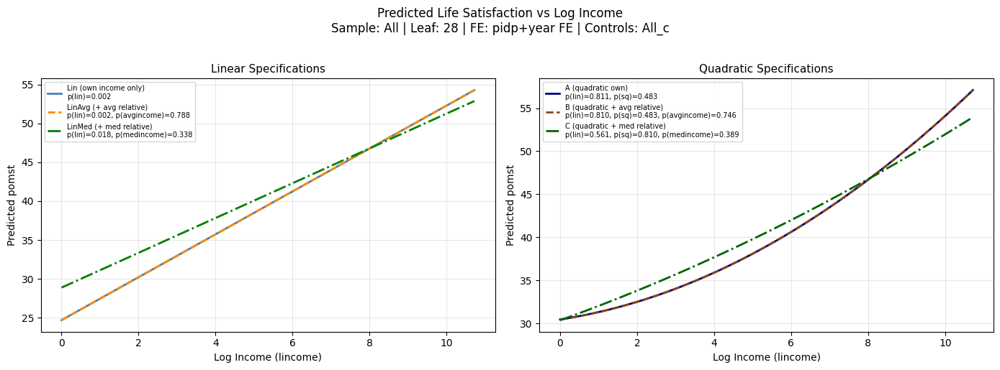

Saved: plot_All_leaf28_All_c_pidp_year_FE.png


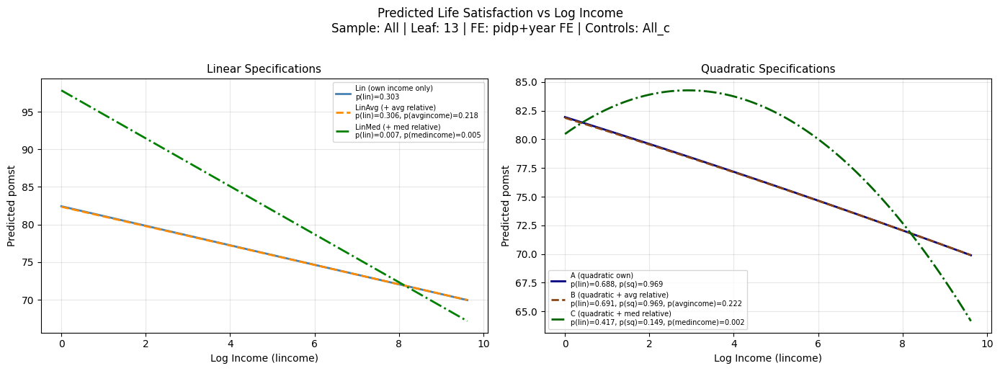

Saved: plot_All_leaf13_All_c_pidp_year_FE.png


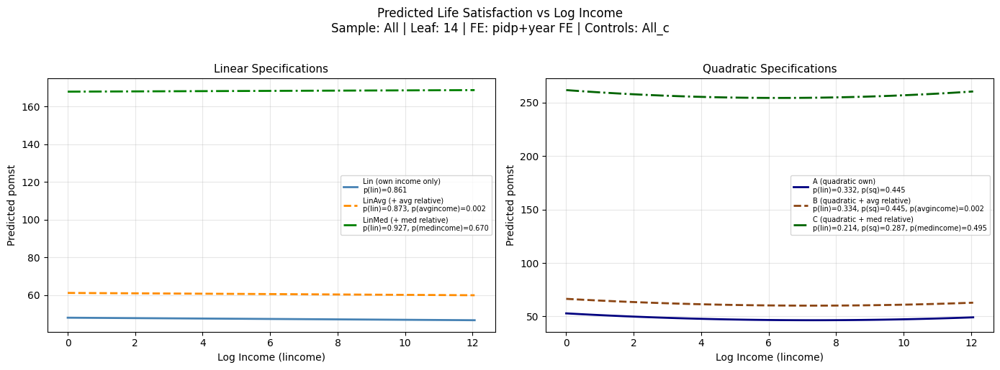

Saved: plot_All_leaf14_All_c_pidp_year_FE.png


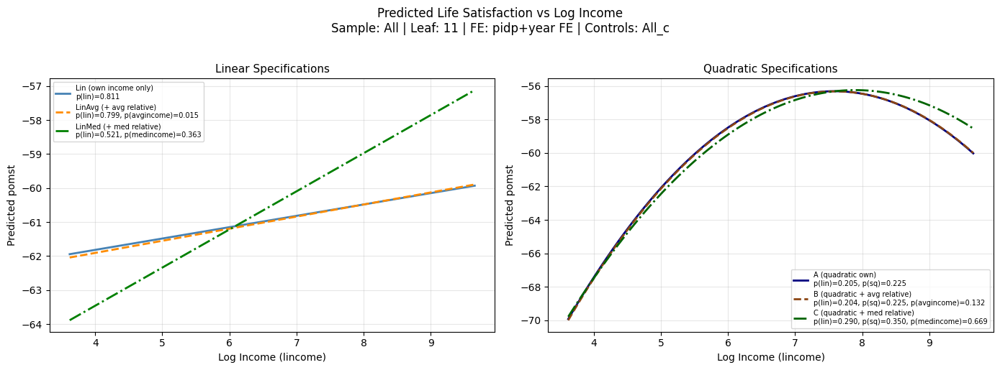

Saved: plot_All_leaf11_All_c_pidp_year_FE.png


In [ ]:
for leaf in [3.0, 22.0, 28.0, 13.0, 14.0, 11.0]:
    plot_income_lifsat2(results_df, all_models, df_old, 'All', leaf,
                       node_col='terminal_node')

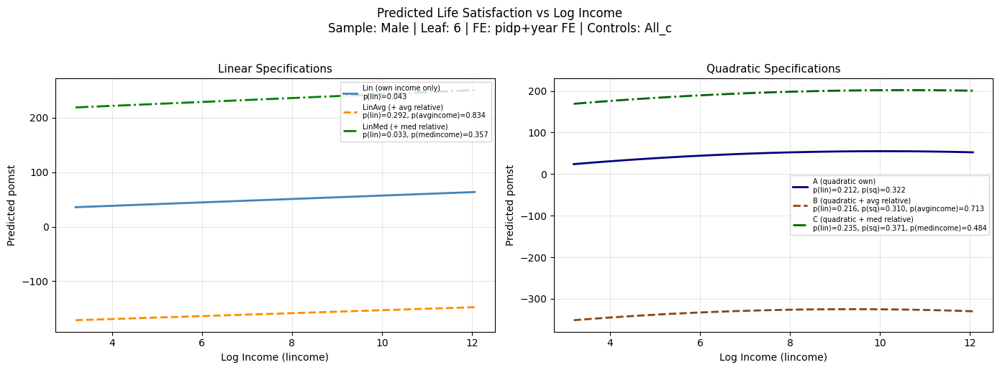

Saved: plot_Male_leaf6_All_c_pidp_year_FE.png


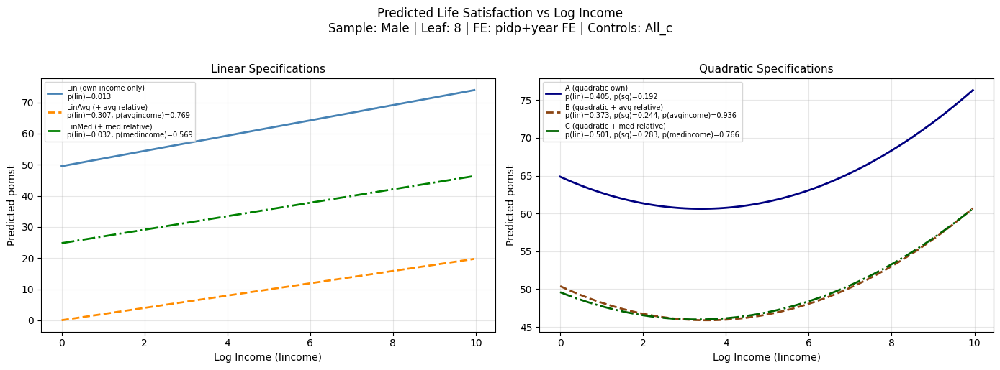

Saved: plot_Male_leaf8_All_c_pidp_year_FE.png


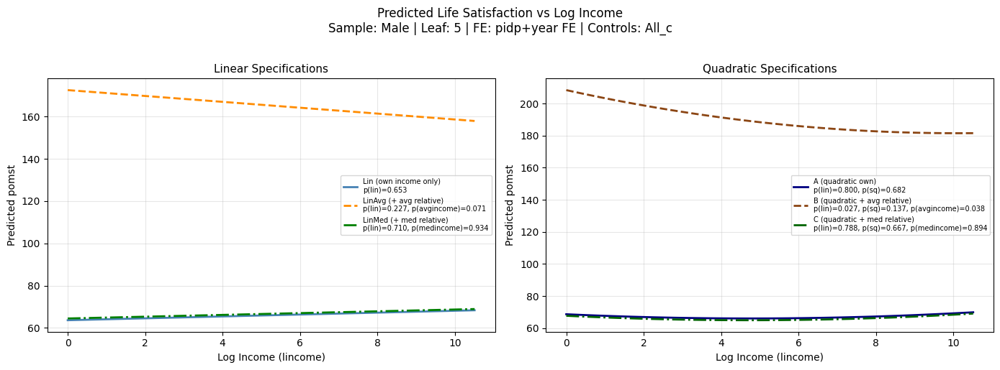

Saved: plot_Male_leaf5_All_c_pidp_year_FE.png


In [ ]:
# Male sample
for leaf in [6.0, 8.0, 5.0]:
    plot_income_lifsat2(results_df, all_models, df_old_m,
                       label='Male', leaf=leaf,
                       node_col='terminal_node_m')

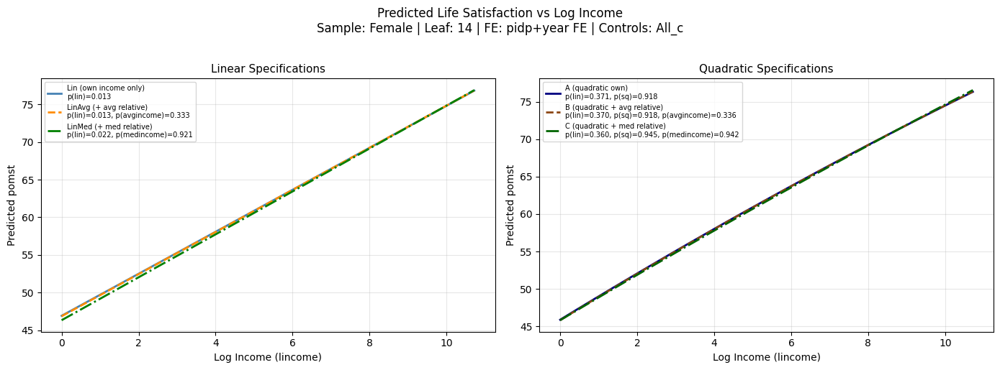

Saved: plot_Female_leaf14_All_c_pidp_year_FE.png


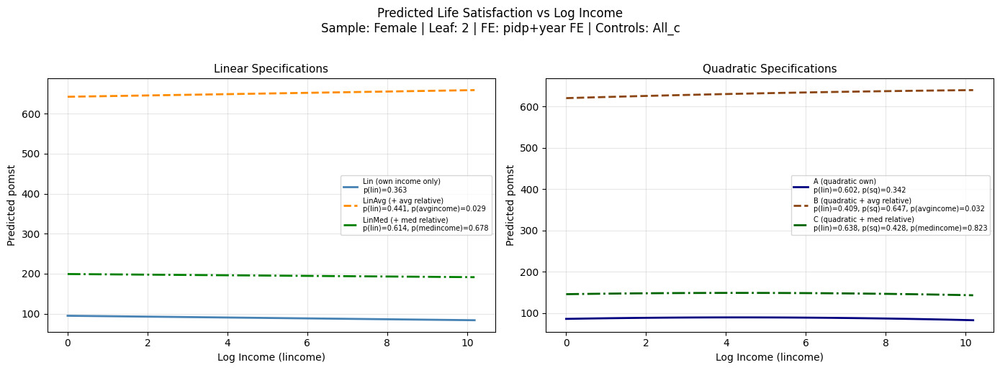

Saved: plot_Female_leaf2_All_c_pidp_year_FE.png


In [ ]:
# Female sample
for leaf in [14.0, 2.0]:
    plot_income_lifsat2(results_df, all_models, df_old_f,
                       label='Female', leaf=leaf,
                       node_col='terminal_node_f')

In [ ]:
# Check if lincome_only keys exist at all for All sample
lincome_only_keys = [k for k in all_models.keys() if k[2] == 'lincome_only' and k[0] == 'All']
print(f"Total lincome_only keys for All: {len(lincome_only_keys)}")
print("First few:", lincome_only_keys[:5])

# Specifically check leaf 3
key = ('All', 3.0, 'lincome_only', 'All_c', 'pidp+year FE')
print(f"\nKey exists: {key in all_models}")

# Check what keys DO exist for All, leaf 3
leaf3_keys = [k for k in all_models.keys() if k[0] == 'All' and k[1] == 3.0]
print(f"\nAll keys for All, leaf 3:")
for k in leaf3_keys[:10]:
    print(k)

Total lincome_only keys for All: 225
First few: [('All', np.int64(3), 'lincome_only', 'None', 'No FE'), ('All', np.int64(3), 'lincome_only', 'None', 'pidp FE'), ('All', np.int64(3), 'lincome_only', 'None', 'pidp+year FE'), ('All', np.int64(3), 'lincome_only', 'Age_c', 'No FE'), ('All', np.int64(3), 'lincome_only', 'Age_c', 'pidp FE')]

Key exists: True

All keys for All, leaf 3:
('All', np.int64(3), 'lincome_only', 'None', 'No FE')
('All', np.int64(3), 'lincome_avgincome', 'None', 'No FE')
('All', np.int64(3), 'lincome_medincome', 'None', 'No FE')
('All', np.int64(3), 'lincome_quad', 'None', 'No FE')
('All', np.int64(3), 'lincome_quad_avgincome', 'None', 'No FE')
('All', np.int64(3), 'lincome_quad_medincome', 'None', 'No FE')
('All', np.int64(3), 'lincome_only', 'None', 'pidp FE')
('All', np.int64(3), 'lincome_avgincome', 'None', 'pidp FE')
('All', np.int64(3), 'lincome_medincome', 'None', 'pidp FE')
('All', np.int64(3), 'lincome_quad', 'None', 'pidp FE')


trying a different approach

In [ ]:
def plot_relative_income3(results_df, all_models, df, label, leaf,
                         node_col='terminal_node',
                         fe_spec='pidp+year FE', controls='All_c', n_points=100):
    """
    Plots predicted pomst vs relative income for a given sample/leaf.
    Two subplots:
      Left:  avgincome on x-axis — LinAvg and B (lincome held at leaf mean)
      Right: medincome on x-axis — LinMed and C (lincome held at leaf mean)
    """

    # Get leaf subgroup
    subgroup = df[df[node_col] == leaf].copy()

    if subgroup.empty:
        print(f"No data found for leaf {leaf} in {node_col}")
        return

    # lincome held at leaf mean throughout
    lincome_mean = subgroup['lincome'].mean()

    # relative income ranges
    avgincome_range = np.linspace(subgroup['avgincome'].min(), subgroup['avgincome'].max(), n_points)
    medincome_range = np.linspace(subgroup['medincome'].min(), subgroup['medincome'].max(), n_points)

    # specs grouped by relative income type
    avg_specs = [
        ('lincome_avgincome',      'avgincome', 'LinAvg (linear + avg relative)',      'darkorange'),
        ('lincome_quad_avgincome', 'avgincome', 'B (quadratic + avg relative)',        'saddlebrown'),
    ]
    med_specs = [
        ('lincome_medincome',      'medincome', 'LinMed (linear + med relative)',      'green'),
        ('lincome_quad_medincome', 'medincome', 'C (quadratic + med relative)',        'darkgreen'),
    ]

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    for ax, spec_group, rel_var, x_range, panel_title in zip(
        axes,
        [avg_specs, med_specs],
        ['avgincome', 'medincome'],
        [avgincome_range, medincome_range],
        ['Average Relative Income (avgincome)', 'Median Relative Income (medincome)']
    ):

        for income_type, rel_var_name, line_label, color in spec_group:

            # Retrieve model
            model_key = (label, leaf, income_type, controls, fe_spec)
            if model_key not in all_models:
                continue

            model = all_models[model_key]
            params = model.params

            # Build predicted values
            pred = np.zeros(n_points)

            # Intercept
            if 'Intercept' in params:
                pred += params['Intercept']

            # Own income held at leaf mean
            if 'lincome' in params:
                pred += params['lincome'] * lincome_mean
            if 'lincome_sq' in params:
                pred += params['lincome_sq'] * (lincome_mean ** 2)

            # Vary relative income
            if rel_var_name in params:
                pred += params[rel_var_name] * x_range

            # Controls held at leaf means
            for var in ['agenew', 'agesq', 'single', 'married', 'others']:
                if var in params and var in subgroup.columns:
                    pred += params[var] * subgroup[var].mean()

            # Get p-values for legend
            row = results_df[
                (results_df['sample'] == label) &
                (results_df['leaf'] == leaf) &
                (results_df['income_type'] == income_type) &
                (results_df['controls'] == controls) &
                (results_df['fe_spec'] == fe_spec)
            ]

            if not row.empty:
                p_lin = row['pval_lincome'].values[0]
                p_sq  = row['pval_lincome_sq'].values[0]
                p_rel = row['pval_rel_income'].values[0]

                pval_str = f'p(lincome)={p_lin:.3f}'
                if not np.isnan(p_sq):
                    pval_str += f', p(sq)={p_sq:.3f}'
                if not np.isnan(p_rel):
                    pval_str += f', p({rel_var_name})={p_rel:.3f}'
                full_label = f'{line_label}\n{pval_str}'
            else:
                full_label = line_label

            ax.plot(x_range, pred, color=color, linewidth=2, label=full_label)

        ax.set_xlabel(panel_title, fontsize=10)
        ax.set_ylabel('Predicted pomst', fontsize=10)
        ax.set_title(panel_title, fontsize=11)
        ax.legend(fontsize=7.5, loc='best')
        ax.grid(True, alpha=0.3)

    fig.suptitle(
        f'Predicted Life Satisfaction vs Relative Income\n'
        f'Sample: {label} | Leaf: {int(leaf)} | FE: {fe_spec} | Controls: {controls}\n'
        f'Own income (lincome) held at leaf mean = {lincome_mean:.3f}',
        fontsize=11, y=1.02
    )
    plt.tight_layout()

    fname = f'plot_relative_{label}_leaf{int(leaf)}_{controls}_{fe_spec.replace("+","_").replace(" ","_")}.png'
    plt.savefig(fname, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'Saved: {fname}')

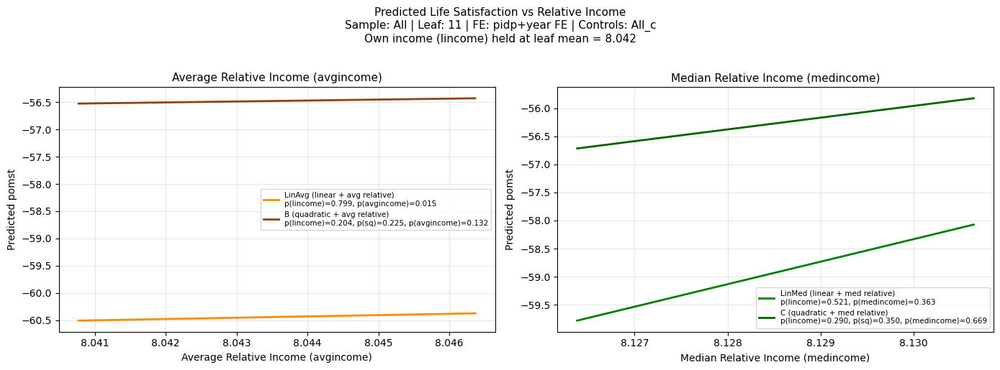

Saved: plot_relative_All_leaf11_All_c_pidp_year_FE.png


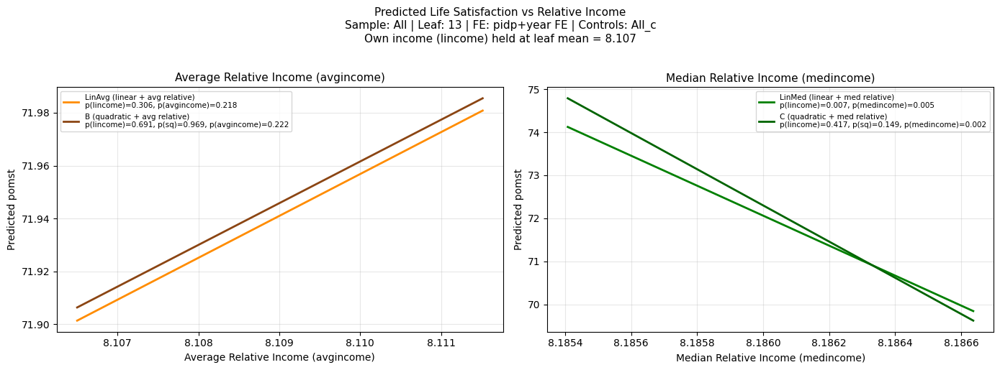

Saved: plot_relative_All_leaf13_All_c_pidp_year_FE.png


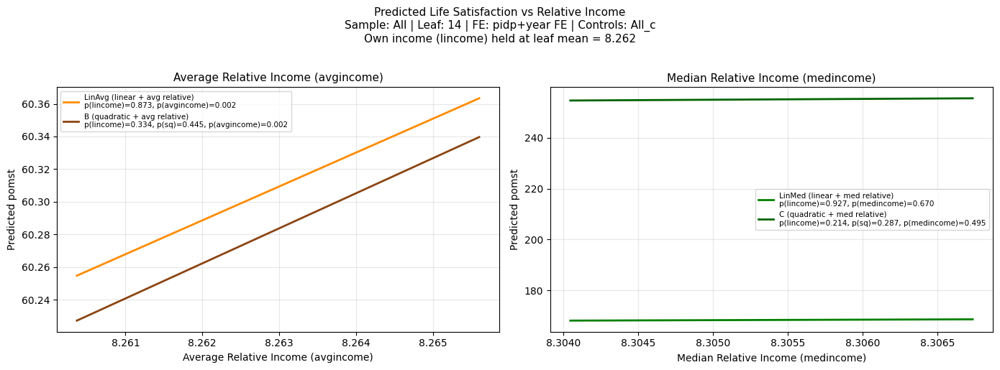

Saved: plot_relative_All_leaf14_All_c_pidp_year_FE.png


In [ ]:
# All sample — leaves with significant relative income
for leaf in [11.0, 13.0, 14.0]:
    plot_relative_income3(results_df, all_models, df_old,
                         label='All', leaf=leaf,
                         node_col='terminal_node')


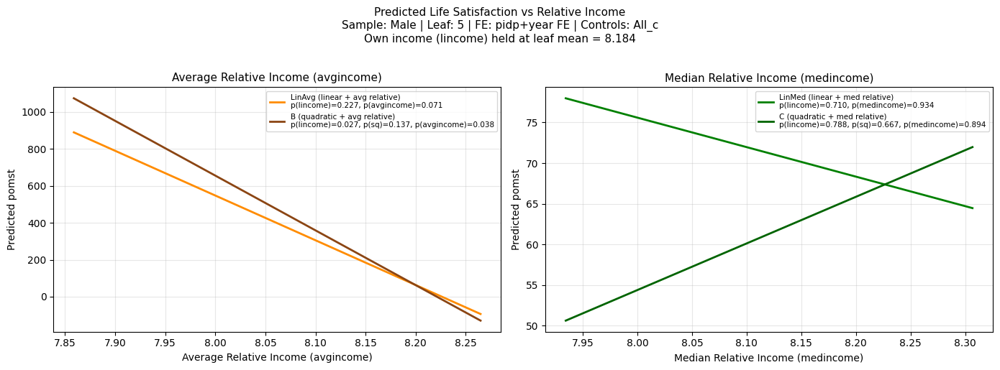

Saved: plot_relative_Male_leaf5_All_c_pidp_year_FE.png


In [ ]:
# Male sample
plot_relative_income3(results_df, all_models, df_old_m,
                     label='Male', leaf=5.0,
                     node_col='terminal_node_m')

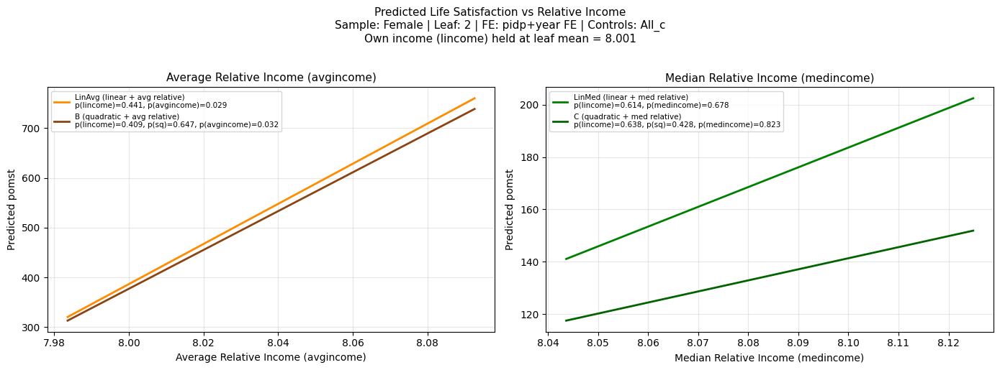

Saved: plot_relative_Female_leaf2_All_c_pidp_year_FE.png


In [ ]:
# female
plot_relative_income3(results_df, all_models, df_old_f,
                     label='Female', leaf=2.0,
                     node_col='terminal_node_f')
